# Main code

In [66]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

[sklearn.linear_model.LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)

[sklearn.linear_model.Ridge](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html#sklearn.linear_model.Ridge)

[sklearn.linear_model.ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html#sklearn.linear_model.ElasticNet)

[sklearn.linear_model.LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)

## Read and preprocess mat files

After reading and preprocessing the data in the next code chunk, the data from all cells is stored in a population dictionary. The dictionary's keys correspond to the cell names, and the values contain the data for each respective cell.

The values in the population dictionary are cell dictionaries with keys being `'axons'`, `'green_dFFMeanValues'`,and `'red_dFFMeanValues'`:

- The value of `'axons'`, e.g., `cell_data_dict['CL090_230515']['axons']` is a 1 dimensional numpy array, of which the length is the number of groups and the elements are 1 dimensional numpy arrays consisting of components belonging to the group.
- The value of `'green_dFFMeanValues'` is a 2 dimensional 3 by 49 numpy array (each cell has 3 rounds, and each round has 8 directions \* 2 time frequencies \* 3 space frequencies = 48 settings plus a extra period so in total there are 49 columns), of which the elements are still 2 dimensional numpy arrays with size being 10 by N (N is the number of components).
- The value of `'red_dFFMeanValues'` is similarly a 2 dimensional 3 by 49 numpy array, of which the elements are still 2 dimensional numpy arrays with size being 10 by 1 (only recording the data at the soma).

In [67]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# Print keys and types
for key, value in cell_data_dict.items():
    print("-- * * * * * --")
    print(key, type(value))
    for key_, value_ in value.items():
        print(key_, type(value_))
print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303
-- * * * * * --
CL090_230515 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL090_230518 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL083_230413 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL075_230303 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --


In [68]:
# print to see data type and size
print(cell_data_dict['CL090_230515'].keys())
print(type(cell_data_dict['CL090_230515']['axons']))
print(cell_data_dict['CL090_230515']['axons'].shape)
print(cell_data_dict['CL090_230515']['axons'][1].shape)
print(cell_data_dict['CL090_230515']['axons'][1].dtype)
print("--------------------------------")
print(type(cell_data_dict['CL090_230515']['green_dFFMeanValues']))
print(cell_data_dict['CL090_230515']['green_dFFMeanValues'].shape)
print(type(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1]))
print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['green_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['green_dFFMeanValues'][0,1].dtype)
print("--------------------------------")
print(type(cell_data_dict['CL090_230515']['red_dFFMeanValues']))
print(cell_data_dict['CL090_230515']['red_dFFMeanValues'].shape)
print(type(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1]))
print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['red_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['red_dFFMeanValues'][0,1].dtype)

dict_keys(['axons', 'green_dFFMeanValues', 'red_dFFMeanValues'])
<class 'numpy.ndarray'>
(25,)
(19,)
int64
--------------------------------
<class 'numpy.ndarray'>
(3, 49)
<class 'numpy.ndarray'>
(10, 281)
(10, 155)
float64
--------------------------------
<class 'numpy.ndarray'>
(3, 49)
<class 'numpy.ndarray'>
(10, 1)
(10, 2)
float64


Note:

- Four cells: `'CL090_230515'`, `'CL090_230518'`, `'CL083_230413'`, `'CL075_230303'`.

- `'red_dFFMeanValues'` and `'green_dFFMeanValues'` have 49 columns,where the last column should be excluded. They are supposed to have 3 rows (3 rounds), but `'CL090_230518'` only has 2 rows.

- In `'CL083_230413'`, elements in `'red_dFFMeanValues'` have 2 columns (10 × 2， should be 10 × 1), so `'CL083_230413'` is not used.

## Fit data to model

### Functions

In [69]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

### Reorganize the data (vstack)

In [70]:
cell_data = cell_data_dict['CL090_230515']
# cell_data = cell_data_dict['CL075_230303']

delete_small_group = True # delete groups (axons) with less than 3 components

data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
data_axons = cell_data['axons']
# print(data_axons)
# print(type(data_axons),len(data_axons),data_axons)
if delete_small_group:
    data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3])
# print(type(data_axons),len(data_axons),data_axons)

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(stacked_green.shape, 48*3*10)

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print(group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(stacked_red.shape, 48*3*10)

print(np.max(group_satcked_green), np.min(group_satcked_green))
print(np.max(stacked_red), np.min(stacked_red))

(1440, 281) 1440
(1440, 23) (23,)
(1440, 1) 1440
15.553237533160676 -5.301797778486449
0.6745208147710272 -0.24153973313562027


<ipython-input-70-a898a02bf148>:12: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3])


### Linear regression

#### Divide train and val datasets

In [71]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)


#### Ordinary linear regression

Ordinary least squares Linear Regression.

Linear Regression fits a linear model with coefficients to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

##### Fit and predict

In [72]:
# Create a LinearRegression object
model = linear_model.LinearRegression()

# Fit the model on the training data
model.fit(x_train, y_train)
# Print the fitted coefficients
print("Fitted Coefficients:", model.coef_)
# Print the fitted intercept
print("Fitted Intercept:", model.intercept_)

# Predict on the test data
y_pred = model.predict(x_test)

Fitted Coefficients: [ 0.00858669  0.00743209  0.00014154 -0.00200023  0.00347426  0.00427812
  0.00214916  0.02260626  0.00247705 -0.00569123 -0.00090012  0.02778809
  0.00892736 -0.00514382  0.00355821  0.00597681 -0.00034941  0.03004997
 -0.00226955  0.01099947 -0.03173304 -0.00569335 -0.00660043]
Fitted Intercept: -0.004212685462284843


##### Evaluate

In [73]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Mean squared error: 0.008074969164185652
Correlation coefficient: 0.603489712990602
Coefficient of determination (R-squared score, R2 score): 0.3491861509436127


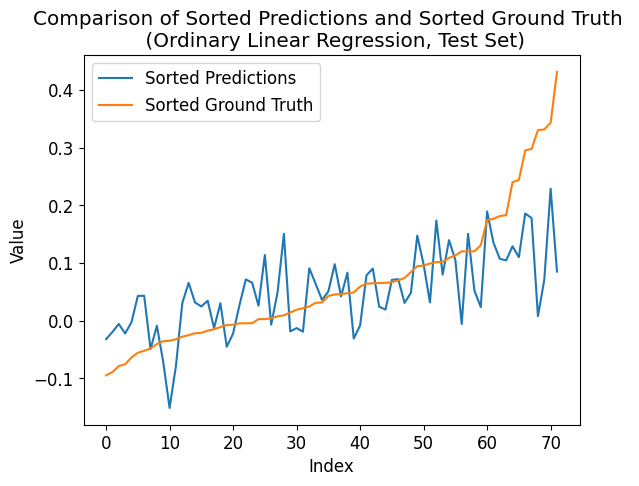

In [74]:
plot_comparison(y_test, y_pred, 'Ordinary Linear Regression, Test Set')

In [75]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Mean squared error: 0.006182229460650515
Correlation coefficient: 0.6555470128252661
Coefficient of determination (R-squared score, R2 score): 0.42974188602412944


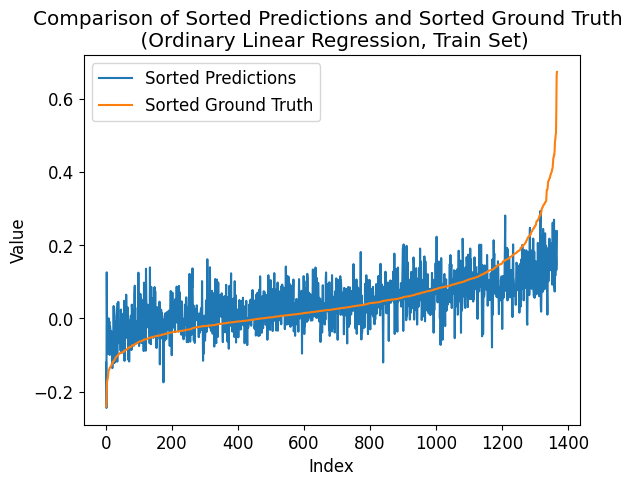

In [76]:
plot_comparison(y_train, y_pred_, 'Ordinary Linear Regression, Train Set')

In [77]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 2.4722222222222223
Correlation coefficient: 0.6337249674698427
Coefficient of determination (R-squared score, R2 score): 0.37296345222369
Mean squared error: 2.040204678362573
Correlation coefficient: 0.6307726975135022
Coefficient of determination (R-squared score, R2 score): 0.39677927369980326


#### Ridge linear regression

Linear least squares with l2 regularization.

Minimizes the objective function:

$$
||y - Xw||^2_2 + \alpha  ||w||^2_2
$$

This model solves a regression model where the loss function is the linear least squares function and regularization is given by the l2-norm.

##### Fit and predict

In [78]:
# Create a Ridge Regression object
ridge_model = linear_model.Ridge(alpha=1.0)  # You can adjust the value of alpha as per your requirements

# Fit the model on the training data
ridge_model.fit(x_train, y_train)

# Print the fitted coefficients
print("Fitted Coefficients:", ridge_model.coef_)

# Print the fitted intercept
print("Fitted Intercept:", ridge_model.intercept_)

# Predict on the test data
y_pred = ridge_model.predict(x_test)

Fitted Coefficients: [ 0.00858988  0.00743959  0.00011496 -0.00200547  0.00344948  0.00420449
  0.00216321  0.0225892   0.00250327 -0.00570704 -0.00097906  0.02775836
  0.0089764  -0.00511579  0.0035531   0.00598195 -0.00035286  0.02961701
 -0.00223236  0.01091599 -0.03089882 -0.00536224 -0.00594153]
Fitted Intercept: -0.004215410911834354


##### Evaluate

Mean squared error: 0.008074674031217798
Correlation coefficient: 0.6035147326094551
Coefficient of determination (R-squared score, R2 score): 0.34920993761312047


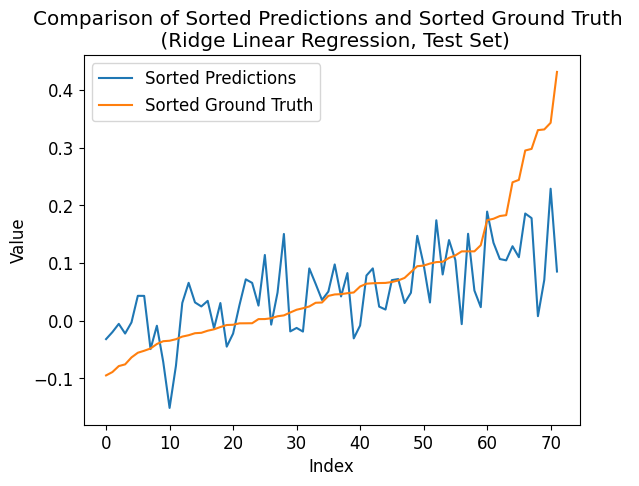

In [79]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Ridge Linear Regression, Test Set')

Mean squared error: 0.006182263250840294
Correlation coefficient: 0.6555447439462398
Coefficient of determination (R-squared score, R2 score): 0.4297387691663652


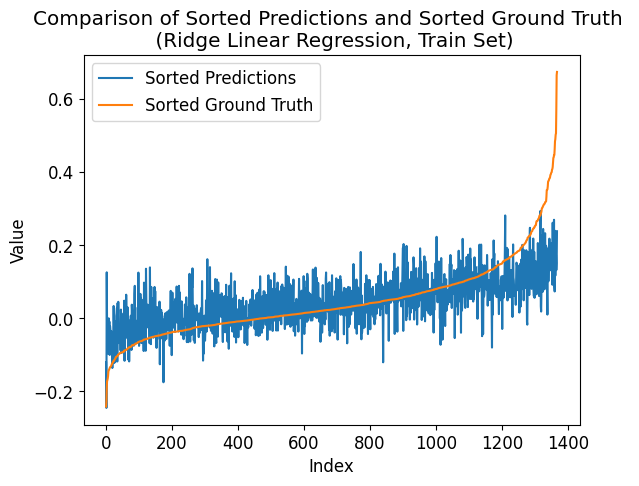

In [80]:
# predict on train
# Use the trained model to make predictions
y_pred_ = ridge_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Ridge Linear Regression, Train Set')

In [81]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 2.4722222222222223
Correlation coefficient: 0.6337249674698427
Coefficient of determination (R-squared score, R2 score): 0.37296345222369
Mean squared error: 2.040204678362573
Correlation coefficient: 0.6307433150910617
Coefficient of determination (R-squared score, R2 score): 0.39677927369980326


#### ElasticNet linear regression

Linear regression with combined L1 and L2 priors as regularizer.

Minimizes the objective function:

$$
1 / (2 * n_{samples}) * ||y - Xw||^2_2
+ \alpha * l1_{ratio} * ||w||_1
+ 0.5 * \alpha * (1 - l1_{ratio}) * ||w||^2_2
$$

If controlling the L1 and L2 penalty separately, that this is equivalent to:

$$
a * ||w||_1 + 0.5 * b * ||w||_2^2
$$

where: $\alpha = a + b$ and $l1_{ratio} = a / (a + b)$.

##### Fit and predict

In [82]:
# Create an ElasticNet object
a = 0.004; b = 0.00
alpha = a + b; l1_ratio = a / (a + b)
elasticnet_model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=100000)
# adjust the values of alpha and l1_ratio as per your requirements

# Fit the model on the training data
elasticnet_model.fit(x_train, y_train)

# Print the fitted coefficients
print("Fitted Coefficients:", elasticnet_model.coef_)

# Print the fitted intercept
print("Fitted Intercept:", elasticnet_model.intercept_)

# Predict on the test data
y_pred = elasticnet_model.predict(x_test)

# It is normal to encounter warning here, because our data is not linear enough
# and not normailized to guarantee a low error/residual, even though we set a very
# large max_iter. But the results is similar to that of ordinary and Ridge linear
# regression. Like alpha = 0 results in the same results as the ordinary linear
# rergession.

Fitted Coefficients: [ 0.00951724  0.0068485   0.         -0.          0.00285676  0.
  0.          0.01545406  0.00635406 -0.          0.          0.02601547
  0.00529342 -0.          0.          0.00326147  0.          0.
  0.          0.         -0.          0.          0.        ]
Fitted Intercept: -0.004587622786060119


##### Evaluate

Mean squared error: 0.008246618904776503
Correlation coefficient: 0.593481482809575
Coefficient of determination (R-squared score, R2 score): 0.33535179119658987


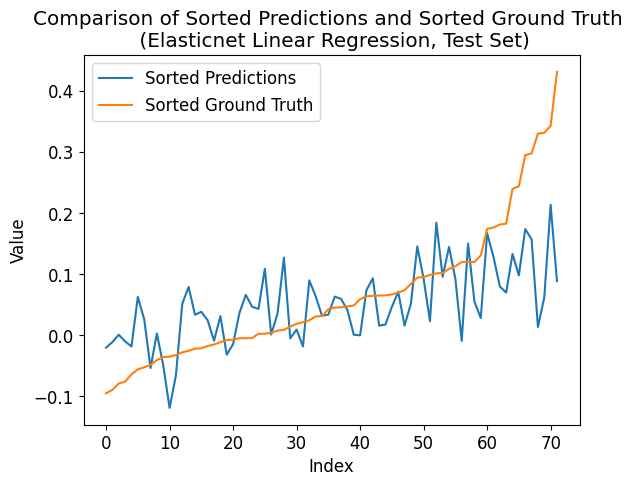

In [83]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Elasticnet Linear Regression, Test Set')

Mean squared error: 0.006385274236585692
Correlation coefficient: 0.6428087118878939
Coefficient of determination (R-squared score, R2 score): 0.4110127314829676


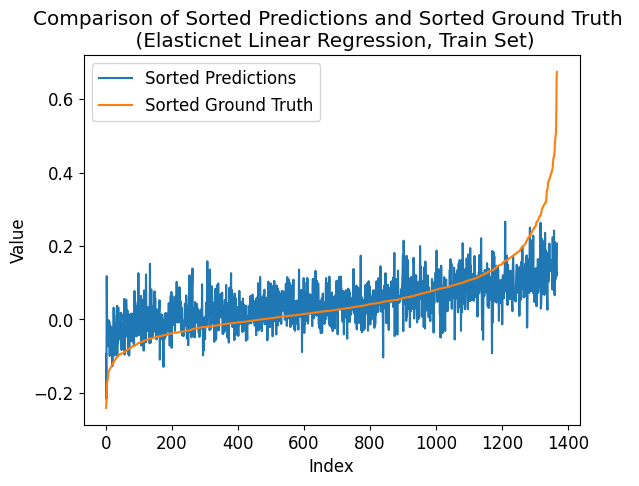

In [84]:
# predict on train
# Use the trained model to make predictions
y_pred_ = elasticnet_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Elasticnet Linear Regression, Train Set')

In [85]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 2.7777777777777777
Correlation coefficient: 0.566099913342907
Coefficient of determination (R-squared score, R2 score): 0.2954645530603258
Mean squared error: 2.1052631578947367
Correlation coefficient: 0.6144590454550366
Coefficient of determination (R-squared score, R2 score): 0.3775436432301804


### Power-law regression

Mathematically, a power-law relationship can be expressed as:

$$
y = A  X^C
$$

Here, I modify it, shown as:

$$
y = A  (X+B)^C + D
$$

where, $X = \beta_1 x_1 + \beta_2 x_2 \dots + \beta_N x_N$. $X+D$ is a linear regression part. $A$, $B$, $C$, $D$, $\beta_1$, $\beta_2$, ...,$\beta_N$ are parameters to be determined.

#### Divide train and val datasets

In [86]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)


#### Fit, predict and evaluate (Example 1)

Fitted Parameters: [ 2.77673174e+00  5.43999910e-01 -1.35647651e-01  5.36004086e-03
  4.62291296e-03 -4.48053143e-04 -1.51574443e-04  2.89567093e-03
  3.50802638e-03  1.95878489e-03  1.43654331e-02  1.08620098e-03
 -4.47666558e-03  5.30100512e-04  1.74140339e-02  5.56480031e-03
 -4.62509903e-03  1.38103461e-03  3.31131634e-03 -2.81684741e-04
  1.90354684e-02 -8.59289923e-03  7.64034998e-03 -2.51367545e-02
 -3.33187351e-03 -1.18174866e-02]
Mean squared error: 0.007899697746818354
Correlation coefficient: 0.6150864301916624
Coefficient of determination (R-squared score, R2 score): 0.3633124049821176


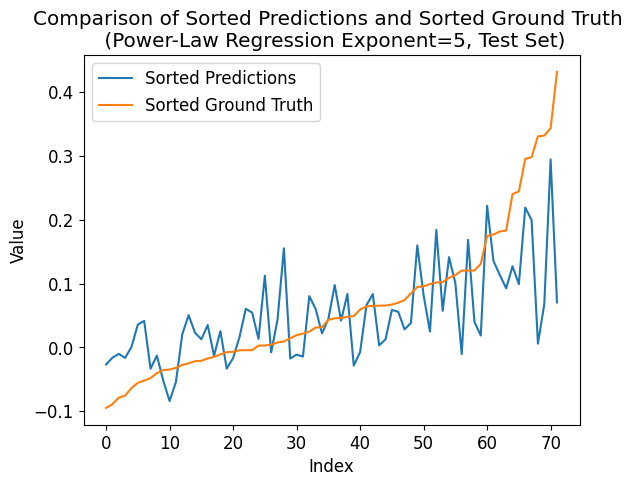

Mean squared error: 0.0059866374659903725
Correlation coefficient: 0.6691663357118757
Coefficient of determination (R-squared score, R2 score): 0.4477835848471192


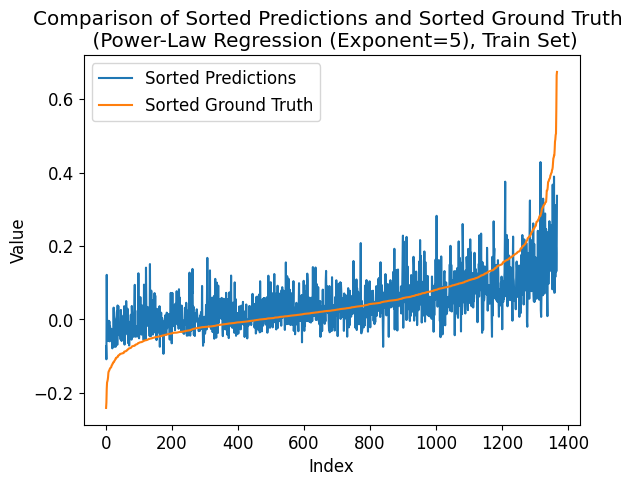

---- ---- ----
Mean squared error: 2.513888888888889
Correlation coefficient: 0.6251978930658115
Coefficient of determination (R-squared score, R2 score): 0.36239542051959495
Mean squared error: 1.9400584795321638
Correlation coefficient: 0.6535701067438148
Coefficient of determination (R-squared score, R2 score): 0.4263891767822565


In [87]:
exponent = 5
# Define the model function
def func(X, *params):
    A, B, D = params[:3]
    # Compute the weighted sum
    weighted_sum = np.sum(X * np.array(params[3:]), axis=1)
    base = weighted_sum + B
    power_result = np.power(base, exponent)
    return A * power_result + D

# Create a LinearRegression object
model = linear_model.LinearRegression()

# give the initial params using linear regression
# so that the params are within a reasonable range
model.fit(x_train, y_train)
# print("Fitted Coefficients:", model.coef_)
# print("Fitted Intercept:", model.intercept_)
num_features = x_train.shape[1]
# Assuming model.coef_ is the np array containing the coefficients
model_coefs = model.coef_
# Set negative elements to 0 using np.clip()
initial_params = [1, model.intercept_, 0] + list(model_coefs) # Initial parameter guesses
# model_coefs_clipped = np.clip(model_coefs, 0, np.inf)
# initial_params = [1, model.intercept_, 0] + list(model_coefs_clipped) # Initial parameter guesses, no need to clip -- they can be negative

# Set lower and upper bounds for the parameters
lower_bounds = [0, -np.inf, -np.inf] + [0] * num_features
upper_bounds = [np.inf, np.inf, np.inf] + [np.inf] * num_features

# Combine the lower and upper bounds into a 2-tuple of array_like
bounds = (lower_bounds, upper_bounds)

# Perform the curve fit with bounds
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)
# params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, bounds=bounds, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)

# predict on test
A, B, D = params[:3]
weighted_sum = np.sum(x_test * np.array(params[3:]), axis=1)
base = weighted_sum + B
abs_base = np.abs(base)
sign = np.sign(base)
power_result = np.power(abs_base, exponent)
y_pred = A * sign * power_result + D

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Power-Law Regression Exponent=5, Test Set')


# predict on train
A, B, D = params[:3]
weighted_sum = np.sum(x_train * np.array(params[3:]), axis=1)
base = weighted_sum + B
abs_base = np.abs(base)
sign = np.sign(base)
power_result = np.power(abs_base, exponent)
y_pred_ = A * sign * power_result + D

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Power-Law Regression (Exponent=5), Train Set')

# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

#### Fit, predict and evaluate (Example 2)

Fitted Coefficients: [ 0.00858669  0.00743209  0.00014154 -0.00200023  0.00347426  0.00427812
  0.00214916  0.02260626  0.00247705 -0.00569123 -0.00090012  0.02778809
  0.00892736 -0.00514382  0.00355821  0.00597681 -0.00034941  0.03004997
 -0.00226955  0.01099947 -0.03173304 -0.00569335 -0.00660043]
Fitted Intercept: -0.004212685462284843
Fitted Parameters: [3.27606220e+02 3.68048107e-02]
Mean squared error: 0.010328443830817775
Correlation coefficient: 0.4811494140668785
Coefficient of determination (R-squared score, R2 score): 0.1675640924908589


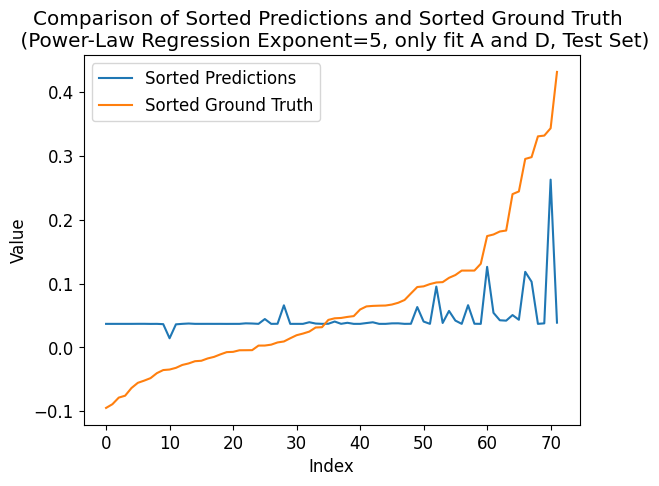

Mean squared error: 0.008925232118984414
Correlation coefficient: 0.42038459588030785
Coefficient of determination (R-squared score, R2 score): 0.1767232084534498


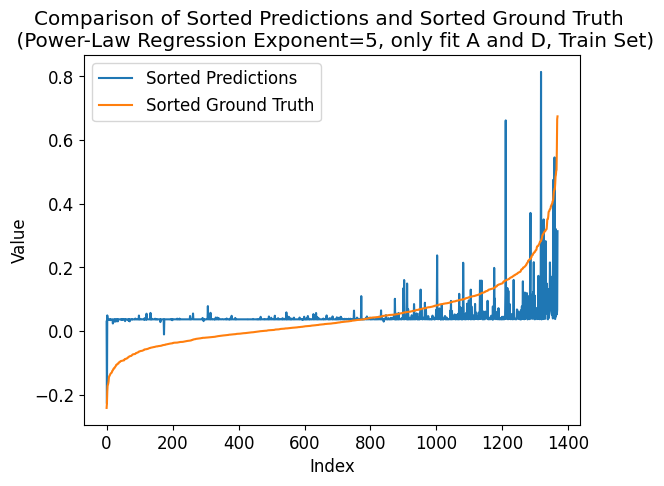

In [88]:
# compared with example 1, here only fit A and D.

exponent = 5

model = linear_model.LinearRegression()
model.fit(x_train, y_train)
# now we have: model.intercept_ and model.coef_
# Print the fitted coefficients
print("Fitted Coefficients:", model.coef_)
# Print the fitted intercept
print("Fitted Intercept:", model.intercept_)

# Define the model function
def func(X, A, D):
    # Compute the weighted sum
    weighted_sum = np.sum(X * np.array(model.coef_), axis=1)
    base = weighted_sum
    power_result = np.power(base, exponent)
    return A * power_result + D

initial_params = [1, 0]

# Perform the curve fit
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)


# predict on test
A, D = params
y_pred = func(x_test, A, D)

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Power-Law Regression Exponent=5, only fit A and D, Test Set')

# predict on train
A, D = params
y_pred_ = func(x_train, A, D)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Power-Law Regression Exponent=5, only fit A and D, Train Set')

#### Fit and predict

109/91
55/39
90/43
54/11


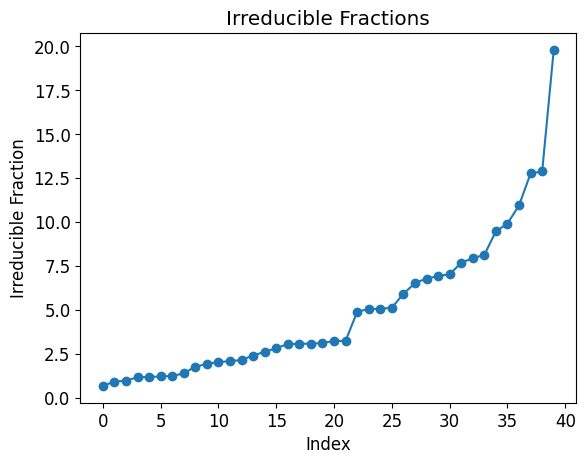

In [89]:
# generate irreducible fraction with an odd number as the denominator
# such numbers can work as the exponent for negative numbers and
# will be used as the parameter "C" in Power-law regression below:
# y = A * (B+b1*x1+b2*x2+...+bN*xN)**C + D

def gcd(a, b): # calculate the greatest common divisor of two numbers
    while b:
        a, b = b, a % b
    return a

def generate_irreducible_fraction(existing_fractions = []):
    while True:
        numerator = random.randint(1, 400)  # Random numerator
        denominator = random.randrange(1, 100, 2)  # Random odd denominator
        if gcd(numerator, denominator) == 1:  # Check if the fraction is irreducible
            fraction = (numerator, denominator)
            if fraction not in existing_fractions:  # Check if the fraction is not a duplicate
                return fraction

# Generate irreducible fraction numbers
N_faction = 40
upper_bound = 50
irreducible_fractions = []
while len(irreducible_fractions) < N_faction:
    fraction = generate_irreducible_fraction(irreducible_fractions)
    if fraction[0]/fraction[1] < upper_bound:
        irreducible_fractions.append(fraction)

# Sort the irreducible fractions
irreducible_fractions.sort(key=lambda f: f[0] / f[1])

# Print the irreducible fraction numbers
for numerator, denominator in irreducible_fractions:
    if random.random() <= 0.1:
        print(f"{numerator}/{denominator}")


# Extract the numerator and denominator values
indexes = range(1, len(irreducible_fractions) + 1)
values = [numerator / denominator for numerator, denominator in irreducible_fractions]

# Plot the irreducible fractions
plt.plot(values, 'o-')
plt.xlabel("Index")
plt.ylabel("Irreducible Fraction")
plt.title("Irreducible Fractions")
plt.show()

## if not use the above random generated irreducible_fractions, define it below.
irreducible_fractions = [(1,95), (30,43), (179,65), (5,1), (221,33), (219,23), (300,17), (73,3)]

In [90]:
# # old code! The new one is in the next chunk.

# params_list = []
# for numerator, denominator in irreducible_fractions:
#     C1, C2 = numerator, denominator

#     # Define the model function
#     def func(X, *params):
#         A, B, D = params[:3]
#         # Compute the weighted sum
#         weighted_sum = np.sum(X * np.array(params[3:]), axis=1)
#         base = weighted_sum + B
#         abs_base = np.abs(base)
#         sign = np.sign(base)
#         power_result = np.power(abs_base, C1 / C2)
#         return A * sign * power_result + D

#     # Create a LinearRegression object
#     model = linear_model.LinearRegression()

#     # give the initial params using linear regression
#     # so that the params are within a reasonable range
#     model.fit(x_train, y_train)
#     # print("Fitted Coefficients:", model.coef_)
#     # print("Fitted Intercept:", model.intercept_)
#     num_features = x_train.shape[1]
#     initial_params = [1, model.intercept_, 0] + list(model.coef_) # Initial parameter guesses

#     # Perform the curve fit
#     params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)
#     params_list.append(params)

#     # Print the fitted parameters
#     # print("Fitted Parameters:", params)

# # predict on test
# y_predict_test_list = []
# for (numerator, denominator), params in zip(irreducible_fractions, params_list):
#     C1, C2 = numerator, denominator
#     A, B, D = params[:3]
#     weighted_sum = np.sum(x_test * np.array(params[3:]), axis=1)
#     base = weighted_sum + B
#     abs_base = np.abs(base)
#     sign = np.sign(base)
#     power_result = np.power(abs_base, C1 / C2)
#     y_pred = A * sign * power_result + D
#     y_predict_test_list.append(y_pred)

# # predict on train
# y_predict_train_list = []
# for (numerator, denominator), params in zip(irreducible_fractions, params_list):
#     C1, C2 = numerator, denominator
#     A, B, D = params[:3]
#     weighted_sum = np.sum(x_train * np.array(params[3:]), axis=1)
#     base = weighted_sum + B
#     abs_base = np.abs(base)
#     sign = np.sign(base)
#     power_result = np.power(abs_base, C1 / C2)
#     y_pred_ = A * sign * power_result + D
#     y_predict_train_list.append(y_pred_)

In [91]:
# new code, a updated version for the code in last chunk.
# input and output data normalization is achieved (but it
# seems normalization is redundant).

class CurveFit_with_Normalization:
    def __init__(self, exponent_numerator=1, exponent_denominator=1, input_range=[1,2], output_range=[1,2]):
        self.input_min = input_range[0]
        self.input_max = input_range[1]
        self.output_min = output_range[0]
        self.output_max = output_range[1]
        self.input_scale = None
        self.input_shift = None
        self.output_scale = None
        self.output_shift = None
        self.exponent_numerator = exponent_numerator
        self.exponent_denominator = exponent_denominator
        self.linear_model = linear_model.LinearRegression()

    def fit(self, X, y):
        # Normalize the input and output data
        self.input_scale = (self.input_max - self.input_min) / (np.max(X) - np.min(X))
        self.input_shift = self.input_min - np.min(X) * self.input_scale
        normalized_X = self.input_scale * X + self.input_shift

        self.output_scale = (self.output_max - self.output_min) / (np.max(y) - np.min(y))
        self.output_shift = self.output_min - np.min(y) * self.output_scale
        normalized_y = self.output_scale * y + self.output_shift

        def normalized_func_(X_normalize, *params):
            A, B, D = params[:3]
            # Compute the weighted sum
            weighted_sum = np.sum(X_normalize * np.array(params[3:]), axis=1)
            base = weighted_sum + B
            abs_base = np.abs(base)
            sign = np.sign(base)
            power_result = np.power(abs_base, self.exponent_numerator / self.exponent_denominator)
            return A * sign * power_result + D

        # Give the initial params using linear regression
        self.linear_model.fit(normalized_X, normalized_y)
        # print("Fitted Coefficients:", linear_model.coef_)
        # print("Fitted Intercept:", linear_model.intercept_)
        # num_features = X.shape[1]
        exponent = self.exponent_numerator / self.exponent_denominator
        initial_params = [1, self.linear_model.intercept_ / exponent + (1 - 1 / exponent), 0] + list(self.linear_model.coef_ /
                        exponent)  # Initial parameter guesses
        # initial_params = [1, 0, 0] + [1 / X.shape[1]] * (X.shape[1])

        # Perform the normalized curve fit
        normalized_params, params_covariance = curve_fit(normalized_func_, normalized_X, normalized_y,
                                  p0=initial_params, maxfev=100000000)

        # Store the fitted parameters
        self.normalized_fitted_params = normalized_params

    def predict(self, X):
        # Normalize the input data using the previously calculated scaling and shifting parameters
        normalized_X = self.input_scale * X + self.input_shift

        # Make predictions using the denormalized parameters
        y_pred = self.normalized_func(normalized_X, self.exponent_numerator,
                              self.exponent_denominator, *self.normalized_fitted_params)

        # Denormalize the predicted output
        y_pred = (y_pred - self.output_shift) / self.output_scale

        return y_pred

    @staticmethod
    def normalized_func(X_normalize, exponent_numerator, exponent_denominator, *params):
        A, B, D = params[:3]
        # Compute the weighted sum
        weighted_sum = np.sum(X_normalize * np.array(params[3:]), axis=1)
        base = weighted_sum + B
        abs_base = np.abs(base)
        sign = np.sign(base)
        power_result = np.power(abs_base, exponent_numerator / exponent_denominator)
        return A * sign * power_result + D

model_list = []
for numerator, denominator in irreducible_fractions:
    # Create an instance of NormalizedCurveFit
    model = CurveFit_with_Normalization(numerator, denominator, input_range=[1, 2], output_range=[1, 2])

    # Fit the model to your input and output data
    model.fit(x_train, y_train)

    model_list.append(model)


-------- 
 (numerator, denominator) is: (1, 95)
Mean squared error: 0.012559302224213718
Correlation coefficient: 0.519175091374801
Coefficient of determination (R-squared score, R2 score): -0.012235174625250256
-------- 
 (numerator, denominator) is: (30, 43)
Mean squared error: 0.008075857162392383
Correlation coefficient: 0.603432316751359
Coefficient of determination (R-squared score, R2 score): 0.3491145814404819
-------- 
 (numerator, denominator) is: (179, 65)
Mean squared error: 0.00789042898506367
Correlation coefficient: 0.61554643130327
Coefficient of determination (R-squared score, R2 score): 0.3640594342760879
-------- 
 (numerator, denominator) is: (5, 1)
Mean squared error: 0.00789966753519557
Correlation coefficient: 0.6150879508419141
Coefficient of determination (R-squared score, R2 score): 0.363314839931665
-------- 
 (numerator, denominator) is: (221, 33)
Mean squared error: 0.007902039555052844
Correlation coefficient: 0.6149662659577605
Coefficient of determinatio

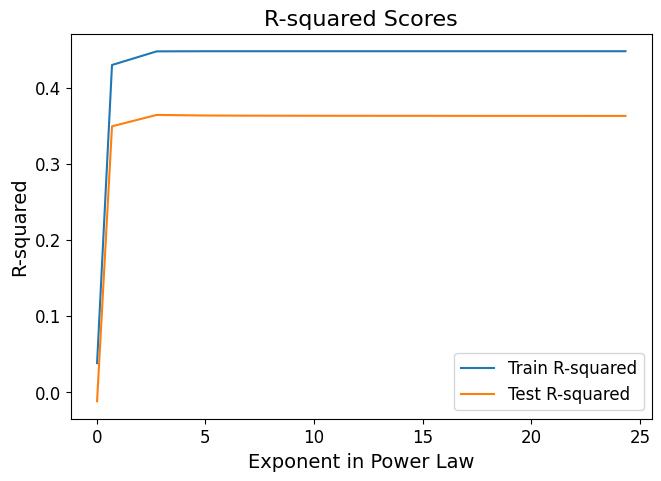

In [92]:
# this is for the new version code in the last chunk

r2_score_test_list = []

# predict on test
y_predict_test_list = []
for model, (numerator, denominator) in zip(model_list, irreducible_fractions):
    y_pred = model.predict(x_test)

    print(f'-------- \n (numerator, denominator) is: ({numerator}, {denominator})')

    mse = mean_squared_error(y_test, y_pred)
    print("Mean squared error:", mse)

    correlation = np.corrcoef(y_pred, y_test)[0, 1]
    print("Correlation coefficient:", correlation)

    r_squared = r2_score(y_test, y_pred)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)

    r2_score_test_list.append(r_squared)

    y_predict_test_list.append(y_pred)

print("|||||||||||||||||||||||||||||||||||||")

r2_score_train_list = []

# predict on train
y_predict_train_list = []
for model, (numerator, denominator) in zip(model_list, irreducible_fractions):
    y_pred_ = model.predict(x_train)

    print(f'-------- \n (numerator, denominator) is: ({numerator}, {denominator})')

    mse = mean_squared_error(y_train, y_pred_)
    print("Mean squared error:", mse)

    # Calculate the correlation coefficient
    correlation = np.corrcoef(y_pred_, y_train)[0, 1]
    print("Correlation coefficient:", correlation)

    r_squared = r2_score(y_train, y_pred_)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)

    r2_score_train_list.append(r_squared)

    y_predict_train_list.append(y_pred_)


x = [numerator / denominator for (numerator, denominator) in irreducible_fractions]



# plot the r2 score curve over exponent
fig, ax = plt.subplots(figsize=(7.5, 5))  # Adjust the values as desired

# Plot the R-squared scores
ax.plot(x, r2_score_train_list, label='Train R-squared')
ax.plot(x, r2_score_test_list, label='Test R-squared')

# Set labels and title with font size
ax.set_xlabel('Exponent in Power Law', fontsize=14)
ax.set_ylabel('R-squared', fontsize=14)
ax.set_title('R-squared Scores', fontsize=16)

# Set tick label font size
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# Set legend
ax.legend(fontsize=12)

fig.savefig('Power_Law_r2_scores_plot.png')

# Display the plot
plt.show()

In [93]:
# for model in model_list:
#     print(model.exponent_numerator, model.exponent_denominator)

#### Evaluate

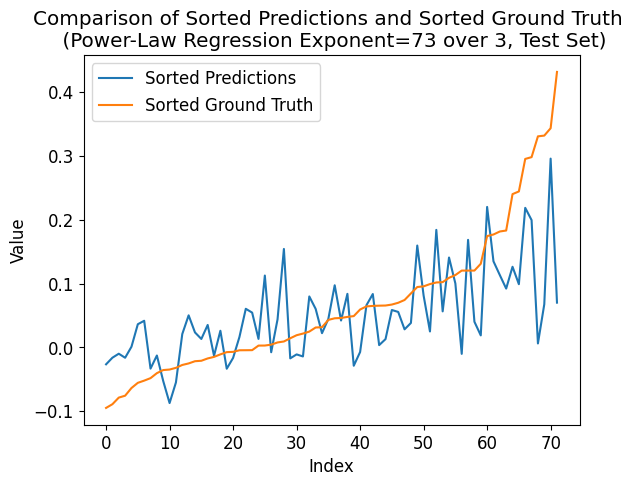

0.018717463150803165


In [94]:
# both the old and new versions (in the last subsection "Fit and predict") of code
# share the same evaluate code in this subsectoon.

# Create and update multiple figures (test)
for y_pred, (numerator, denominator) in zip(y_predict_test_list, irreducible_fractions):
    plot_comparison(y_test, y_pred, f'Power-Law Regression Exponent={numerator} over {denominator}, Test Set')
    # here pay attention: cannot use / replace over in the name, otherwise cannot save the fig
    # because / cannot be in a file name.
    print(y_pred[0])
    clear_output(wait=True)  # Clear the previous output

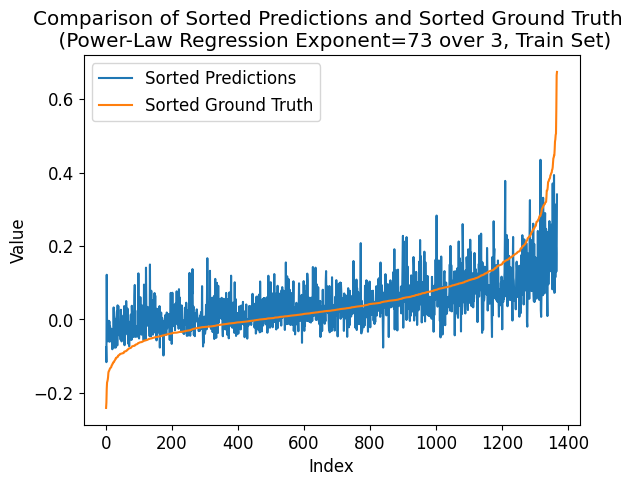

0.09086895719690612


In [95]:
# Create and update multiple figures (train)
for y_pred_, (numerator, denominator) in zip(y_predict_train_list, irreducible_fractions):
    plot_comparison(y_train, y_pred_, f'Power-Law Regression Exponent={numerator} over {denominator}, Train Set')
    print(y_pred_[0])
    clear_output(wait=True)  # Clear the previous output

### Exponential regression

Let $B = (b_1, b_2, \ldots , b_N)$.
$$
y = A \cdot e^{(b_1 \cdot x_1 + \ldots + b_N \cdot x_N)} + C
$$

#### Divide train and val datasets

In [96]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)


#### Fit and predict

In [97]:
# Define the model function
def func(X, *params):
    A, C = params[:2]
    return A * np.exp(np.sum(X * np.array(params[2:]), axis=1)) + C

# give the initial params using linear regression
# so that the params are within a reasonable range
num_features = x_train.shape[1]
initial_params = [np.mean(y_train), 0] + [0] * num_features # Initial parameter guesses

# Perform the curve fit
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)

# predict on test
A, C = params[:2]
y_pred = A * np.exp(np.sum(x_test * np.array(params[2:]), axis=1)) + C

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

# predict on train
A, C = params[:2]
y_pred_ = A * np.exp(np.sum(x_train * np.array(params[2:]), axis=1)) + C

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

r2_score_train_list.append(r_squared)

# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Fitted Parameters: [ 0.1823746  -0.18536285  0.03597331  0.0307567  -0.00330851 -0.00091631
  0.01954615  0.02318797  0.01372602  0.09625164  0.00709798 -0.02993611
  0.00246999  0.11763575  0.03731833 -0.03118017  0.00842956  0.02293895
 -0.00277306  0.12789089 -0.05908822  0.05215503 -0.16760929 -0.02179579
 -0.07699066]
Mean squared error: 0.007908076477834208
Correlation coefficient: 0.6146448099384035
Coefficient of determination (R-squared score, R2 score): 0.3626371090061502
Mean squared error: 0.005986673289208099
Correlation coefficient: 0.6691638666723004
Coefficient of determination (R-squared score, R2 score): 0.4477802804598092
---- ---- ----
[ 0.01875636  0.15397279  0.12609907  0.06998503  0.04392775  0.21967305
 -0.01277599  0.14068255  0.08104014  0.21846992 -0.0073211   0.05619991
 -0.01621427  0.02825998 -0.05298555 -0.01625067 -0.05514395  0.11258016
  0.09896961  0.00616822  0.04468552  0.13469012  0.01325329  0.05852102
  0.01324546  0.06602263  0.07967526  0.0223

#### Evaluate

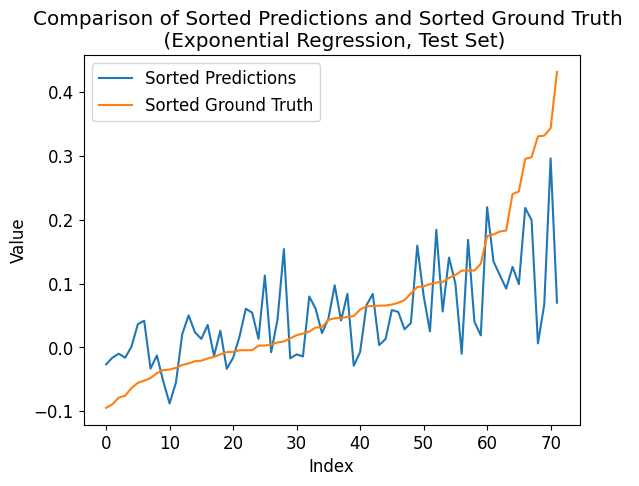

In [98]:
plot_comparison(y_test, y_pred, 'Exponential Regression, Test Set')

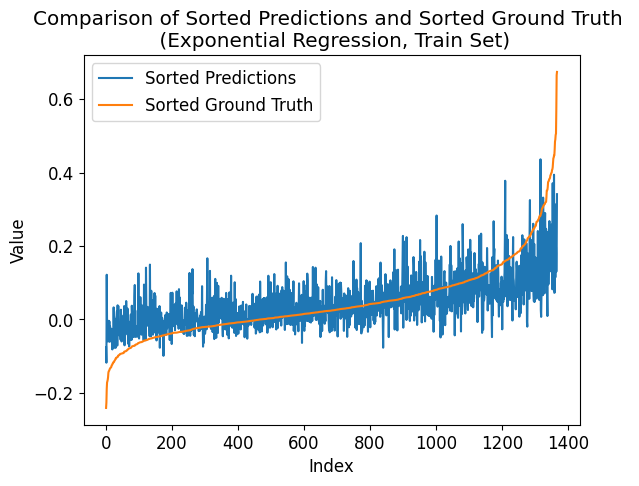

In [99]:
plot_comparison(y_train, y_pred_, 'Exponential Regression, Train Set')

### Logistic regression

#### Divide train and val datasets

In [100]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
Unique elements: [  0   7  27  36  38  40  43  50  52  54  55  56  57  58  60  61  62  63
  65  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83
  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101
 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119
 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137
 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191
 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 210
 211 212 213 214 215 216 217 218 219 220 222 223 224 226 227 228 229 230
 231 232 233 234 235 237 238 240 242 243 244 245 246 247 250 251 253 254
 255 256 257 258 259 260 263 265 266 267 268 269 270 272 273 274 277 280
 283 285 286 28

#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [101]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
# print("Coefficients:", model.coef_[0,:])
# print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
# print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(253,) (253, 23)
--- --- ---
y_prob.shape: (72, 253)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
y_pred: [122 168 182 158 129 293 132 244 223 291 122 161 110 108 132  84  78 138
 211 145 131 199 116 129 130 184 163 137 165 153 141 126 188 113 148  75
 327 166 131 117 108 134 120 124 132 141 184 211 196 127 130 138  97 144
 134 129 126 103 183 145 123 135 145 106 162 145 119 171 138 122 184 170]
y_test: [195 131 252 352 130 217 105 183 176 281 157 180  79 165 107  86 109 128
 254 299 149 219 127 161 115 160 139 143  97 185 152 134 189 128 113 101
 306 160 142 122 122 124 300 124 124 137 176 282 115 178  99 150 117 151
 160 222 189 108 179  76 189 112 120  93 150 136  85 221 170 118 160 163]
y_pred shape: (72,) y_test shape: (72,)


#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.013888888888888888
Mean squared error: 2563.9444444444443
Correlation coefficient: 0.5661491222250555
Coefficient of determination (R-squared score, R2 score): 0.24678329168154234


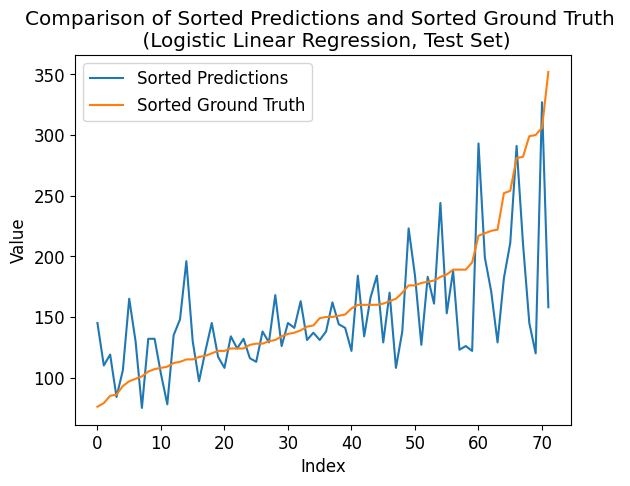

In [102]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.23538011695906433
Mean squared error: 1430.1345029239767
Correlation coefficient: 0.7554692735579654
Coefficient of determination (R-squared score, R2 score): 0.5193623267069408


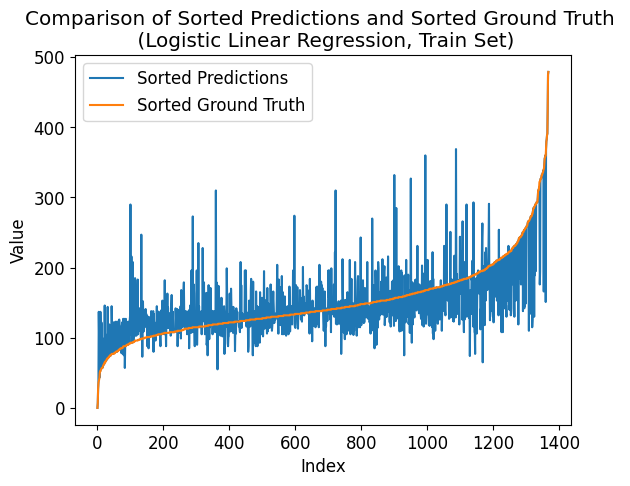

In [103]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [104]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[122 168 182 158 129 293 132 244 223 291 122 161 110 108 132  84  78 138
 211 145 131 199 116 129 130 184 163 137 165 153 141 126 188 113 148  75
 327 166 131 117 108 134 120 124 132 141 184 211 196 127 130 138  97 144
 134 129 126 103 183 145 123 135 145 106 162 145 119 171 138 122 184 170]
[ 4  5  6  5  4  9  4  8  7  9  4  5  3  3  4  2  2  4  7  4  4  6  3  4
  4  6  5  4  5  5  4  4  6  3  4  2 10  5  4  3  3  4  4  4  4  4  6  7
  6  4  4  4  3  4  4  4  4  3  6  4  4  4  4  3  5  4  3  5  4  4  6  5]
Mean squared error: 2.7222222222222223
Correlation coefficient: 0.6060794440849583
Coefficient of determination (R-squared score, R2 score): 0.3095552619991193
Mean squared error: 1.7185672514619883
Correlation coefficient: 0.7430224939475898
Coefficient of determination (R-squared score, R2 score): 0.4918767726507479


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 16
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 3.638888888888889
Correlation coefficient: 0.4687928259791623
Coefficient of determination (R-squared score, R2 score): 0.07705856450902682
train eval:
Mean squared error: 2.3077485380116958
Correlation coefficient: 0.5888470929409589
Coefficient of determination (R-squared score, R2 score): 0.3176754450269721


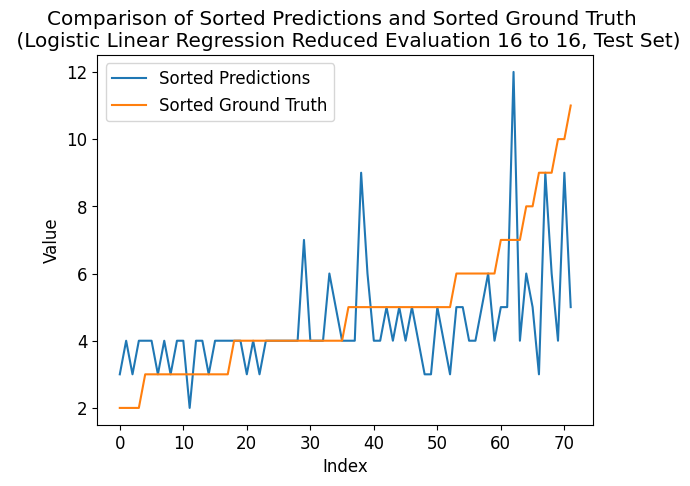

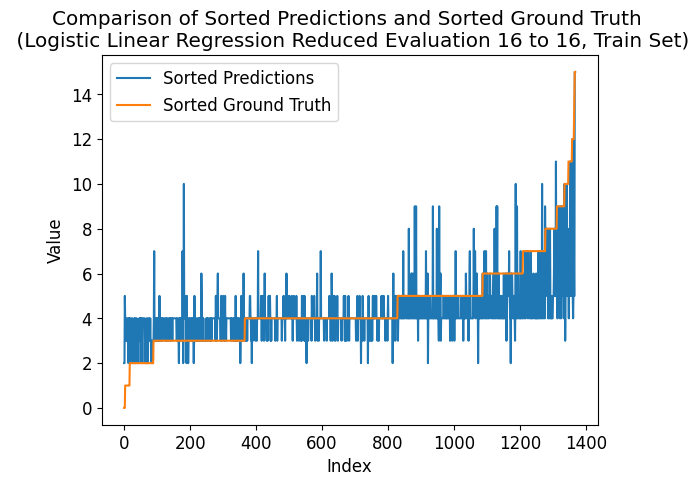

---- ---- ----
class_num = 32
Number of unique elements: 29
[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 3.1527777777777777
Correlation coefficient: 0.5487438273703586
Coefficient of determination (R-squared score, R2 score): 0.2003522677234698
train eval:
Mean squared error: 2.2112573099415203
Correlation coefficient: 0.6184086486227316
Coefficient of determination (R-squared score, R2 score): 0.34620469471225546


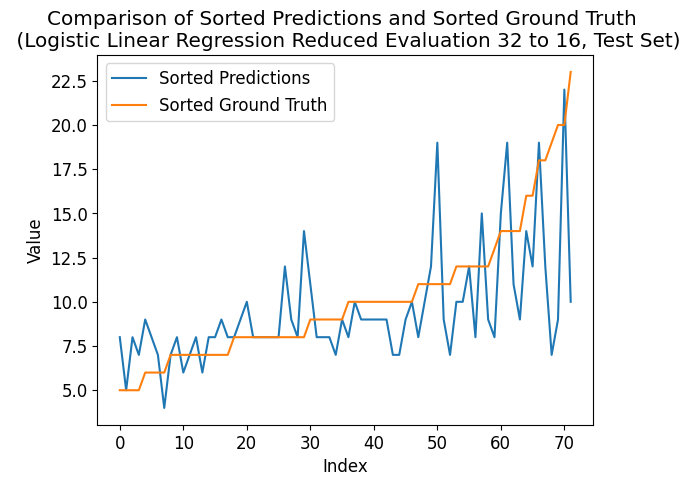

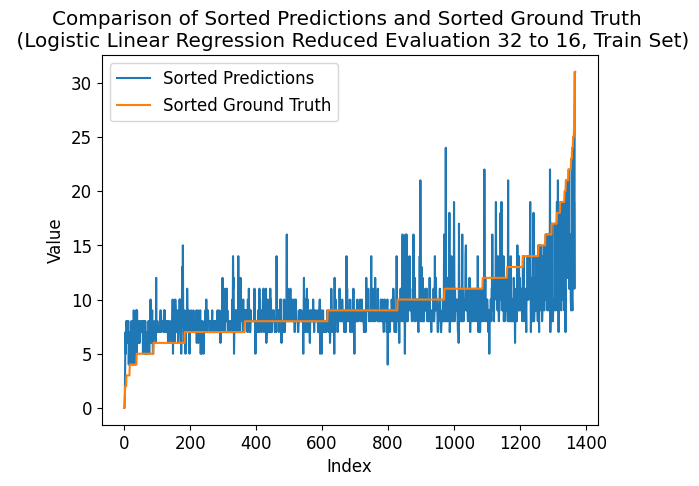

---- ---- ----
class_num = 48
Number of unique elements: 40
[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 3.4166666666666665
Correlation coefficient: 0.49941168671042274
Coefficient of determination (R-squared score, R2 score): 0.1334214002642008
train eval:
Mean squared error: 2.236842105263158
Correlation coefficient: 0.6163107352143256
Coefficient of determination (R-squared score, R2 score): 0.33864012093206664


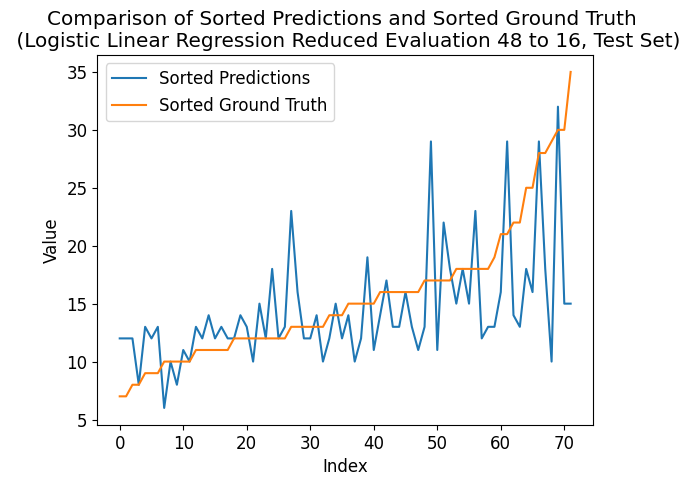

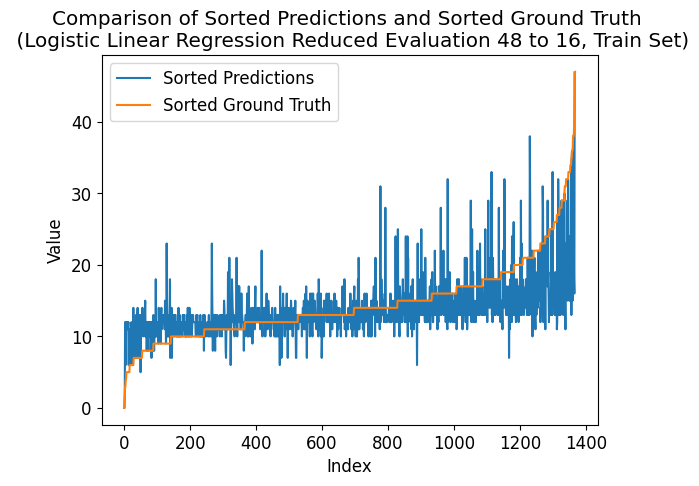

---- ---- ----
class_num = 64
Number of unique elements: 54
[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 3.4166666666666665
Correlation coefficient: 0.5026790965894902
Coefficient of determination (R-squared score, R2 score): 0.1334214002642008
train eval:
Mean squared error: 2.1140350877192984
Correlation coefficient: 0.6472779452398354
Coefficient of determination (R-squared score, R2 score): 0.37495007507697287


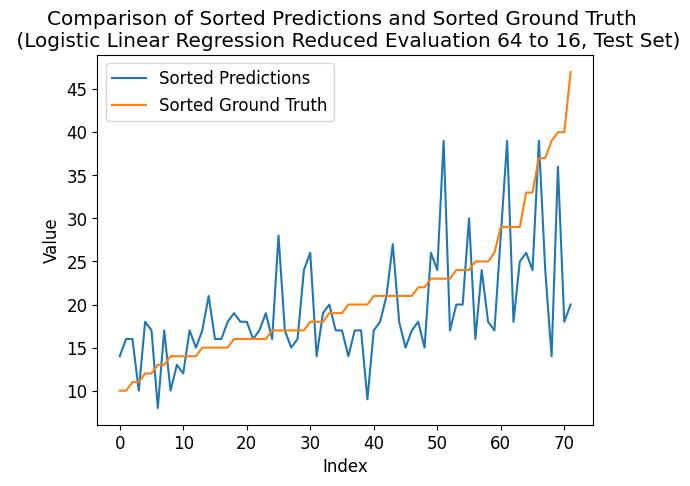

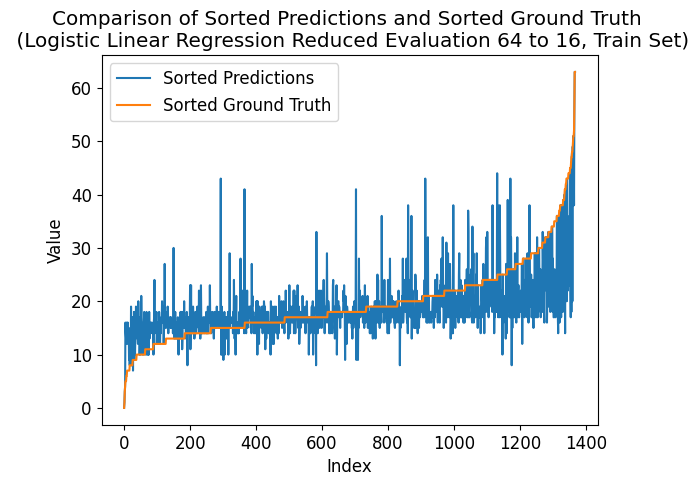

---- ---- ----
class_num = 80
Number of unique elements: 64
[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 4.180555555555555
Correlation coefficient: 0.4427520028671864
Coefficient of determination (R-squared score, R2 score): -0.060325847644209674
train eval:
Mean squared error: 2.2353801169590644
Correlation coefficient: 0.6346212091961099
Coefficient of determination (R-squared score, R2 score): 0.3390723822909346


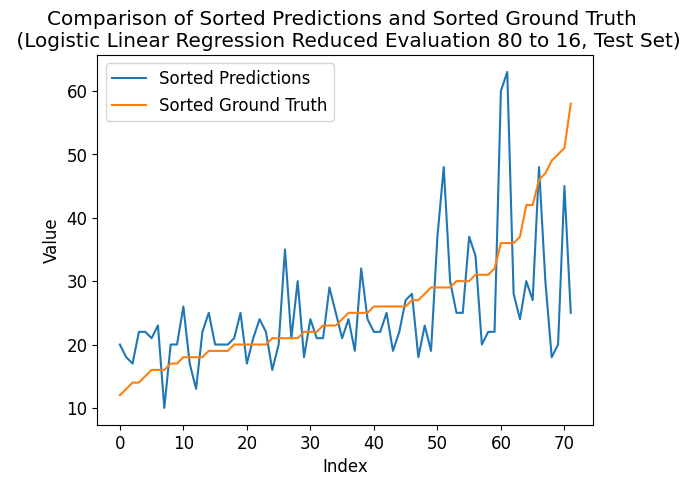

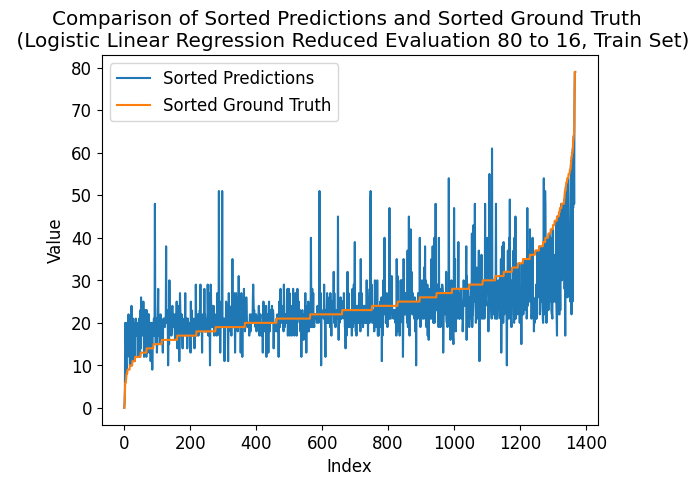

---- ---- ----
class_num = 96
Number of unique elements: 71
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 3.2916666666666665
Correlation coefficient: 0.51125505041414
Coefficient of determination (R-squared score, R2 score): 0.16512549537648613
train eval:
Mean squared error: 2.1783625730994154
Correlation coefficient: 0.6520909781713446
Coefficient of determination (R-squared score, R2 score): 0.35593057528678385


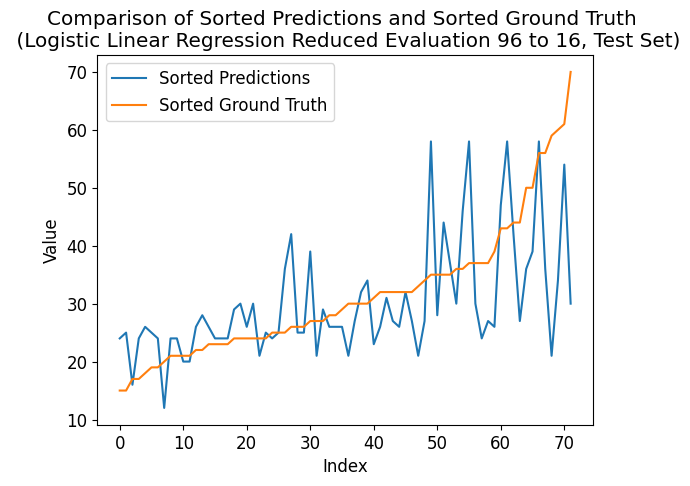

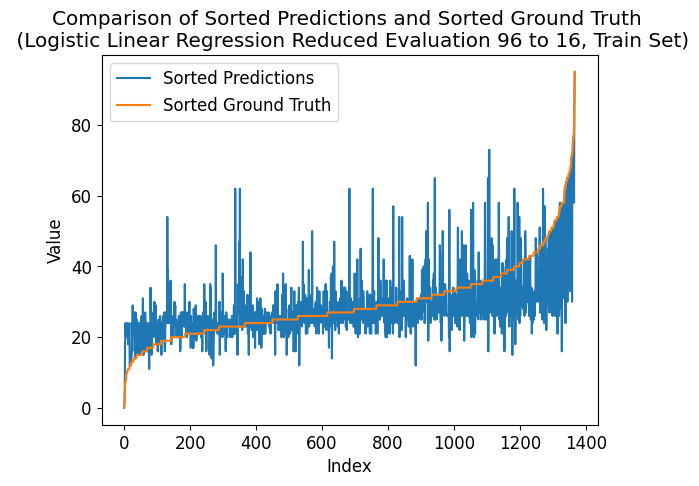

---- ---- ----
class_num = 112
Number of unique elements: 84
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 3.513888888888889
Correlation coefficient: 0.4939418406770864
Coefficient of determination (R-squared score, R2 score): 0.10876265962131215
train eval:
Mean squared error: 2.1922514619883042
Correlation coefficient: 0.6486678241151259
Coefficient of determination (R-squared score, R2 score): 0.35182409237753853


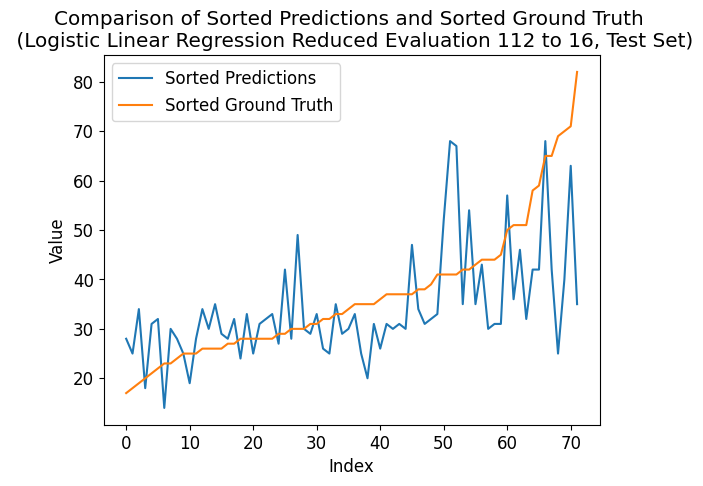

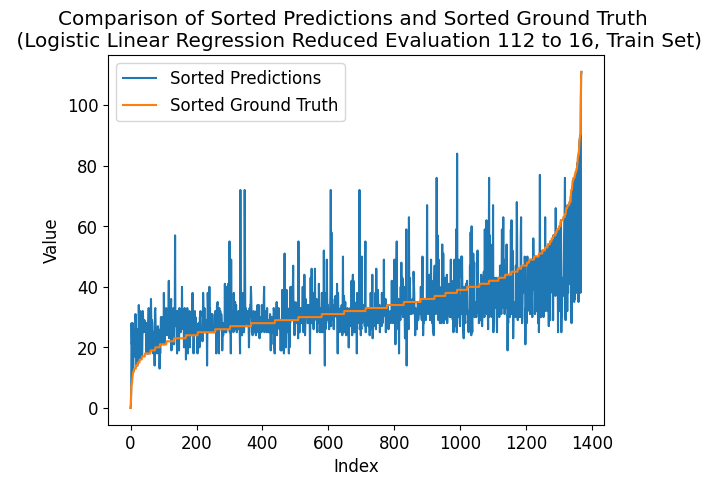

---- ---- ----
class_num = 128
Number of unique elements: 94
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 3.4444444444444446
Correlation coefficient: 0.49173742109172
Coefficient of determination (R-squared score, R2 score): 0.1263760457948041
train eval:
Mean squared error: 1.9619883040935673
Correlation coefficient: 0.6884820898799331
Coefficient of determination (R-squared score, R2 score): 0.4199052563992376


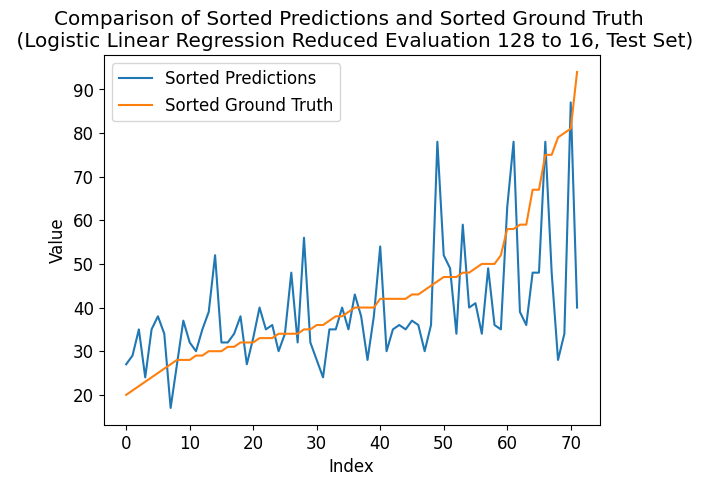

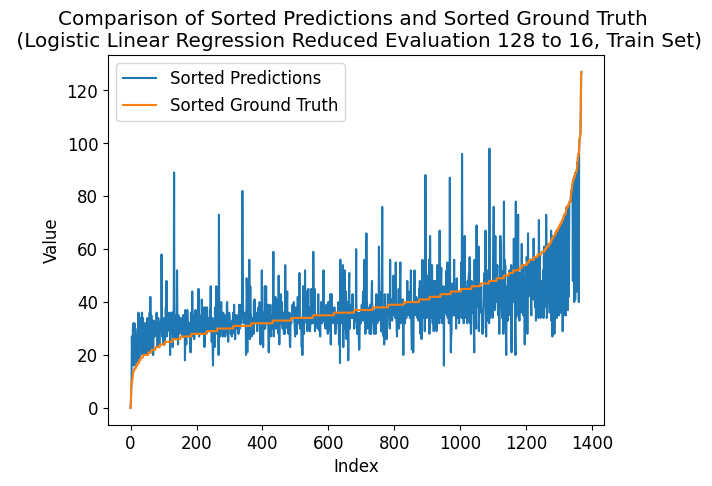

---- ---- ----
class_num = 144
Number of unique elements: 103
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 3.4722222222222223
Correlation coefficient: 0.5038498771736062
Coefficient of determination (R-squared score, R2 score): 0.1193306913254073
train eval:
Mean squared error: 2.081140350877193
Correlation coefficient: 0.6704811540011679
Coefficient of determination (R-squared score, R2 score): 0.38467595565150126


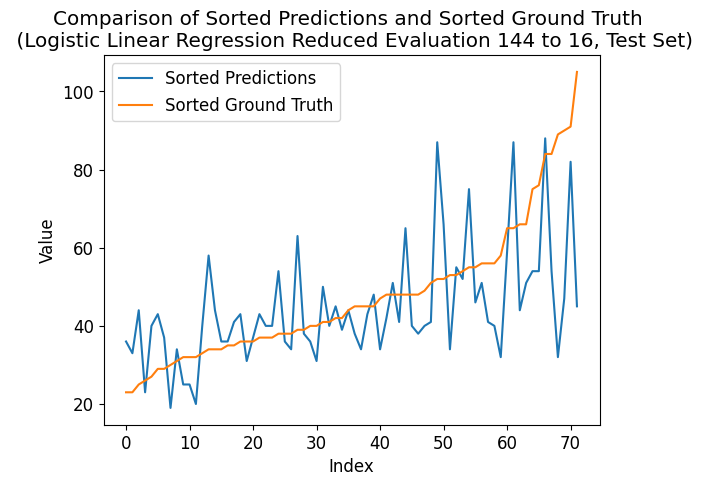

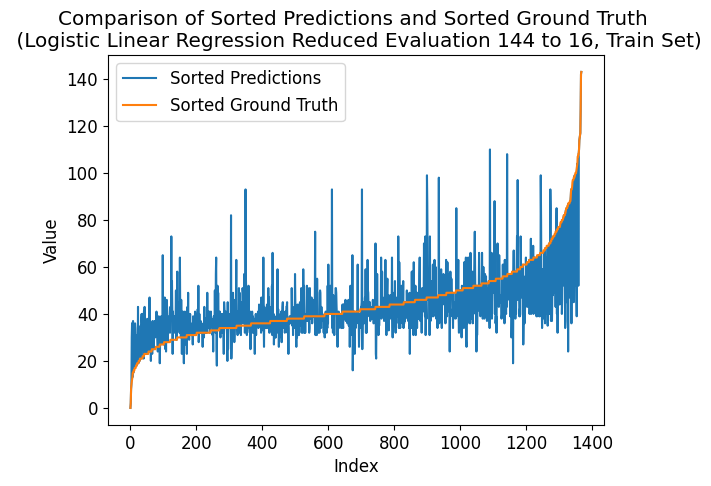

---- ---- ----
class_num = 160
Number of unique elements: 112
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 3.2916666666666665
Correlation coefficient: 0.5242259606046868
Coefficient of determination (R-squared score, R2 score): 0.16512549537648613
train eval:
Mean squared error: 2.122076023391813
Correlation coefficient: 0.6703961059512124
Coefficient of determination (R-squared score, R2 score): 0.37257263760319925


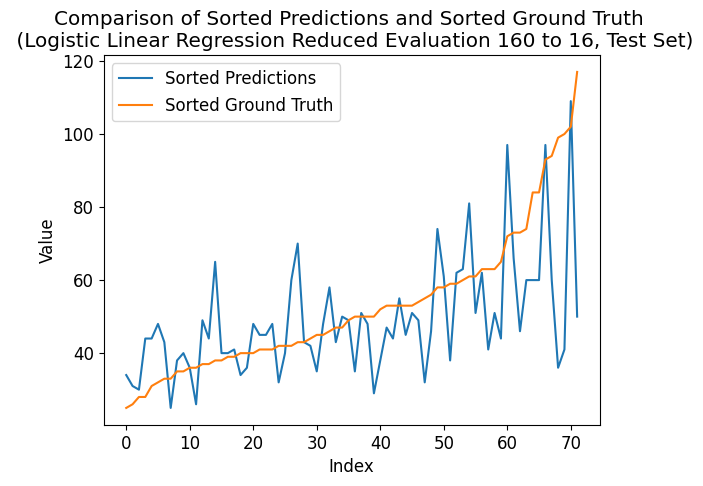

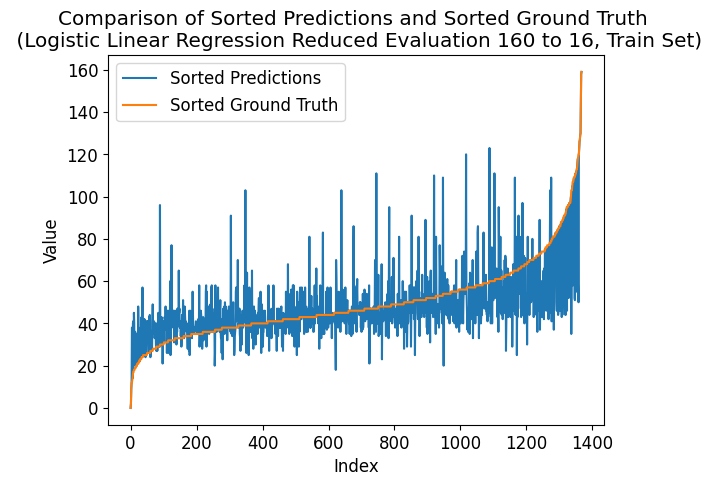

---- ---- ----
class_num = 176
Number of unique elements: 119
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 3.0694444444444446
Correlation coefficient: 0.5449911491568233
Coefficient of determination (R-squared score, R2 score): 0.2214883311316601
train eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.701823124253286
Coefficient of determination (R-squared score, R2 score): 0.44151832434263405


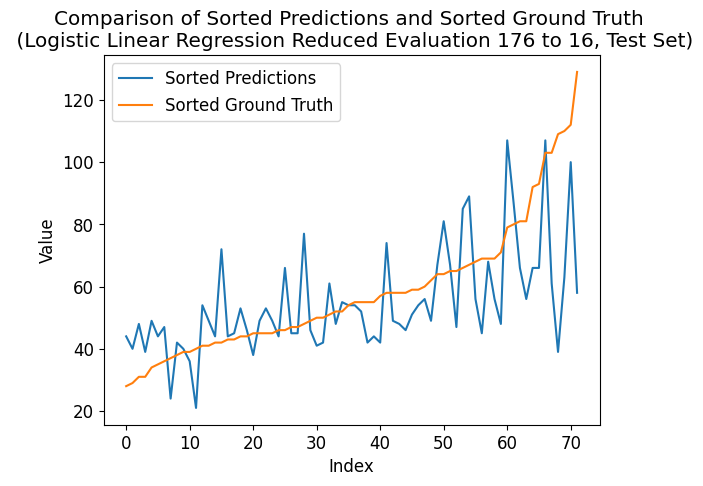

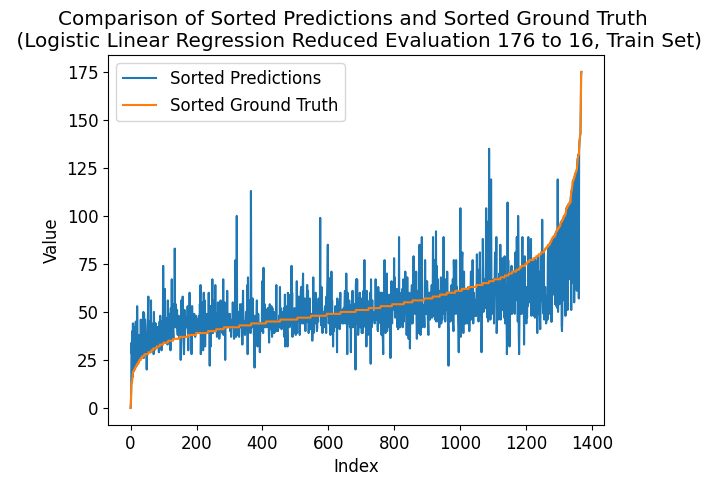

---- ---- ----
class_num = 192
Number of unique elements: 129
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 2.9305555555555554
Correlation coefficient: 0.5666814362142001
Coefficient of determination (R-squared score, R2 score): 0.2567151034786438
train eval:
Mean squared error: 2.0701754385964914
Correlation coefficient: 0.6798531086562069
Coefficient of determination (R-squared score, R2 score): 0.3879179158430107


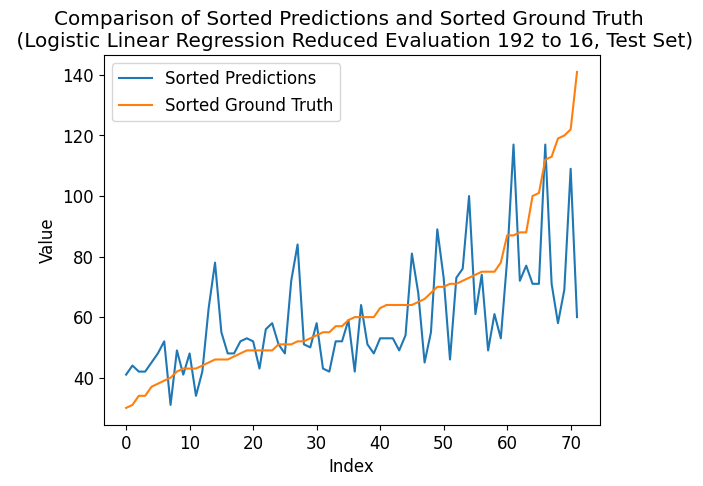

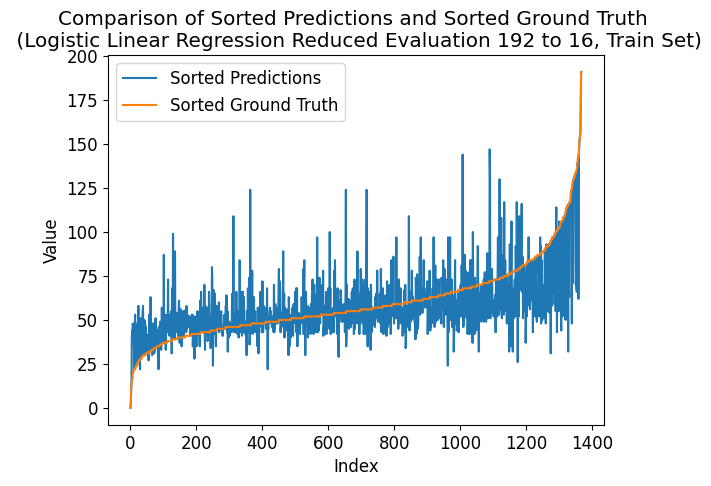

---- ---- ----
class_num = 208
Number of unique elements: 135
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 3.236111111111111
Correlation coefficient: 0.5199406664337747
Coefficient of determination (R-squared score, R2 score): 0.17921620431527963
train eval:
Mean squared error: 1.972953216374269
Correlation coefficient: 0.6981366843232758
Coefficient of determination (R-squared score, R2 score): 0.41666329620772813


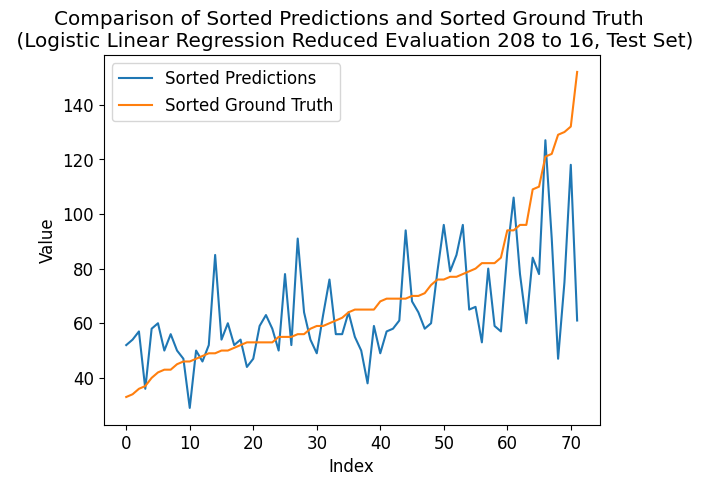

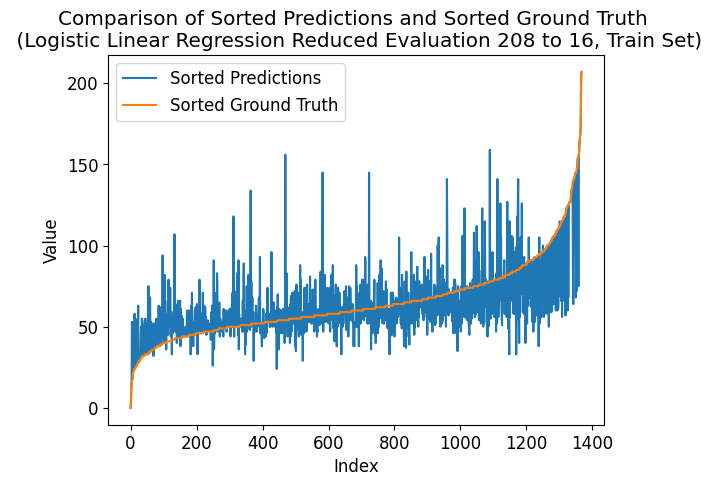

---- ---- ----
class_num = 224
Number of unique elements: 144
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 3.2083333333333335
Correlation coefficient: 0.5494219764429203
Coefficient of determination (R-squared score, R2 score): 0.18626155878467632
train eval:
Mean squared error: 2.0285087719298245
Correlation coefficient: 0.6943943636148544
Coefficient of determination (R-squared score, R2 score): 0.40023736457074677


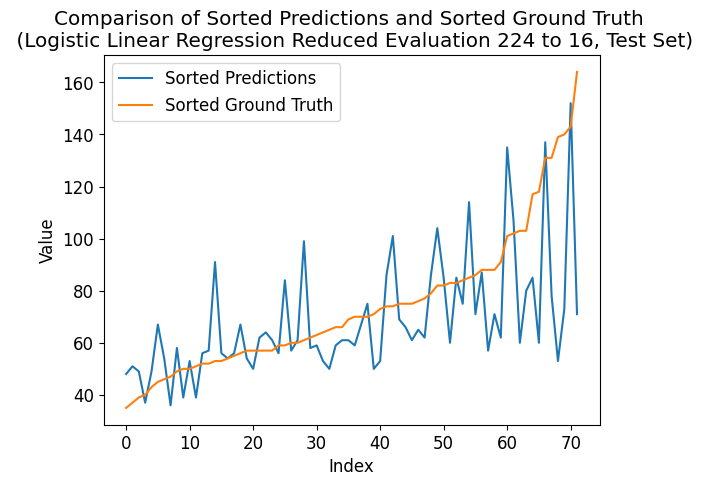

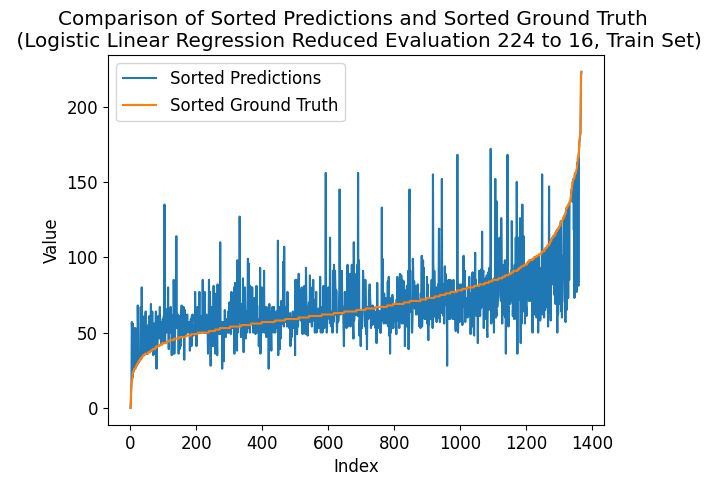

---- ---- ----
class_num = 240
Number of unique elements: 151
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 3.2916666666666665
Correlation coefficient: 0.5194551289734144
Coefficient of determination (R-squared score, R2 score): 0.16512549537648613
train eval:
Mean squared error: 2.068713450292398
Correlation coefficient: 0.6870658969529513
Coefficient of determination (R-squared score, R2 score): 0.3883501772018787


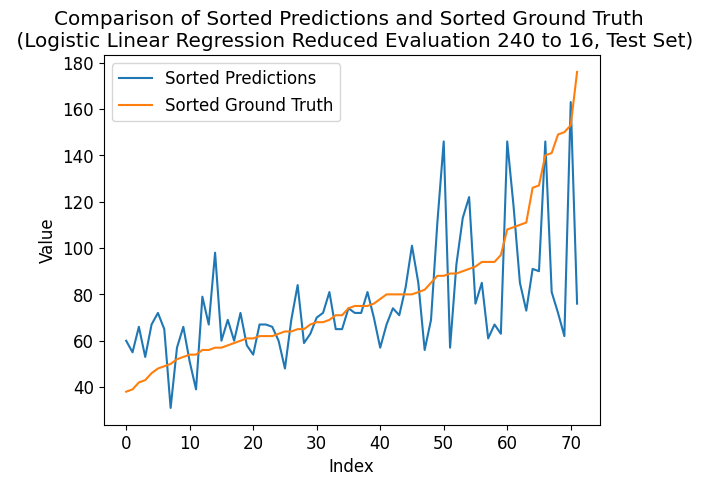

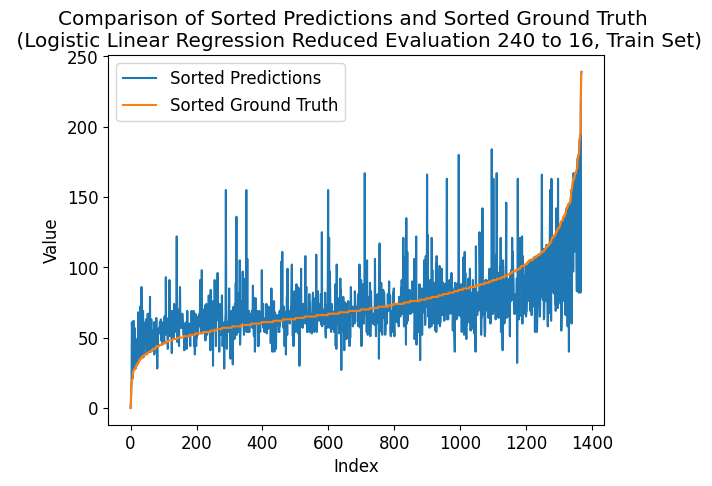

---- ---- ----
class_num = 256
Number of unique elements: 162
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 3.361111111111111
Correlation coefficient: 0.5009248047595136
Coefficient of determination (R-squared score, R2 score): 0.1475121092029943
train eval:
Mean squared error: 1.8735380116959064
Correlation coefficient: 0.711584492903241
Coefficient of determination (R-squared score, R2 score): 0.44605706861074734


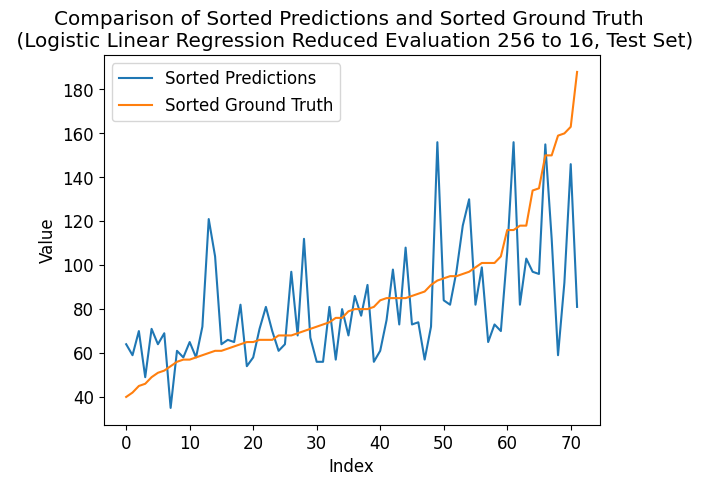

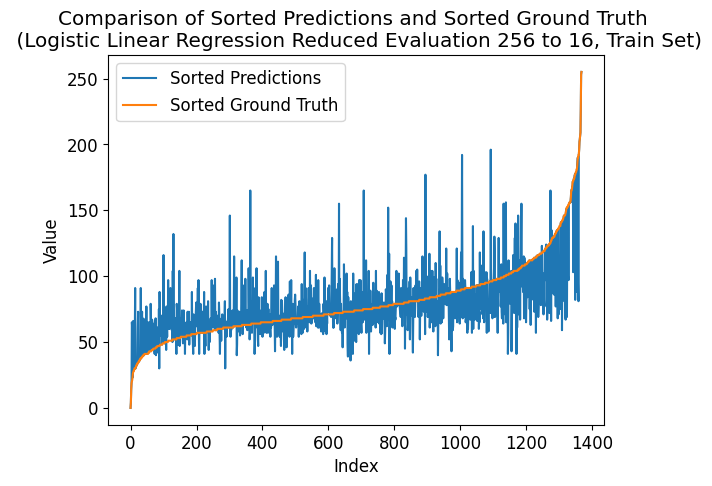

---- ---- ----
class_num = 272
Number of unique elements: 168
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 3.5277777777777777
Correlation coefficient: 0.48355826570450633
Coefficient of determination (R-squared score, R2 score): 0.1052399823866138
train eval:
Mean squared error: 1.837719298245614
Correlation coefficient: 0.7243368869370695
Coefficient of determination (R-squared score, R2 score): 0.4566474719030117


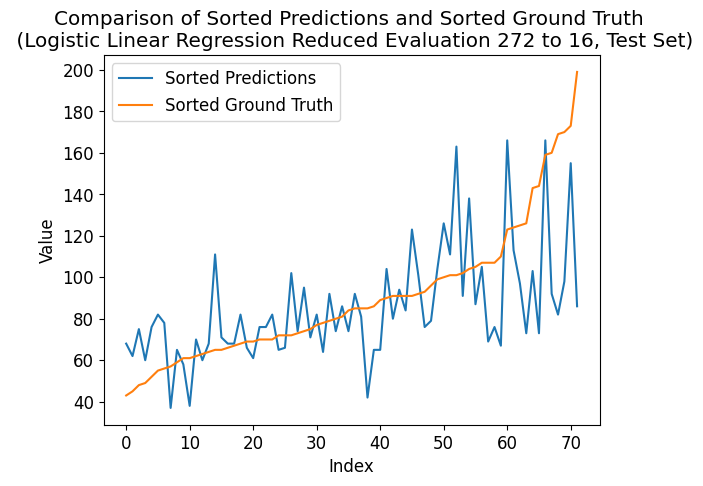

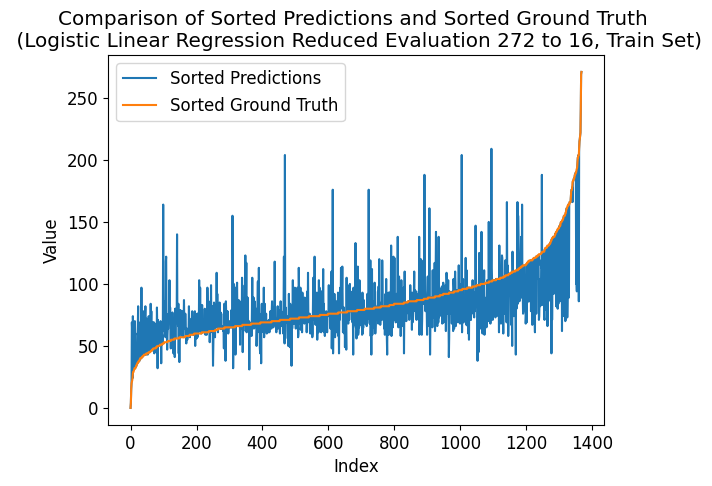

---- ---- ----
class_num = 288
Number of unique elements: 174
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 3.5416666666666665
Correlation coefficient: 0.4909596921609652
Coefficient of determination (R-squared score, R2 score): 0.10171730515191546
train eval:
Mean squared error: 2.0116959064327484
Correlation coefficient: 0.6872185719452775
Coefficient of determination (R-squared score, R2 score): 0.40520837019772793


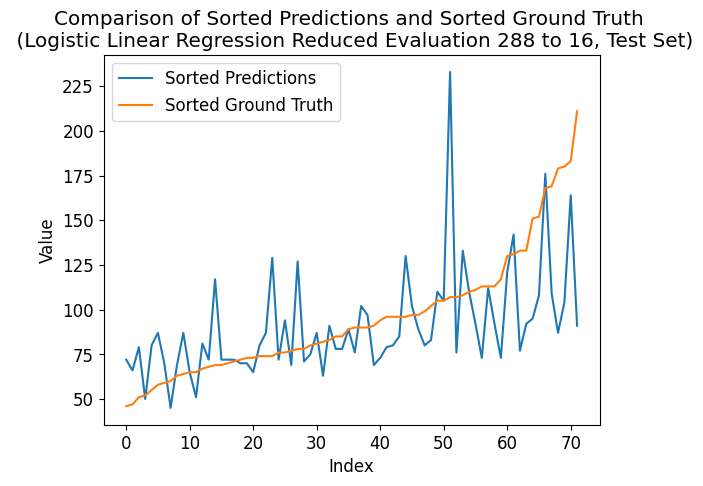

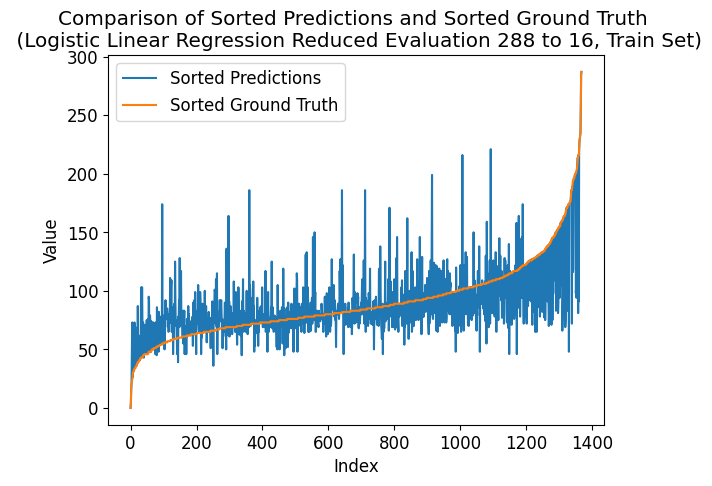

---- ---- ----
class_num = 304
Number of unique elements: 184
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 3.0694444444444446
Correlation coefficient: 0.5466411991576089
Coefficient of determination (R-squared score, R2 score): 0.2214883311316601
train eval:
Mean squared error: 1.9064327485380117
Correlation coefficient: 0.7069074436555871
Coefficient of determination (R-squared score, R2 score): 0.43633118803621895


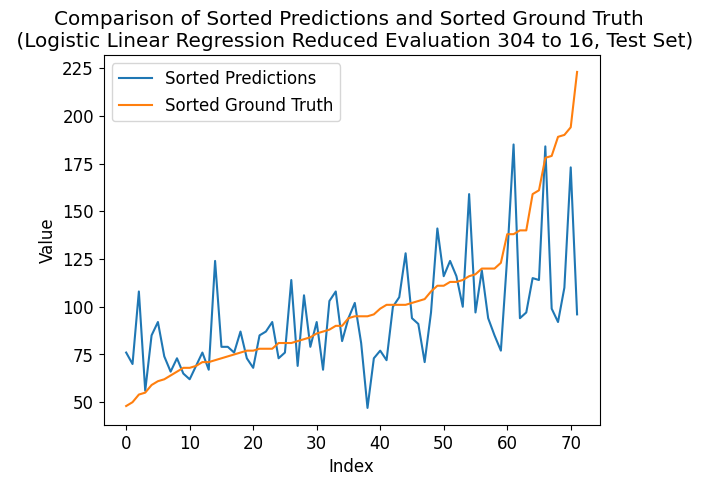

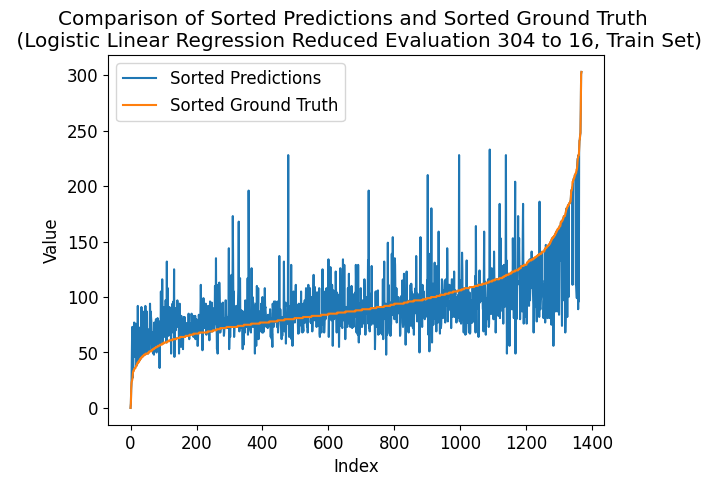

---- ---- ----
class_num = 320
Number of unique elements: 191
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 3.4583333333333335
Correlation coefficient: 0.4860162880041063
Coefficient of determination (R-squared score, R2 score): 0.12285336856010565
train eval:
Mean squared error: 2.0555555555555554
Correlation coefficient: 0.6960384889149112
Coefficient of determination (R-squared score, R2 score): 0.3922405294316901


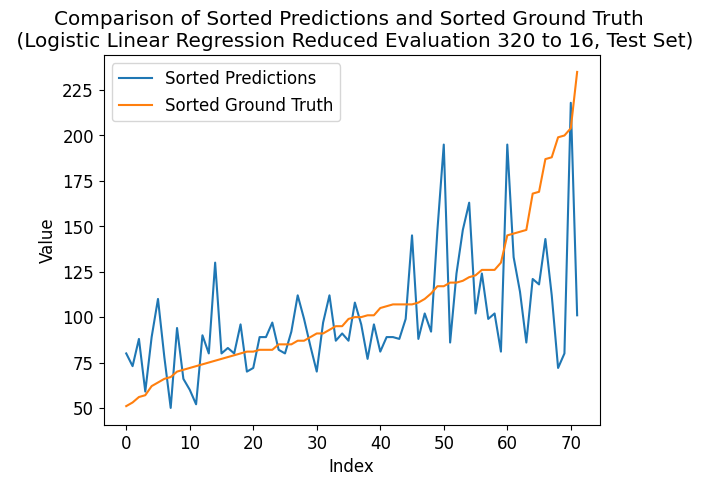

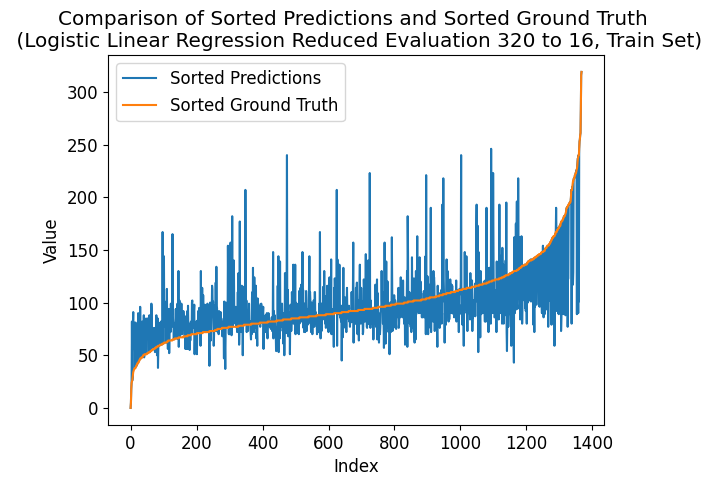

---- ---- ----
class_num = 336
Number of unique elements: 197
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 3.875
Correlation coefficient: 0.4401436050735745
Coefficient of determination (R-squared score, R2 score): 0.017173051519154603
train eval:
Mean squared error: 1.8033625730994152
Correlation coefficient: 0.7273991259341729
Coefficient of determination (R-squared score, R2 score): 0.46680561383640795


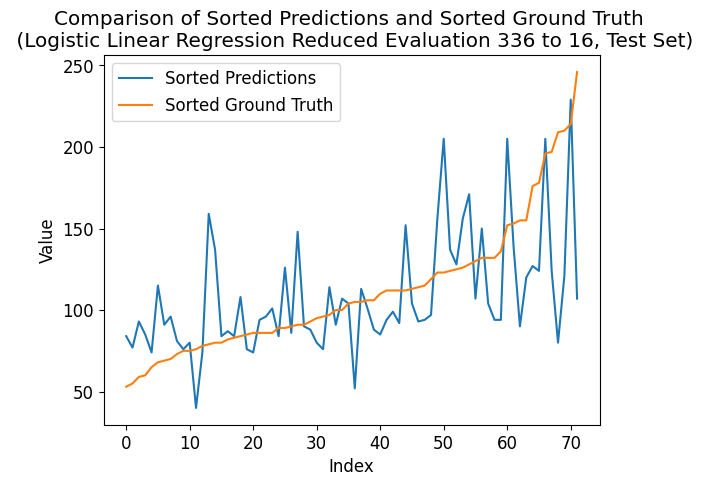

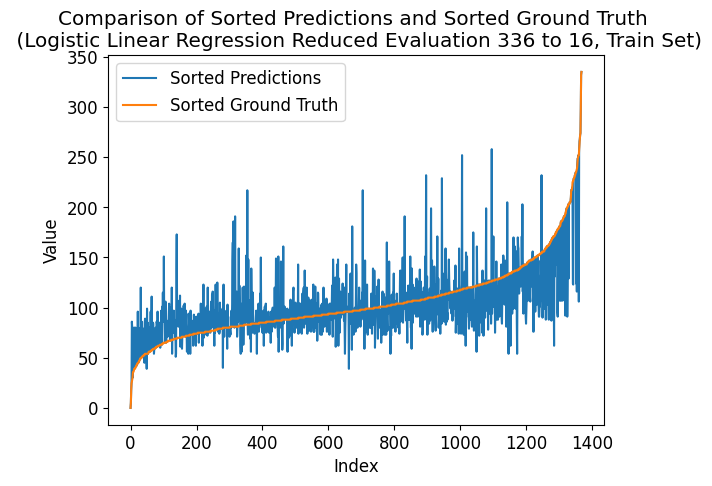

---- ---- ----
class_num = 352
Number of unique elements: 205
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 3.361111111111111
Correlation coefficient: 0.5037429919980371
Coefficient of determination (R-squared score, R2 score): 0.1475121092029943
train eval:
Mean squared error: 1.7690058479532165
Correlation coefficient: 0.7299640096335394
Coefficient of determination (R-squared score, R2 score): 0.4769637557698043


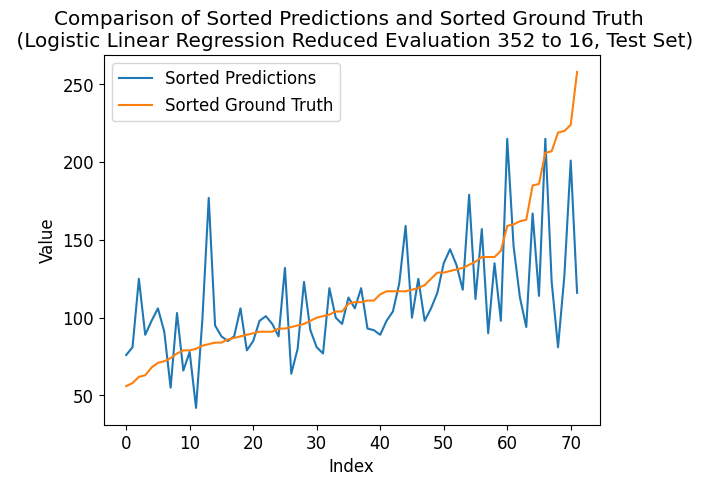

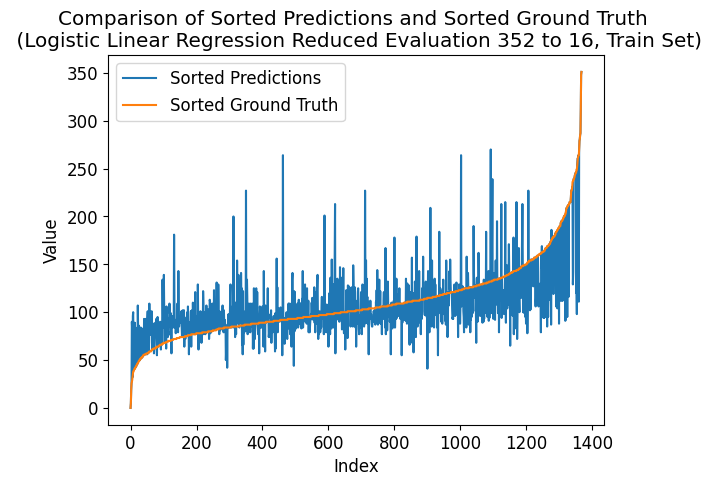

---- ---- ----
class_num = 368
Number of unique elements: 212
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 3.125
Correlation coefficient: 0.5332746426444116
Coefficient of determination (R-squared score, R2 score): 0.20739762219286662
train eval:
Mean squared error: 1.9663742690058479
Correlation coefficient: 0.6957804399311407
Coefficient of determination (R-squared score, R2 score): 0.41860847232263376


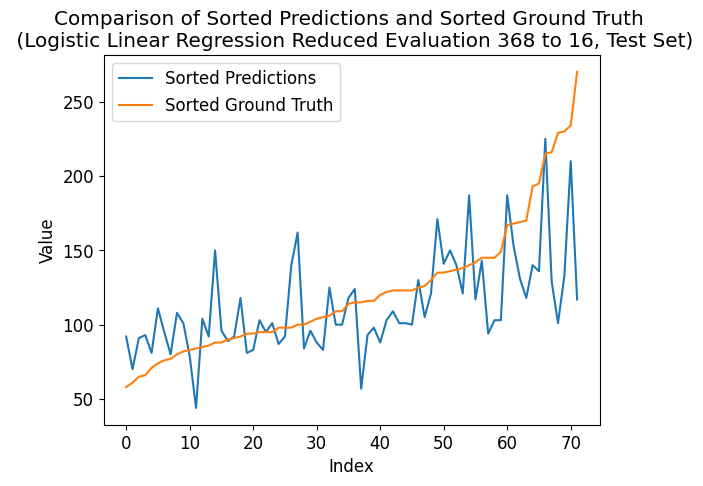

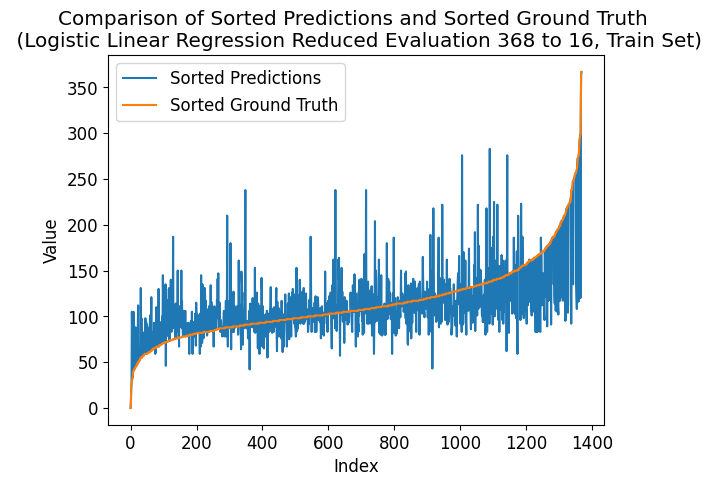

---- ---- ----
class_num = 384
Number of unique elements: 219
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 3.4722222222222223
Correlation coefficient: 0.5059495216654009
Coefficient of determination (R-squared score, R2 score): 0.1193306913254073
train eval:
Mean squared error: 1.6513157894736843
Correlation coefficient: 0.7533710508112701
Coefficient of determination (R-squared score, R2 score): 0.5117607951586727


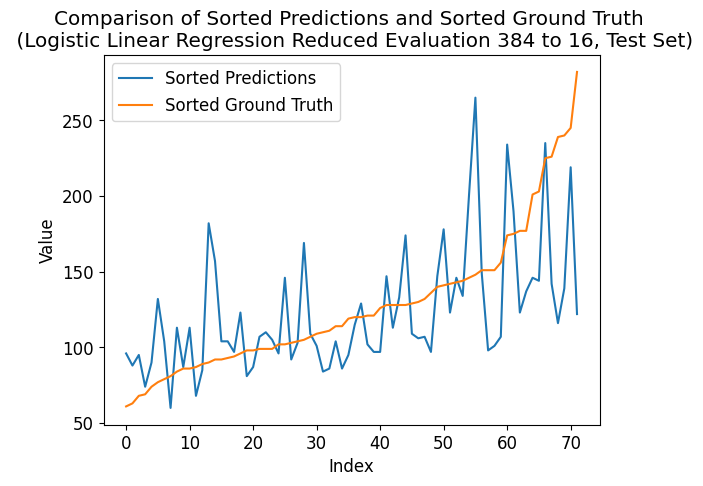

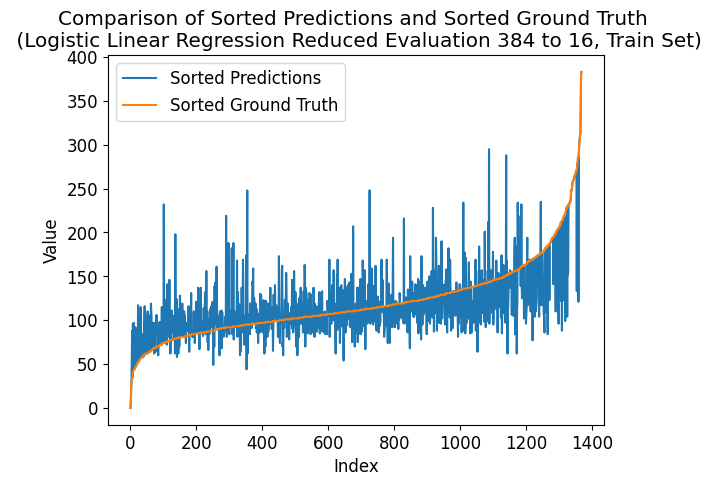

---- ---- ----
class_num = 400
Number of unique elements: 224
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 3.5277777777777777
Correlation coefficient: 0.4977597173786398
Coefficient of determination (R-squared score, R2 score): 0.1052399823866138
train eval:
Mean squared error: 1.608187134502924
Correlation coefficient: 0.7559141771554772
Coefficient of determination (R-squared score, R2 score): 0.5245125052452767


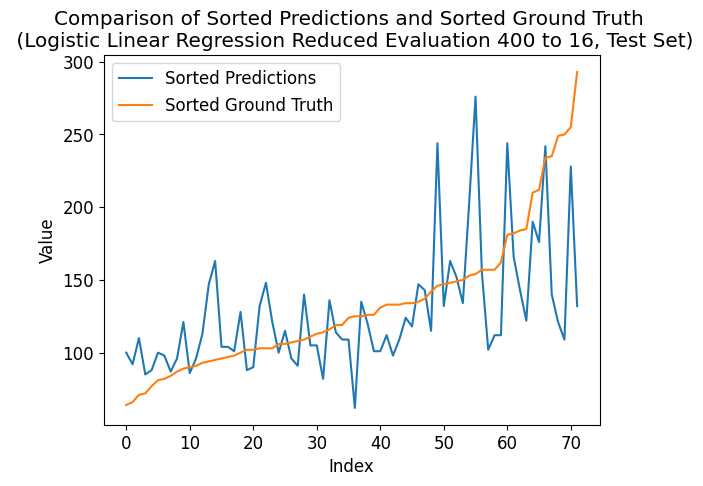

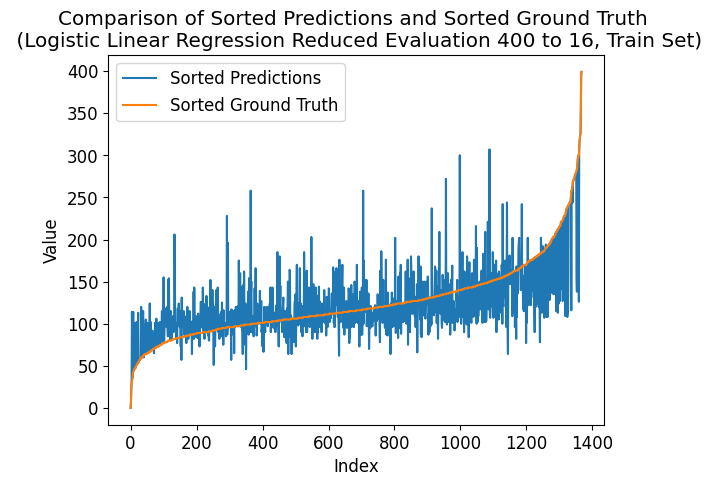

---- ---- ----
class_num = 416
Number of unique elements: 226
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 3.388888888888889
Correlation coefficient: 0.4852968909152171
Coefficient of determination (R-squared score, R2 score): 0.1404667547335975
train eval:
Mean squared error: 1.7105263157894737
Correlation coefficient: 0.7473274313076835
Coefficient of determination (R-squared score, R2 score): 0.49425421012452153


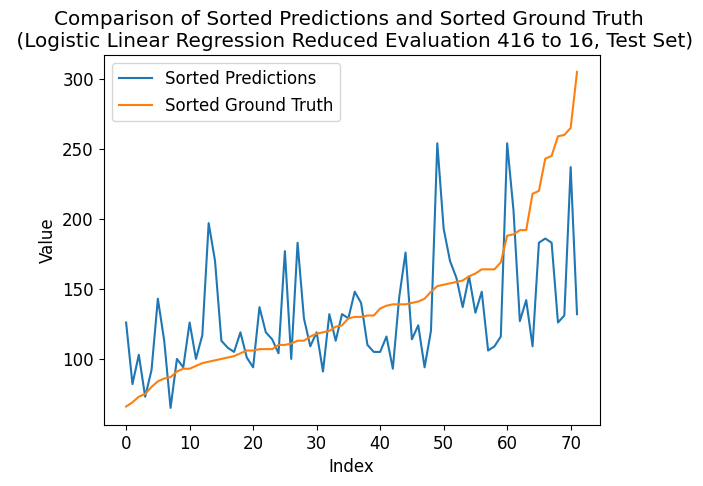

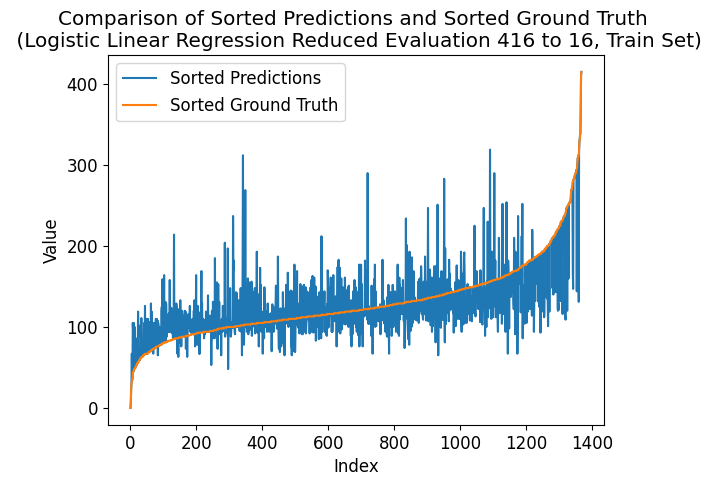

---- ---- ----
class_num = 432
Number of unique elements: 234
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 3.6944444444444446
Correlation coefficient: 0.4654611943310215
Coefficient of determination (R-squared score, R2 score): 0.06296785557023332
train eval:
Mean squared error: 1.8757309941520468
Correlation coefficient: 0.7169540141364958
Coefficient of determination (R-squared score, R2 score): 0.44540867657244543


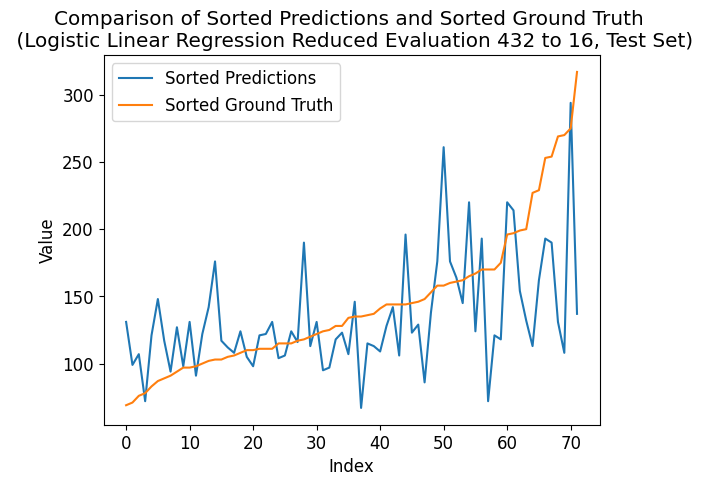

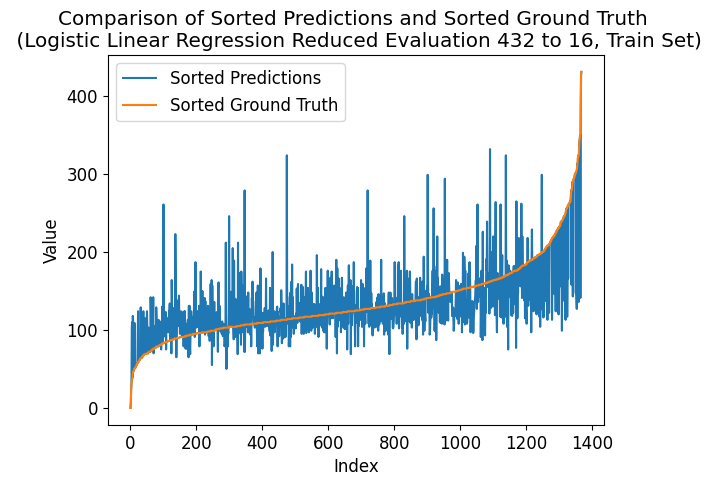

---- ---- ----
class_num = 448
Number of unique elements: 243
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 3.125
Correlation coefficient: 0.5148756853854868
Coefficient of determination (R-squared score, R2 score): 0.20739762219286662
train eval:
Mean squared error: 1.8004385964912282
Correlation coefficient: 0.7354031088299798
Coefficient of determination (R-squared score, R2 score): 0.4676701365541439


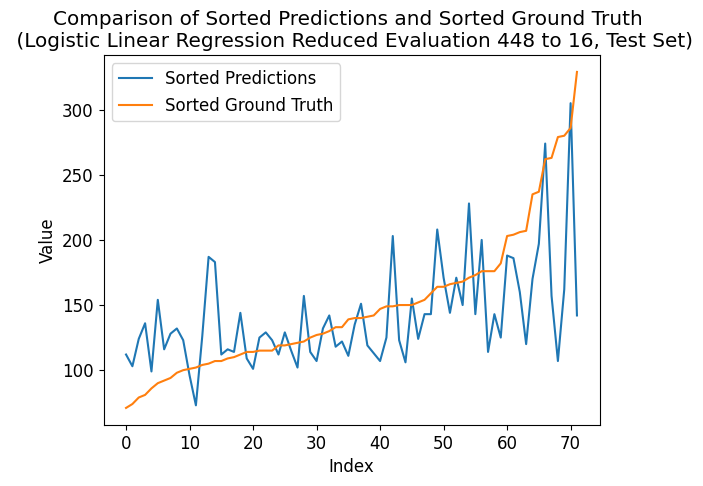

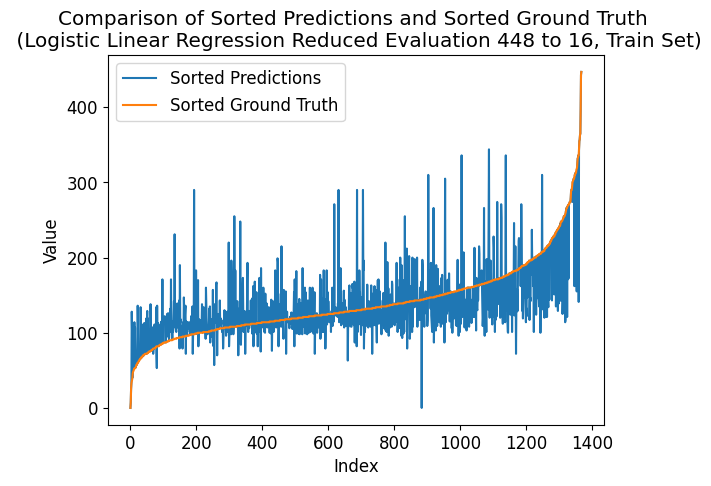

---- ---- ----
class_num = 464
Number of unique elements: 243
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 3.013888888888889
Correlation coefficient: 0.5562252199875786
Coefficient of determination (R-squared score, R2 score): 0.2355790400704535
train eval:
Mean squared error: 1.7236842105263157
Correlation coefficient: 0.7436713273369112
Coefficient of determination (R-squared score, R2 score): 0.49036385789471015


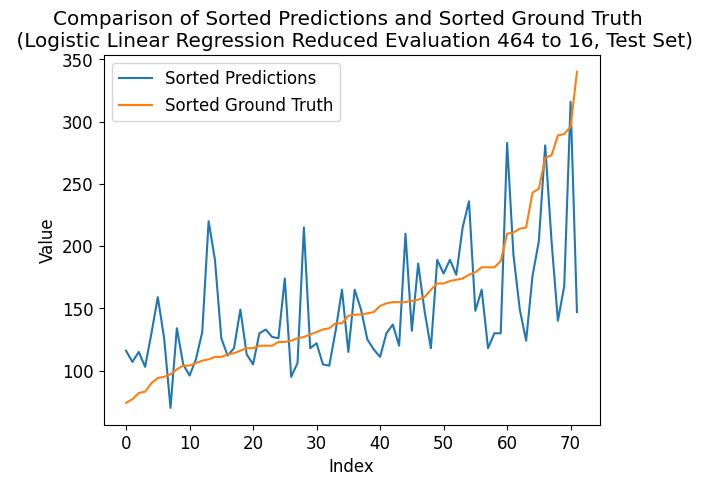

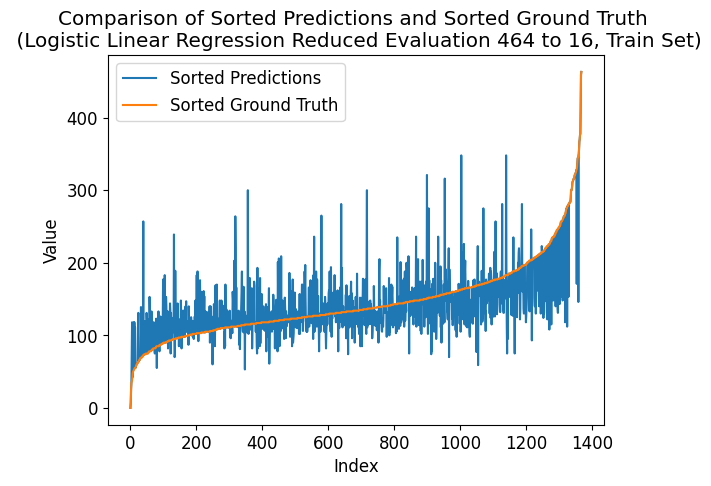

---- ---- ----
class_num = 480
Number of unique elements: 253
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 2.7222222222222223
Correlation coefficient: 0.6060794440849583
Coefficient of determination (R-squared score, R2 score): 0.3095552619991193
train eval:
Mean squared error: 1.7185672514619883
Correlation coefficient: 0.7430224939475898
Coefficient of determination (R-squared score, R2 score): 0.4918767726507479


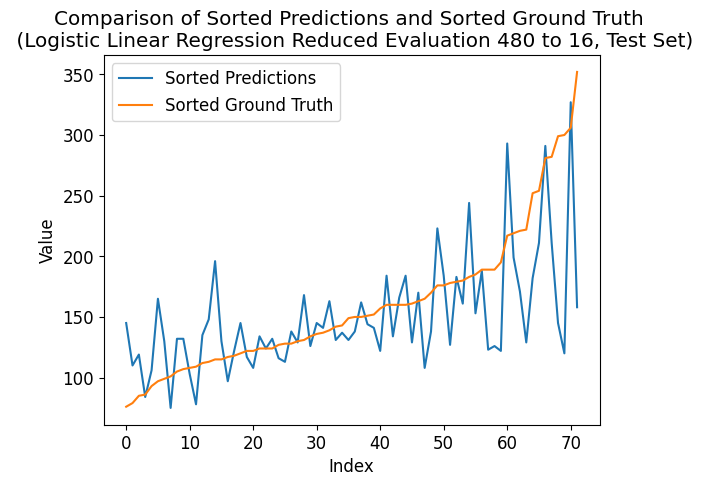

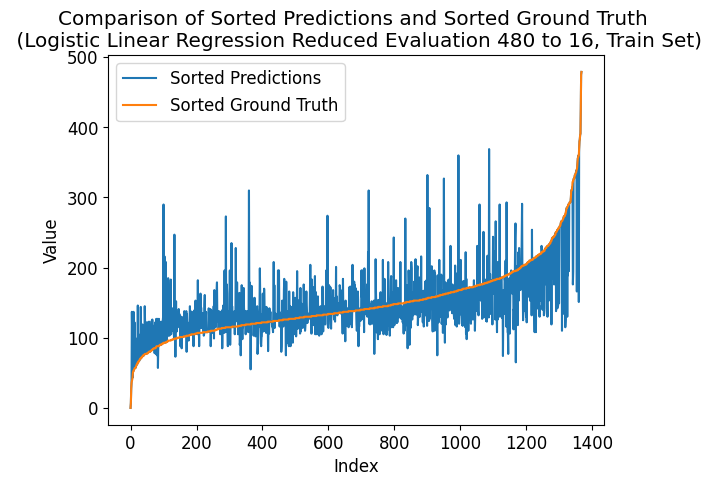

---- ---- ----
class_num = 496
Number of unique elements: 257
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 3.5
Correlation coefficient: 0.4832186801513632
Coefficient of determination (R-squared score, R2 score): 0.11228533685601061
train eval:
Mean squared error: 1.7046783625730995
Correlation coefficient: 0.7407108544490708
Coefficient of determination (R-squared score, R2 score): 0.49598325555999334


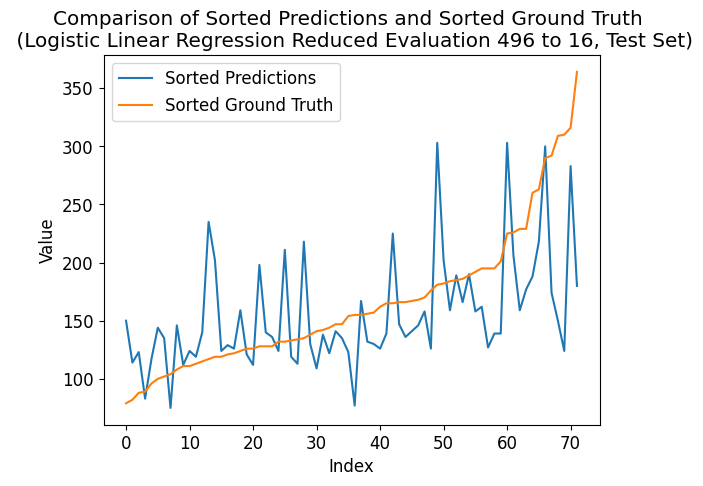

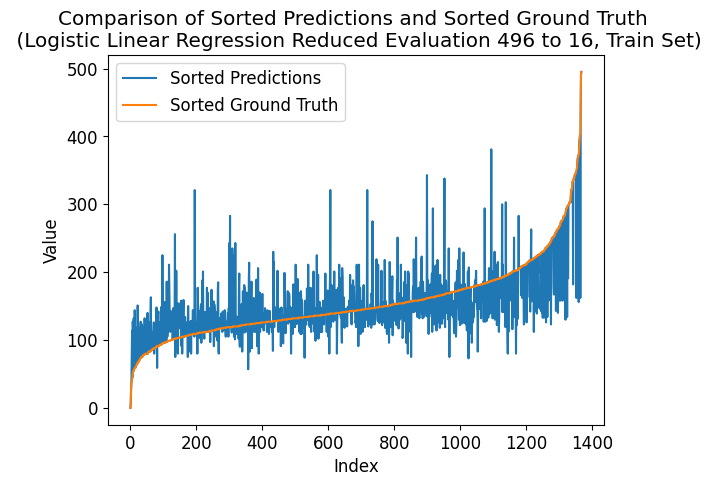

---- ---- ----
class_num = 512
Number of unique elements: 265
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 3.4166666666666665
Correlation coefficient: 0.4900594619824944
Coefficient of determination (R-squared score, R2 score): 0.1334214002642008
train eval:
Mean squared error: 1.638157894736842
Correlation coefficient: 0.7544240186941623
Coefficient of determination (R-squared score, R2 score): 0.5156511473884842


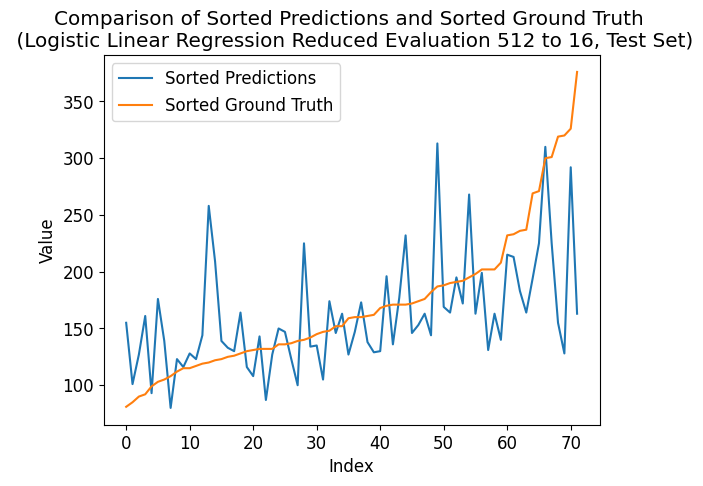

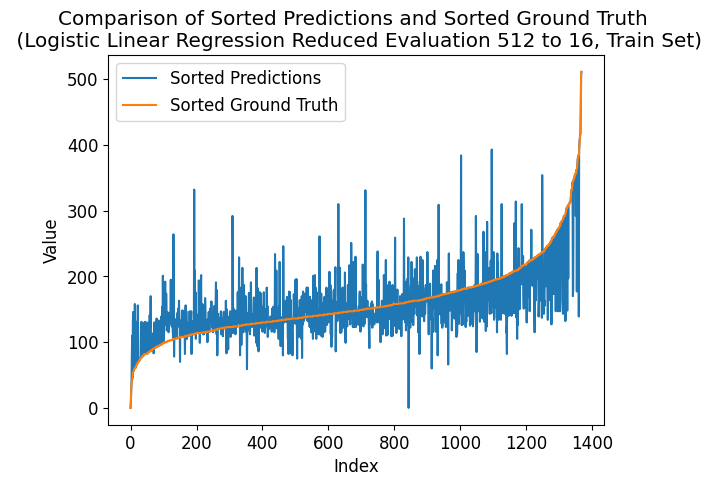

---- ---- ----
class_num = 528
Number of unique elements: 270
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 4.027777777777778
Correlation coefficient: 0.43736758254217567
Coefficient of determination (R-squared score, R2 score): -0.021576398062527424
train eval:
Mean squared error: 1.7653508771929824
Correlation coefficient: 0.7341467667031194
Coefficient of determination (R-squared score, R2 score): 0.4780444091669742


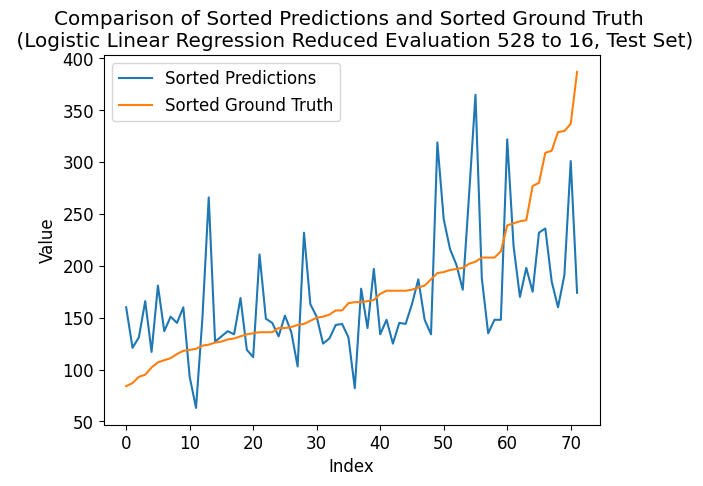

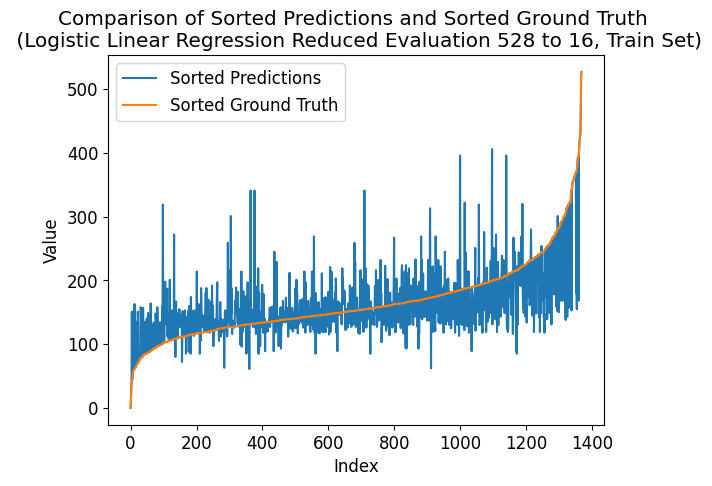

---- ---- ----
class_num = 544
Number of unique elements: 277
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 4.0
Correlation coefficient: 0.4100064508731889
Coefficient of determination (R-squared score, R2 score): -0.014531043593130732
train eval:
Mean squared error: 1.5285087719298245
Correlation coefficient: 0.7712613048121688
Coefficient of determination (R-squared score, R2 score): 0.5480707493035789


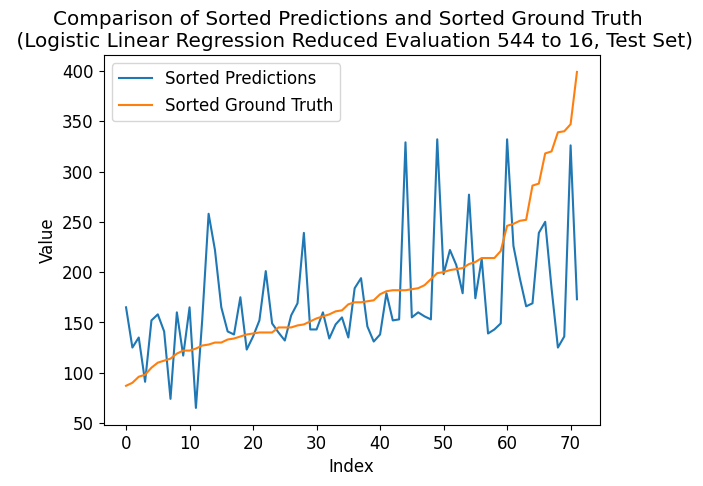

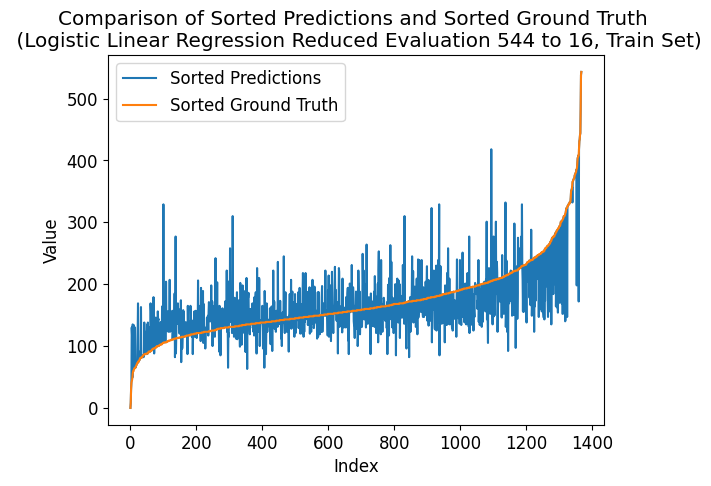

---- ---- ----
class_num = 560
Number of unique elements: 277
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 3.9166666666666665
Correlation coefficient: 0.47230871755082143
Coefficient of determination (R-squared score, R2 score): 0.006605019815059454
train eval:
Mean squared error: 1.5957602339181287
Correlation coefficient: 0.7585438890414924
Coefficient of determination (R-squared score, R2 score): 0.5281867267956541


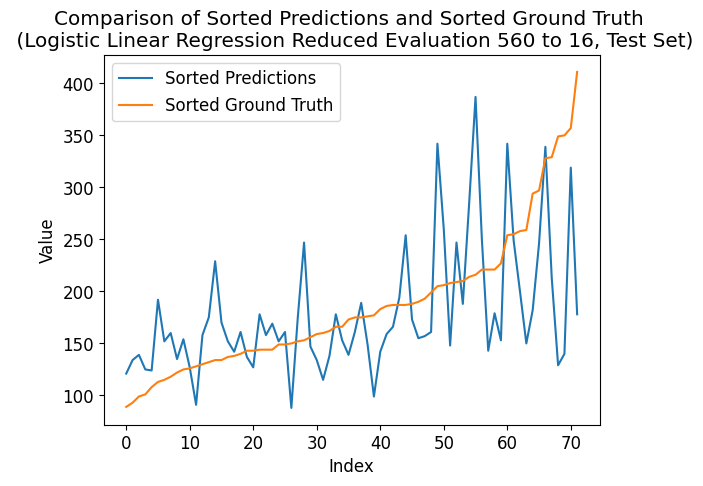

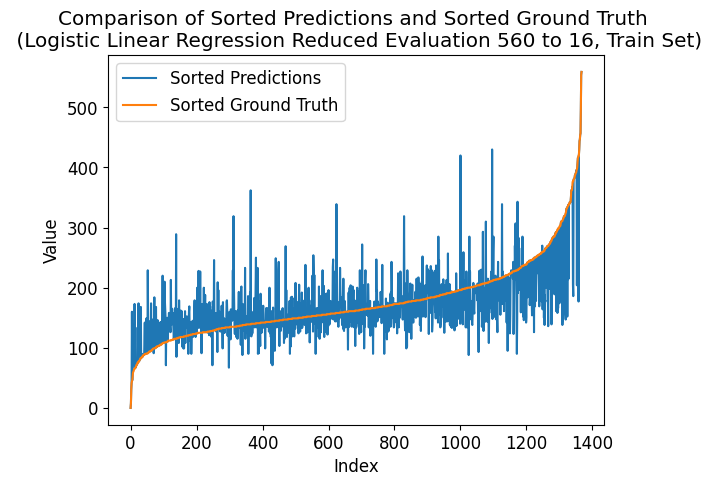

---- ---- ----
class_num = 576
Number of unique elements: 286
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 3.9722222222222223
Correlation coefficient: 0.42378310656099694
Coefficient of determination (R-squared score, R2 score): -0.007485689123734041
train eval:
Mean squared error: 1.668859649122807
Correlation coefficient: 0.7486151433385978
Coefficient of determination (R-squared score, R2 score): 0.5065736588522576


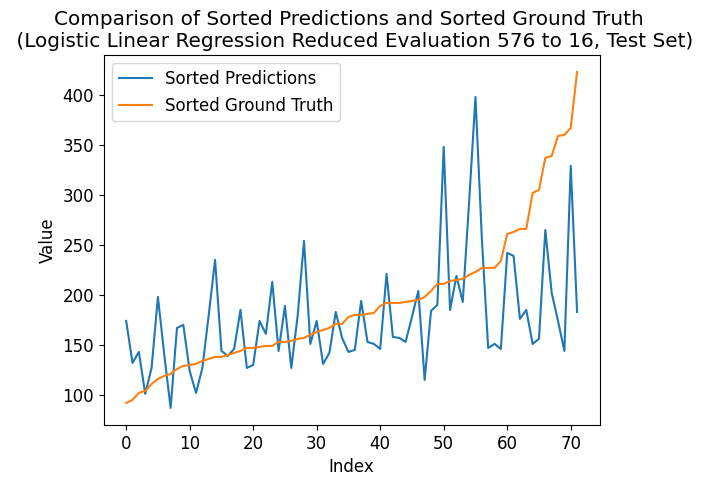

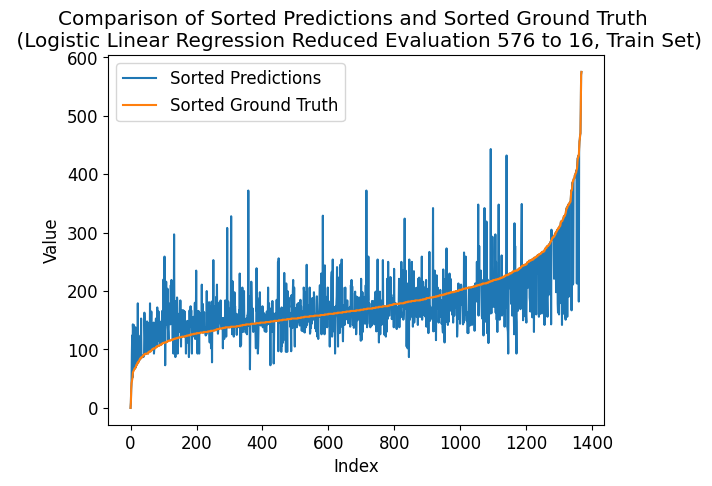

---- ---- ----
class_num = 592
Number of unique elements: 292
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 3.388888888888889
Correlation coefficient: 0.49399417848482213
Coefficient of determination (R-squared score, R2 score): 0.1404667547335975
train eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.7482079193849351
Coefficient of determination (R-squared score, R2 score): 0.5113285337998048


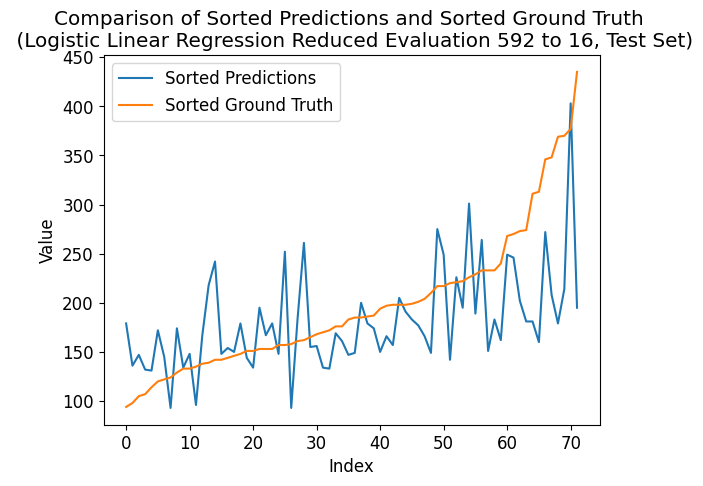

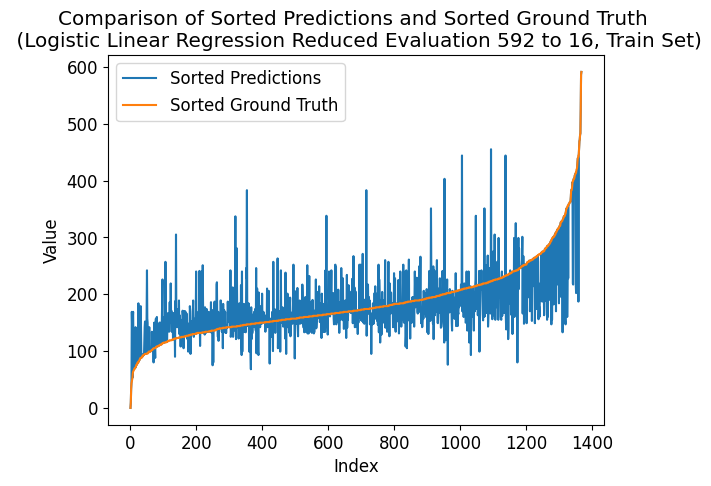

---- ---- ----
class_num = 608
Number of unique elements: 300
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 2.861111111111111
Correlation coefficient: 0.5654923211396736
Coefficient of determination (R-squared score, R2 score): 0.27432848965213563
train eval:
Mean squared error: 1.4846491228070176
Correlation coefficient: 0.7759283496987173
Coefficient of determination (R-squared score, R2 score): 0.5610385900696169


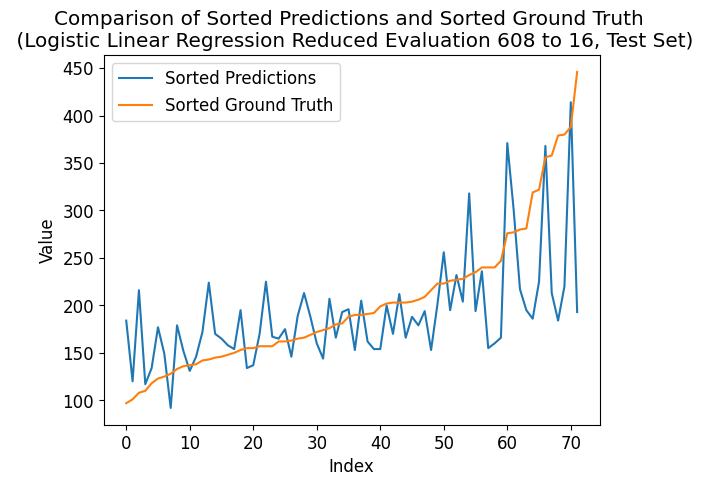

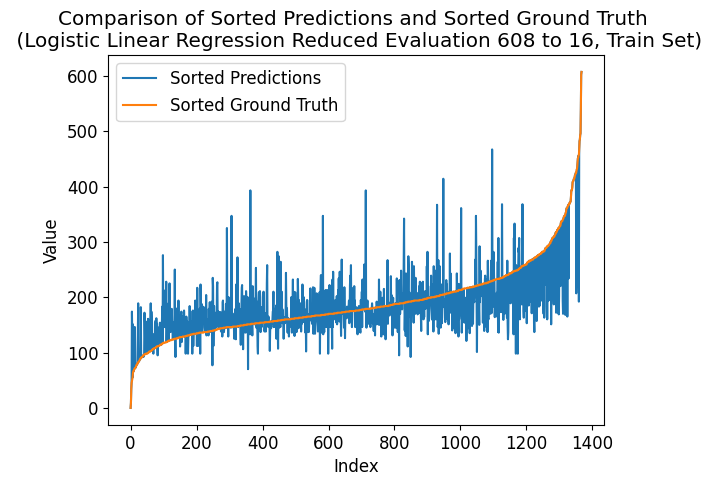

---- ---- ----
class_num = 624
Number of unique elements: 304
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 3.6666666666666665
Correlation coefficient: 0.41626635730762723
Coefficient of determination (R-squared score, R2 score): 0.07001321003963012
train eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.7635377869560491
Coefficient of determination (R-squared score, R2 score): 0.5441803970737675


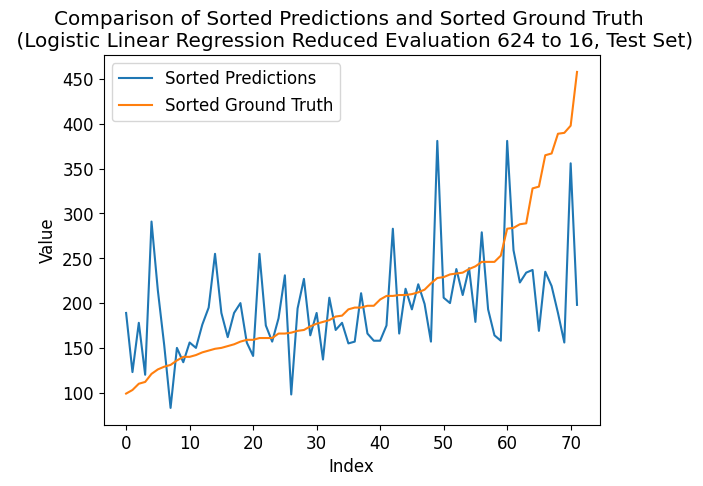

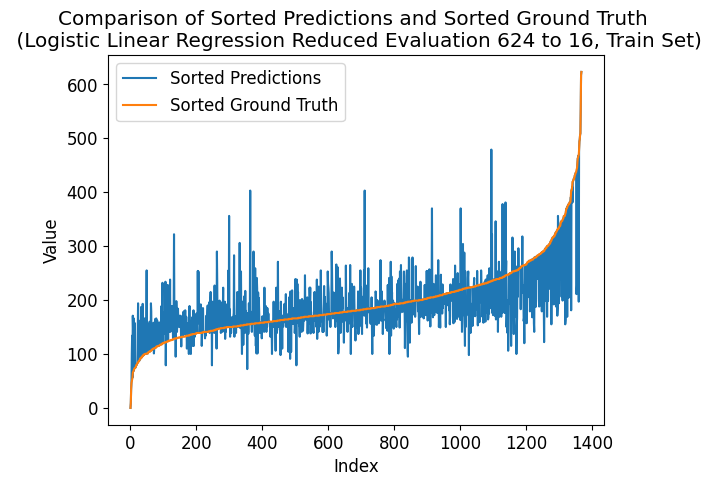

---- ---- ----
class_num = 640
Number of unique elements: 307
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 3.4305555555555554
Correlation coefficient: 0.4839848288307079
Coefficient of determination (R-squared score, R2 score): 0.12989872302950245
train eval:
Mean squared error: 1.6030701754385965
Correlation coefficient: 0.7605854385805896
Coefficient of determination (R-squared score, R2 score): 0.5260254200013145


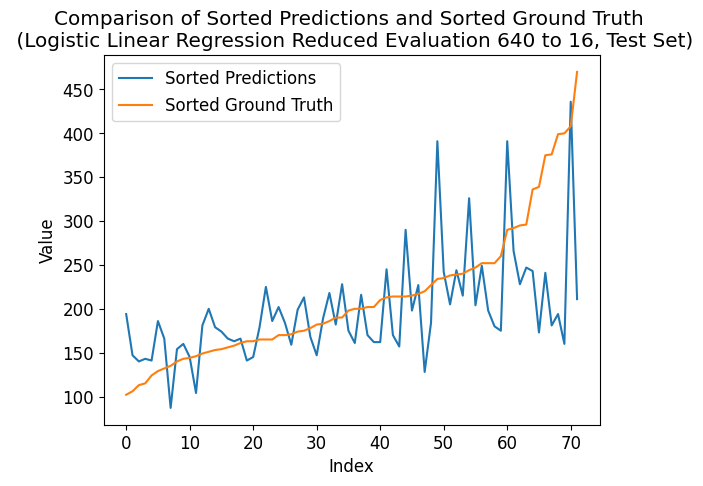

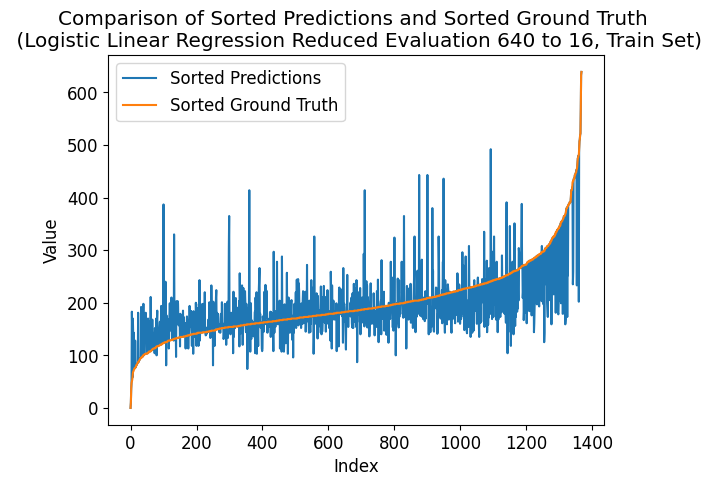

---- ---- ----
class_num = 656
Number of unique elements: 309
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 3.8055555555555554
Correlation coefficient: 0.37497588643165786
Coefficient of determination (R-squared score, R2 score): 0.034786437692646444
train eval:
Mean squared error: 1.543859649122807
Correlation coefficient: 0.7655178452810798
Coefficient of determination (R-squared score, R2 score): 0.5435320050354656


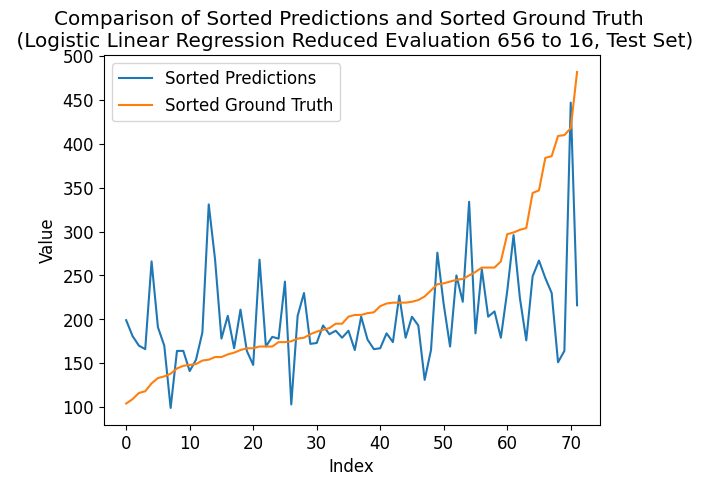

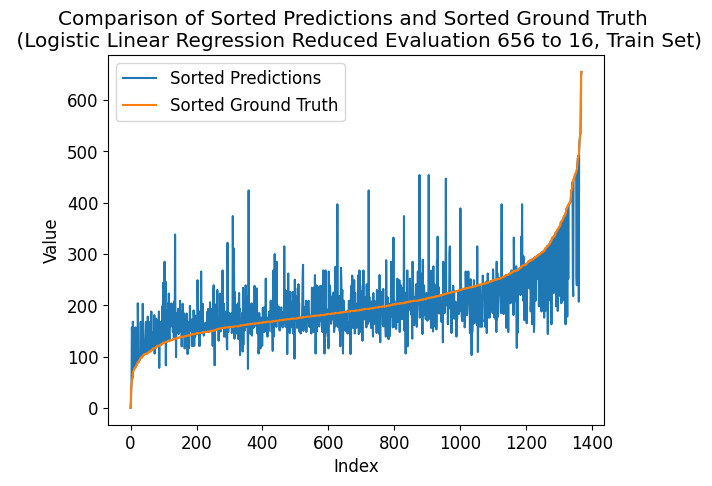

---- ---- ----
class_num = 672
Number of unique elements: 315
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 3.1666666666666665
Correlation coefficient: 0.5150190255186106
Coefficient of determination (R-squared score, R2 score): 0.19682959048877147
train eval:
Mean squared error: 1.554093567251462
Correlation coefficient: 0.7633699426681166
Coefficient of determination (R-squared score, R2 score): 0.5405061755233902


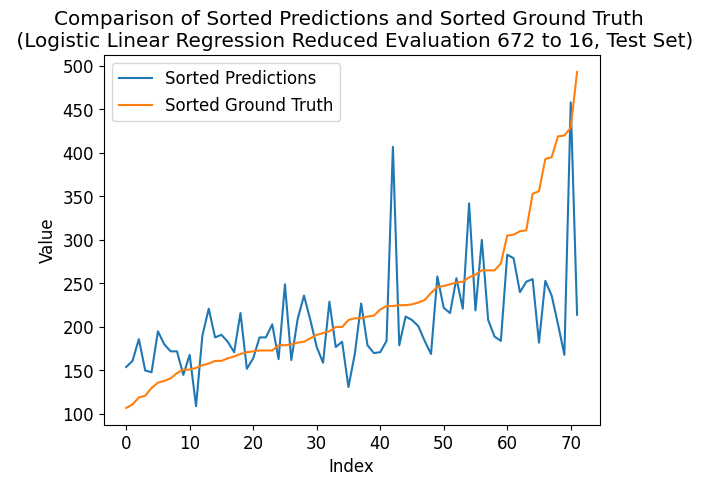

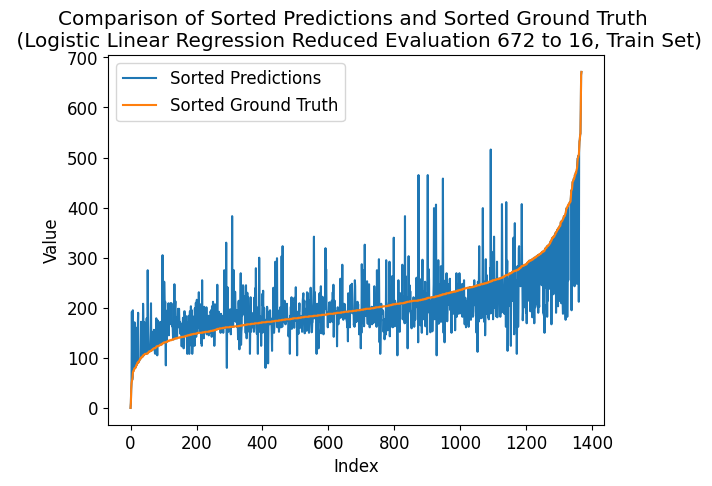

---- ---- ----
class_num = 688
Number of unique elements: 321
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 4.013888888888889
Correlation coefficient: 0.4005119454382824
Coefficient of determination (R-squared score, R2 score): -0.01805372082782908
train eval:
Mean squared error: 1.5526315789473684
Correlation coefficient: 0.772042638034626
Coefficient of determination (R-squared score, R2 score): 0.5409384368822581


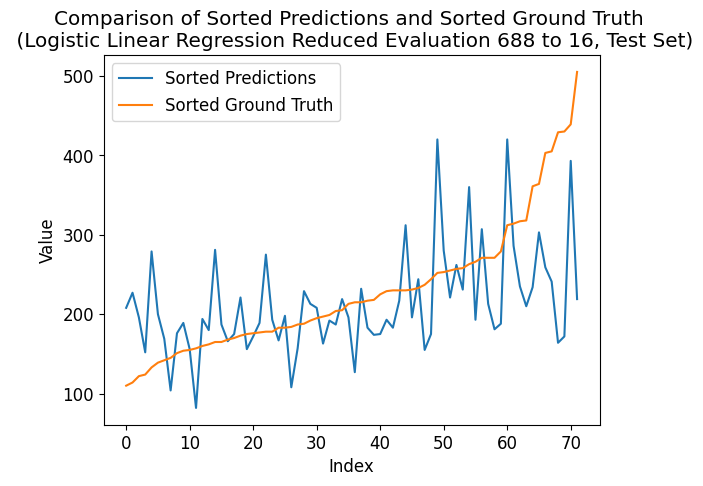

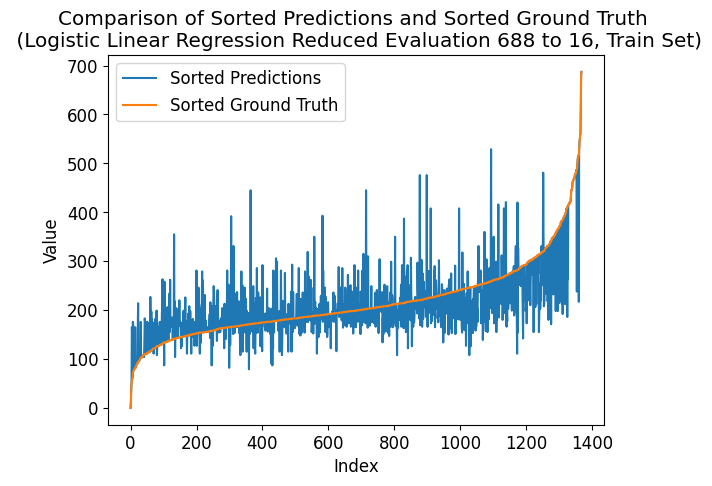

---- ---- ----
class_num = 704
Number of unique elements: 332
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 3.763888888888889
Correlation coefficient: 0.43791853374799544
Coefficient of determination (R-squared score, R2 score): 0.04535446939674148
train eval:
Mean squared error: 1.4371345029239766
Correlation coefficient: 0.7840847983118878
Coefficient of determination (R-squared score, R2 score): 0.5750870842328246


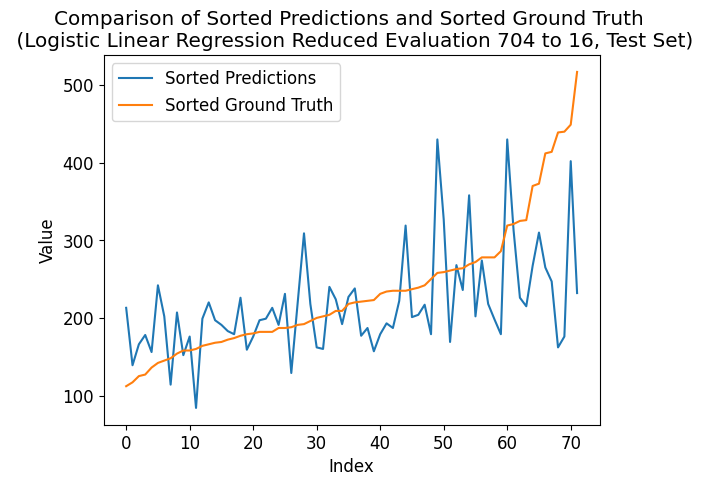

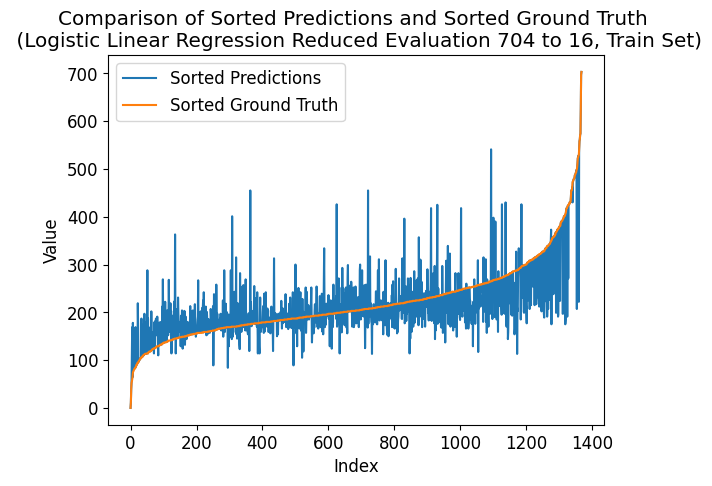

---- ---- ----
class_num = 720
Number of unique elements: 327
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 3.486111111111111
Correlation coefficient: 0.4555483337428381
Coefficient of determination (R-squared score, R2 score): 0.11580801409070896
train eval:
Mean squared error: 1.519736842105263
Correlation coefficient: 0.7710688567836358
Coefficient of determination (R-squared score, R2 score): 0.5506643174567865


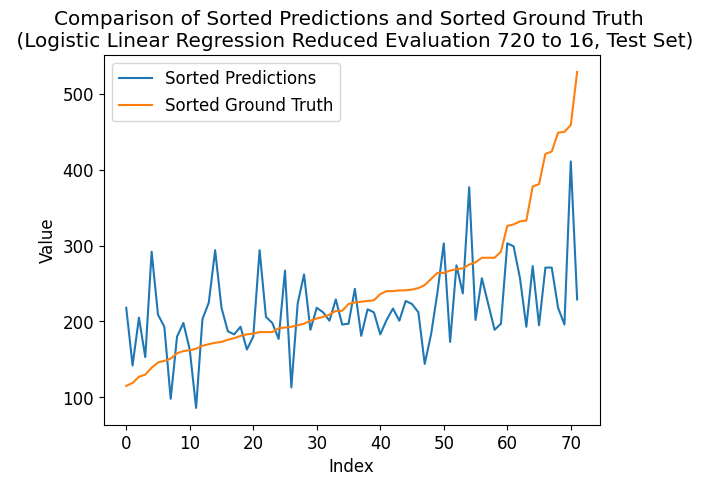

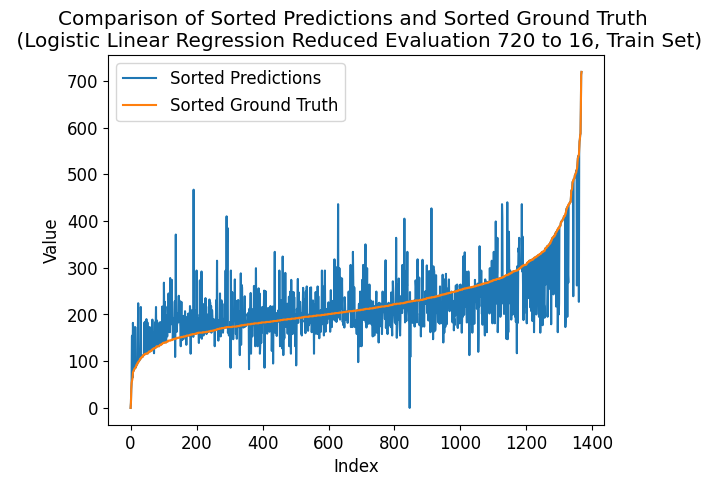

---- ---- ----
class_num = 736
Number of unique elements: 337
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 4.375
Correlation coefficient: 0.3886319421222251
Coefficient of determination (R-squared score, R2 score): -0.10964332892998674
train eval:
Mean squared error: 1.6695906432748537
Correlation coefficient: 0.7500292249655928
Coefficient of determination (R-squared score, R2 score): 0.5063575281728236


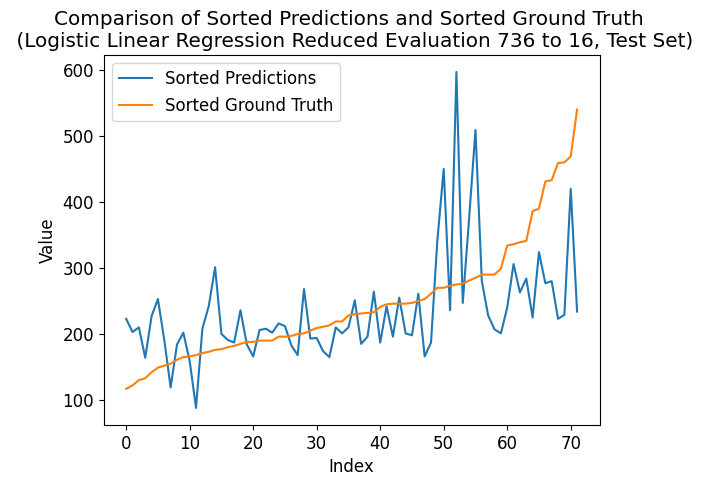

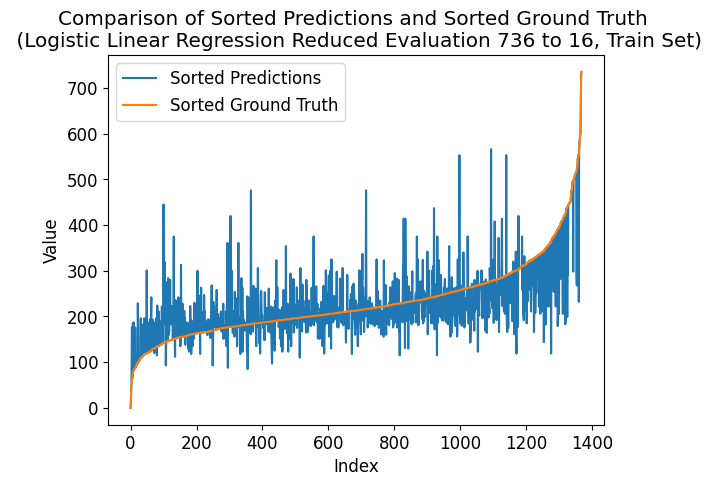

---- ---- ----
class_num = 752
Number of unique elements: 342
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 3.861111111111111
Correlation coefficient: 0.4226049614507438
Coefficient of determination (R-squared score, R2 score): 0.02069572875385295
train eval:
Mean squared error: 1.5204678362573099
Correlation coefficient: 0.7693164965472329
Coefficient of determination (R-squared score, R2 score): 0.5504481867773525


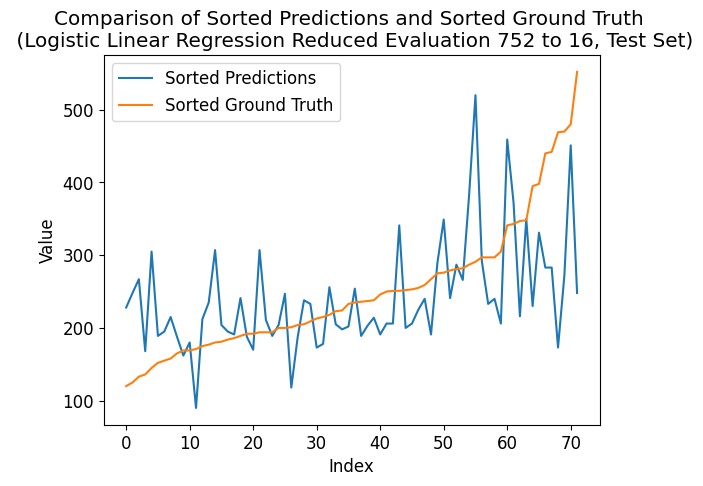

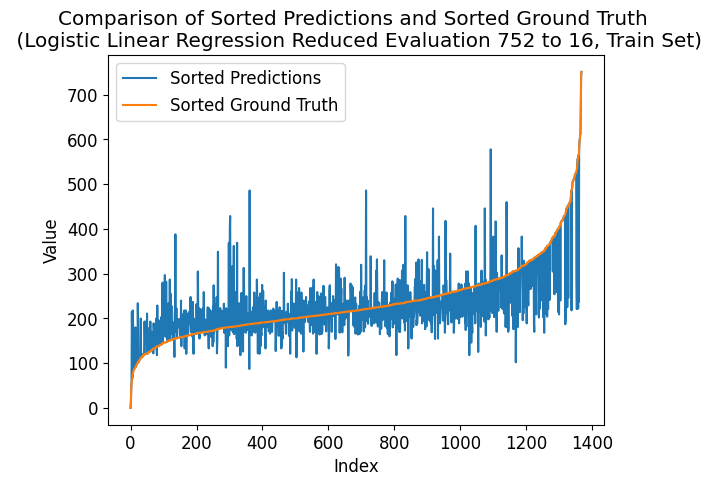

---- ---- ----
class_num = 768
Number of unique elements: 355
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 3.5555555555555554
Correlation coefficient: 0.4702633221611583
Coefficient of determination (R-squared score, R2 score): 0.09819462791721711
train eval:
Mean squared error: 1.4663742690058479
Correlation coefficient: 0.7787359072431008
Coefficient of determination (R-squared score, R2 score): 0.5664418570554659


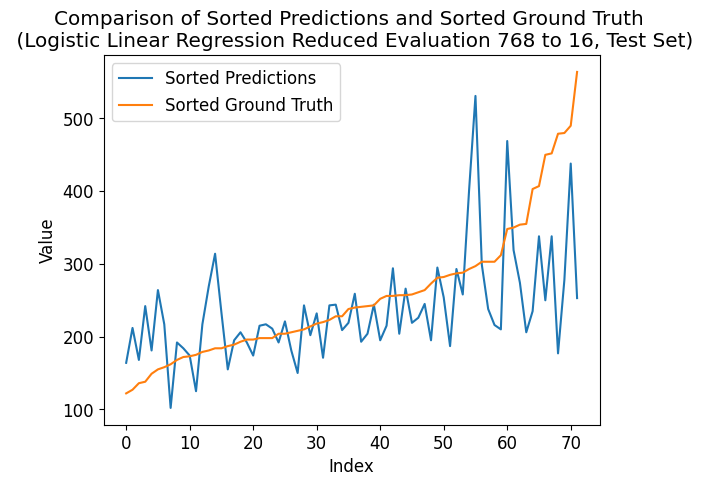

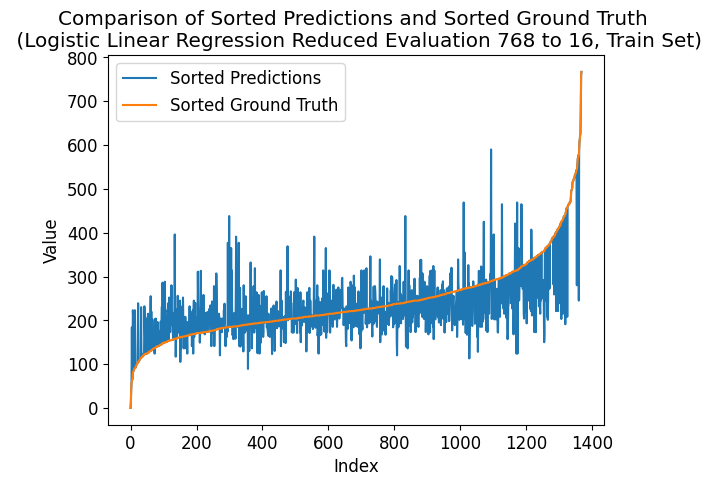

---- ---- ----
class_num = 784
Number of unique elements: 351
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 3.2916666666666665
Correlation coefficient: 0.4910675336428644
Coefficient of determination (R-squared score, R2 score): 0.16512549537648613
train eval:
Mean squared error: 1.4722222222222223
Correlation coefficient: 0.781659838703789
Coefficient of determination (R-squared score, R2 score): 0.5647128116199942


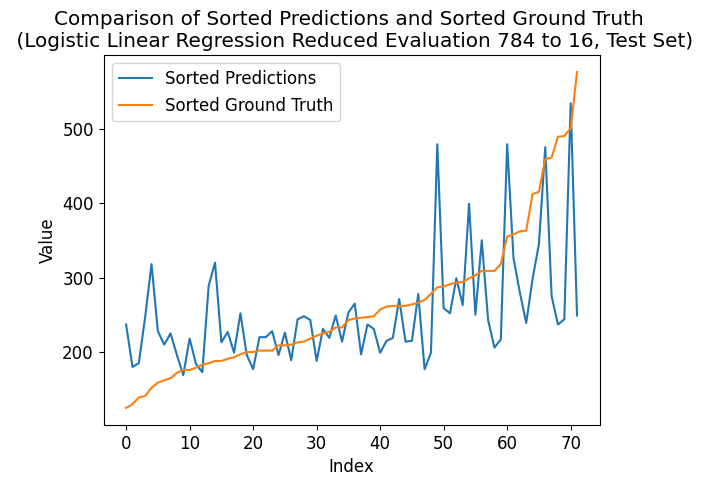

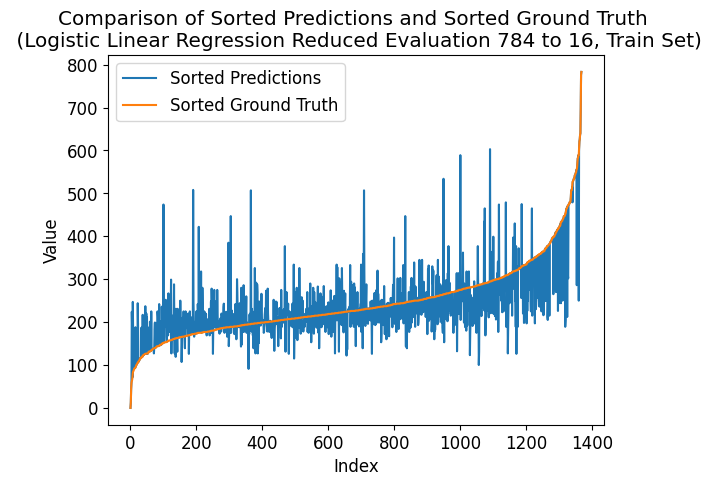

---- ---- ----
class_num = 800
Number of unique elements: 355
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 3.8333333333333335
Correlation coefficient: 0.4353159979326409
Coefficient of determination (R-squared score, R2 score): 0.02774108322324964
train eval:
Mean squared error: 1.5394736842105263
Correlation coefficient: 0.7663863922881011
Coefficient of determination (R-squared score, R2 score): 0.5448287891120694


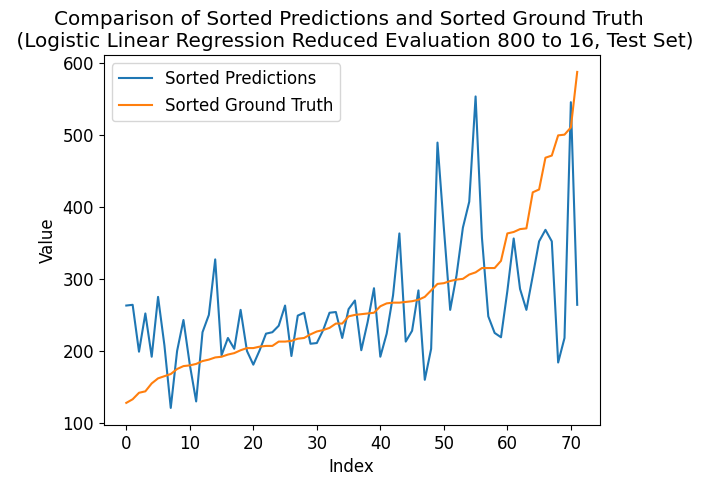

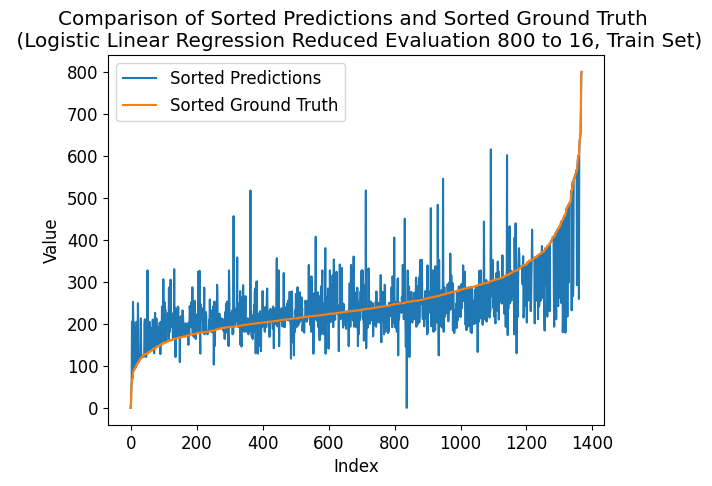

---- ---- ----
class_num = 816
Number of unique elements: 365
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 3.25
Correlation coefficient: 0.5351553225029251
Coefficient of determination (R-squared score, R2 score): 0.17569352708058128
train eval:
Mean squared error: 1.4349415204678362
Correlation coefficient: 0.7826942834897845
Coefficient of determination (R-squared score, R2 score): 0.5757354762711264


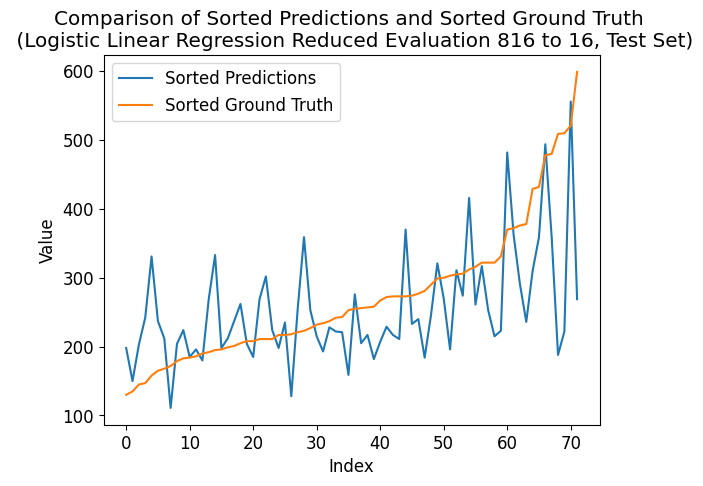

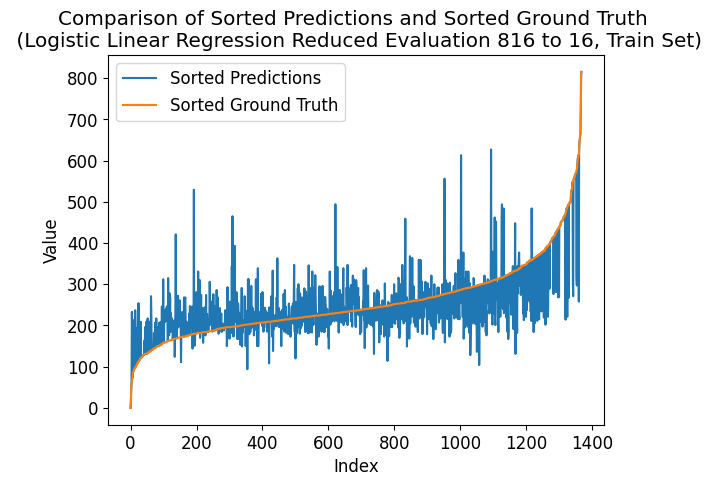

---- ---- ----
class_num = 832
Number of unique elements: 369
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 3.1944444444444446
Correlation coefficient: 0.5262219237468545
Coefficient of determination (R-squared score, R2 score): 0.18978423601937477
train eval:
Mean squared error: 1.388157894736842
Correlation coefficient: 0.7929796795446294
Coefficient of determination (R-squared score, R2 score): 0.5895678397549002


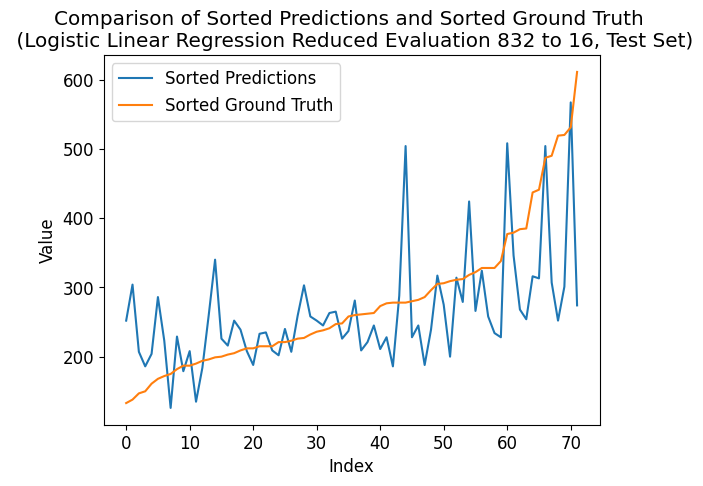

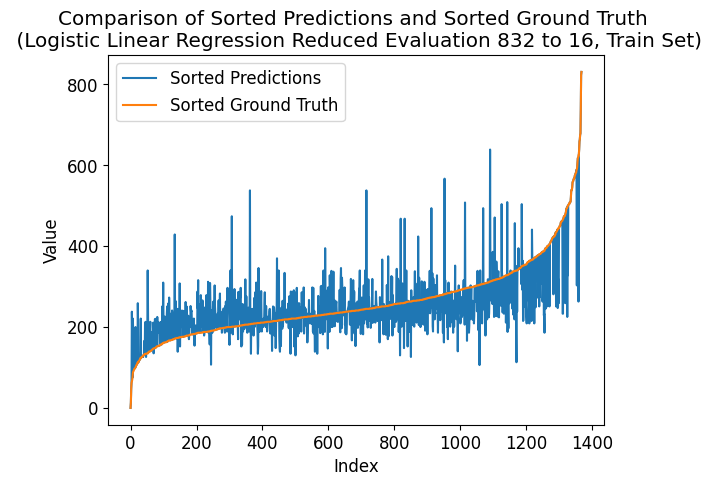

---- ---- ----
class_num = 848
Number of unique elements: 374
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 3.2916666666666665
Correlation coefficient: 0.48057246999800624
Coefficient of determination (R-squared score, R2 score): 0.16512549537648613
train eval:
Mean squared error: 1.4144736842105263
Correlation coefficient: 0.7874109795102556
Coefficient of determination (R-squared score, R2 score): 0.5817871352952775


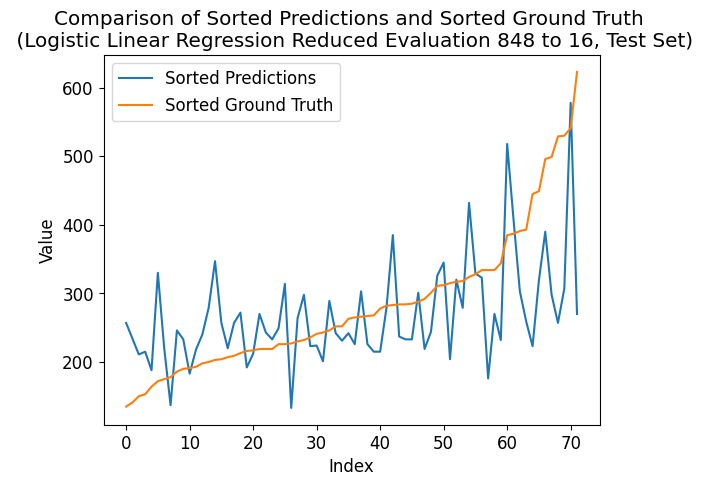

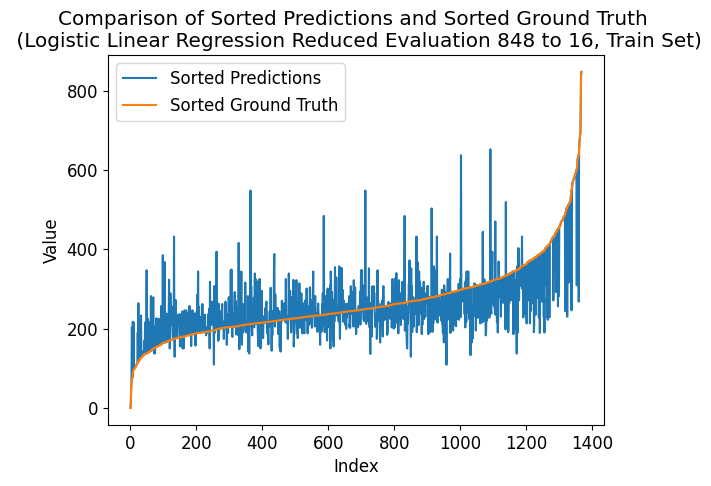

---- ---- ----
class_num = 864
Number of unique elements: 376
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 3.9027777777777777
Correlation coefficient: 0.3868950782276027
Coefficient of determination (R-squared score, R2 score): 0.0101276970497578
train eval:
Mean squared error: 1.3888888888888888
Correlation coefficient: 0.7899206380480293
Coefficient of determination (R-squared score, R2 score): 0.5893517090754663


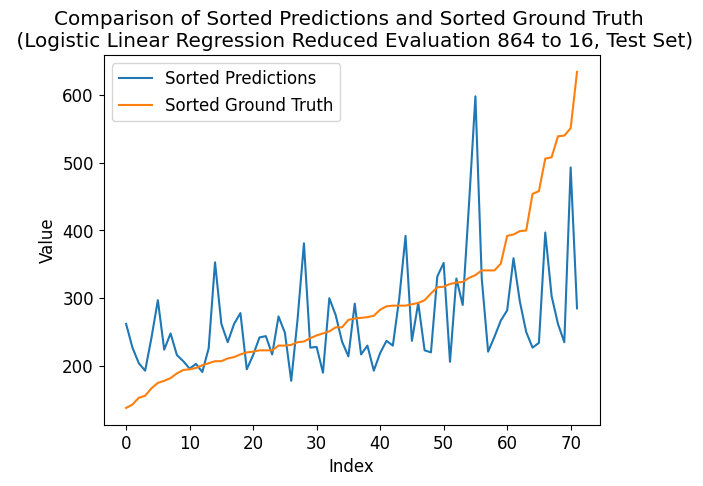

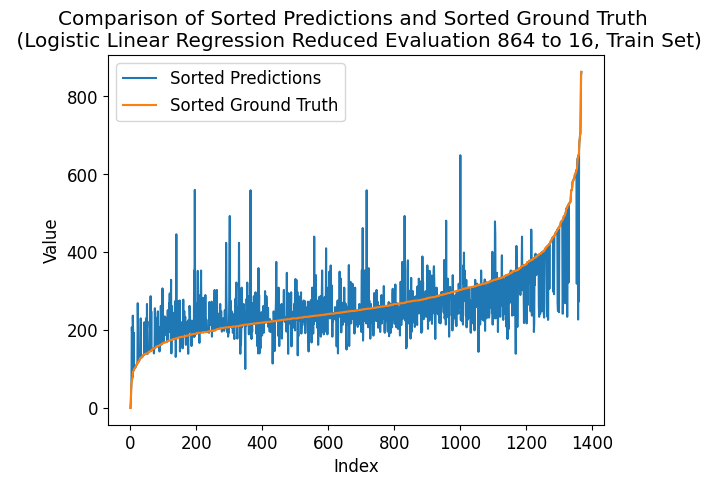

---- ---- ----
class_num = 880
Number of unique elements: 375
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 3.486111111111111
Correlation coefficient: 0.49164609130152154
Coefficient of determination (R-squared score, R2 score): 0.11580801409070896
train eval:
Mean squared error: 1.4583333333333333
Correlation coefficient: 0.7816575550944759
Coefficient of determination (R-squared score, R2 score): 0.5688192945292396


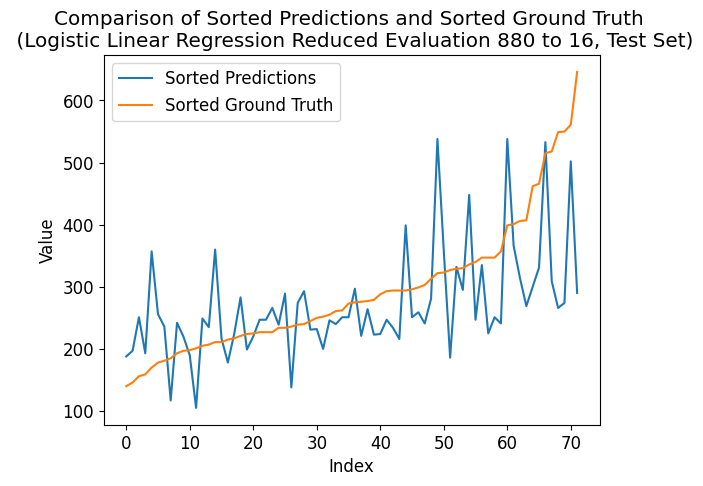

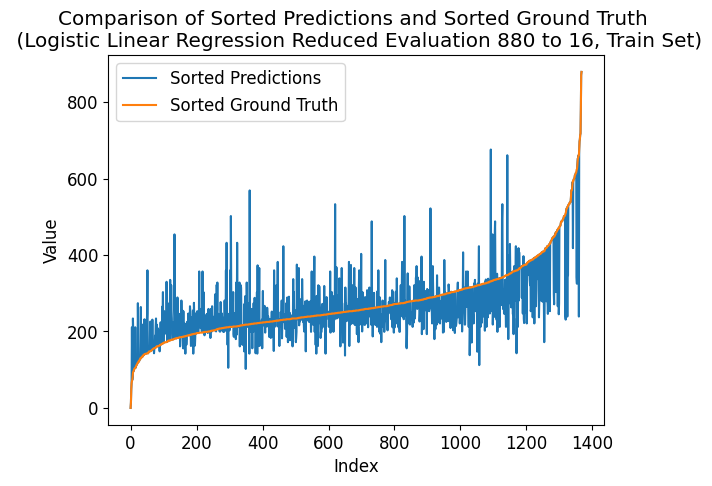

---- ---- ----
class_num = 896
Number of unique elements: 388
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 3.3333333333333335
Correlation coefficient: 0.5034573464200038
Coefficient of determination (R-squared score, R2 score): 0.15455746367239098
train eval:
Mean squared error: 1.418859649122807
Correlation coefficient: 0.7842767491979115
Coefficient of determination (R-squared score, R2 score): 0.5804903512186737


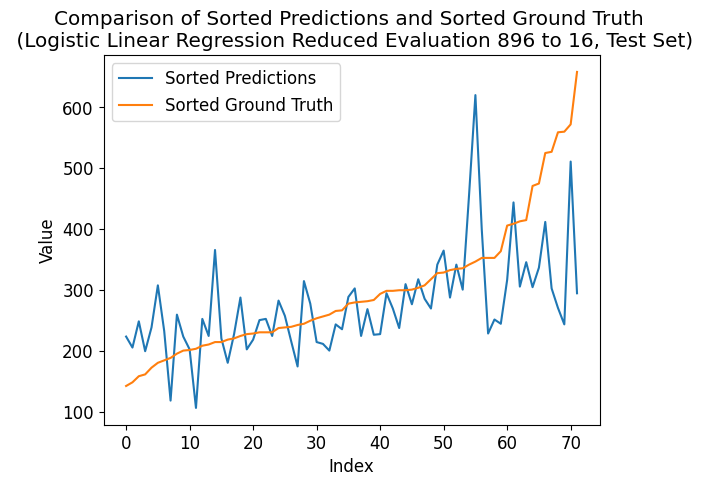

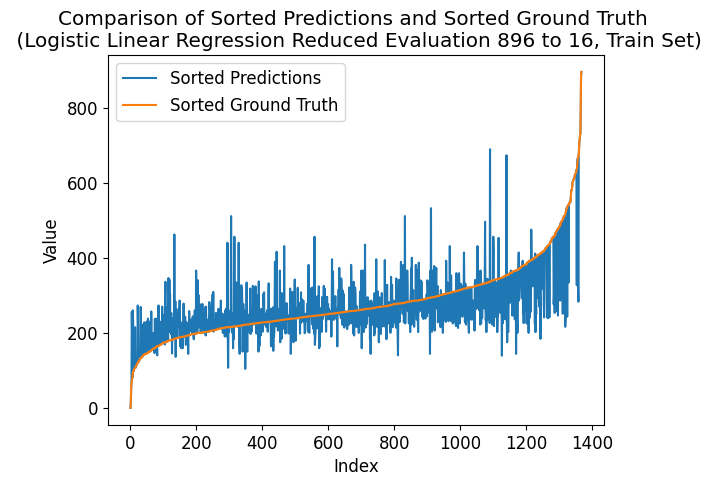

---- ---- ----
class_num = 912
Number of unique elements: 393
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 4.097222222222222
Correlation coefficient: 0.4141246013159934
Coefficient of determination (R-squared score, R2 score): -0.039189784236019376
train eval:
Mean squared error: 1.3589181286549707
Correlation coefficient: 0.7941628504978642
Coefficient of determination (R-squared score, R2 score): 0.5982130669322587


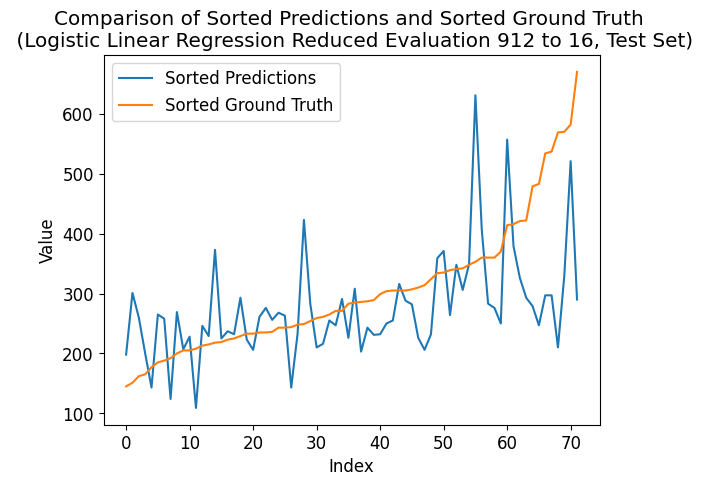

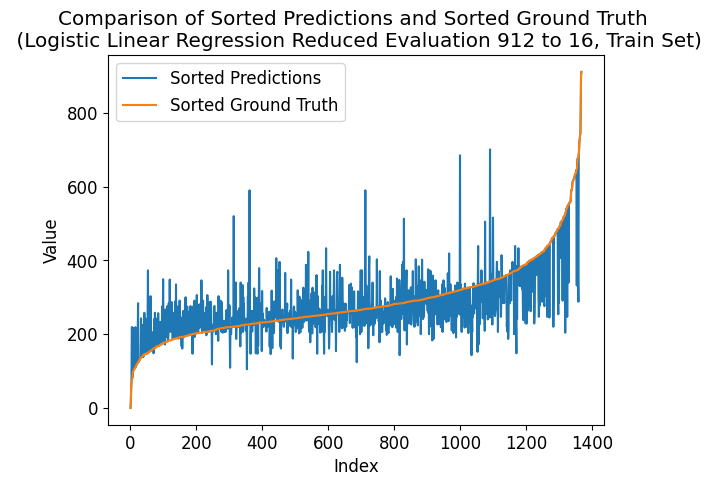

---- ---- ----
class_num = 928
Number of unique elements: 393
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 3.0277777777777777
Correlation coefficient: 0.5306120337926347
Coefficient of determination (R-squared score, R2 score): 0.23205636283575515
train eval:
Mean squared error: 1.3662280701754386
Correlation coefficient: 0.7924892184466998
Coefficient of determination (R-squared score, R2 score): 0.5960517601379192


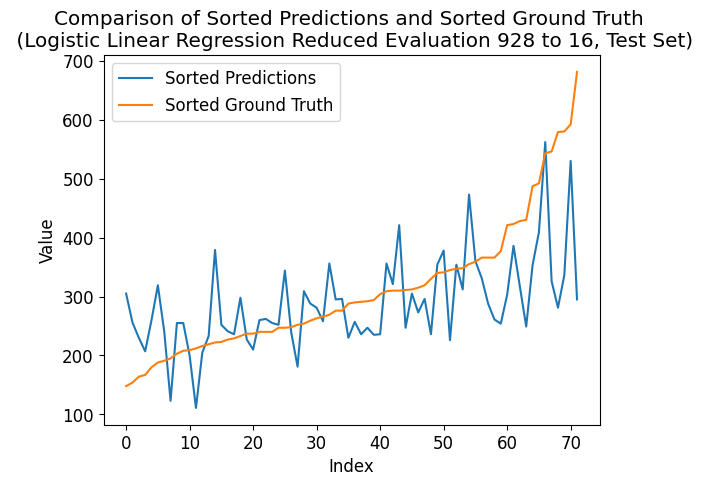

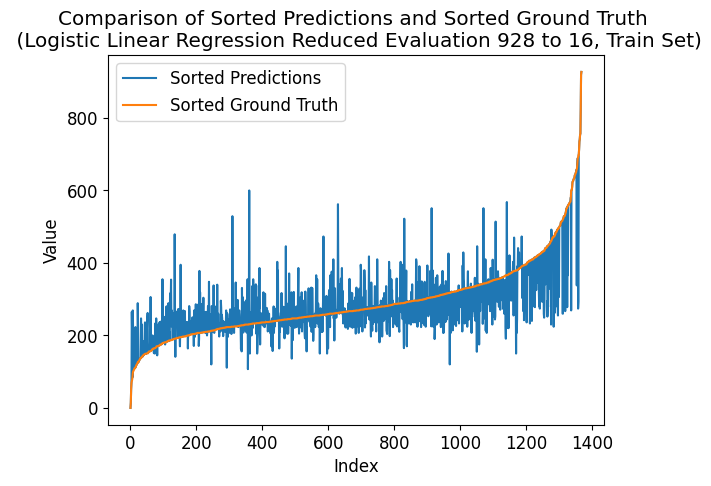

---- ---- ----
class_num = 944
Number of unique elements: 398
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 3.2777777777777777
Correlation coefficient: 0.5038584858703183
Coefficient of determination (R-squared score, R2 score): 0.16864817261118448
train eval:
Mean squared error: 1.3801169590643274
Correlation coefficient: 0.7907728953927907
Coefficient of determination (R-squared score, R2 score): 0.5919452772286737


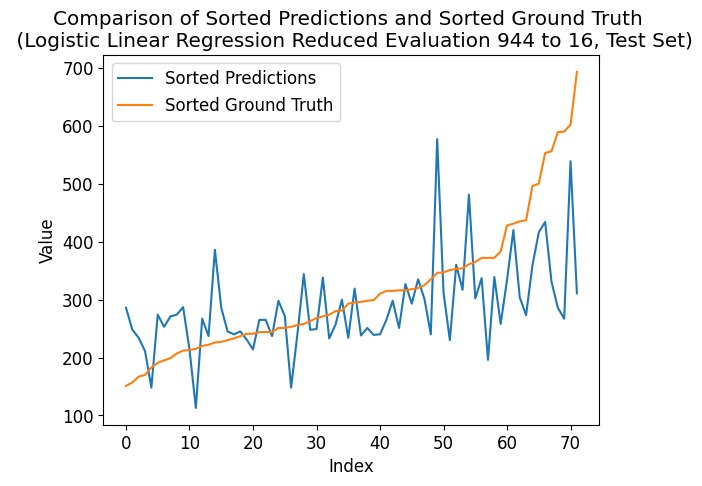

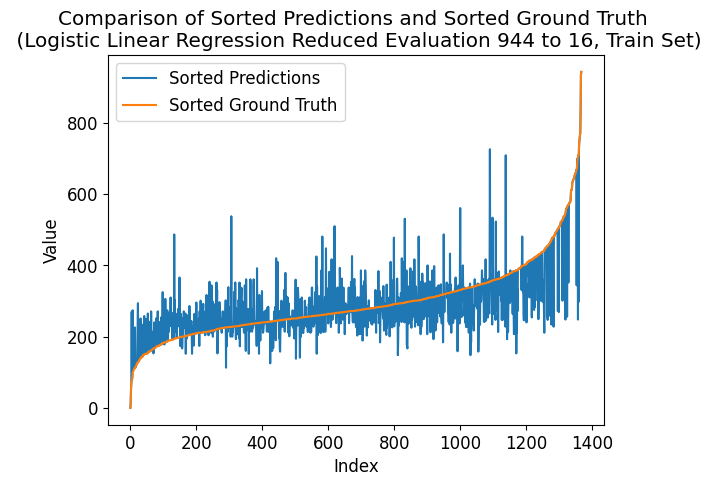

---- ---- ----
class_num = 960
Number of unique elements: 398
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 3.4305555555555554
Correlation coefficient: 0.4767013049209689
Coefficient of determination (R-squared score, R2 score): 0.12989872302950245
train eval:
Mean squared error: 1.3567251461988303
Correlation coefficient: 0.7948123485707044
Coefficient of determination (R-squared score, R2 score): 0.5988614589705608


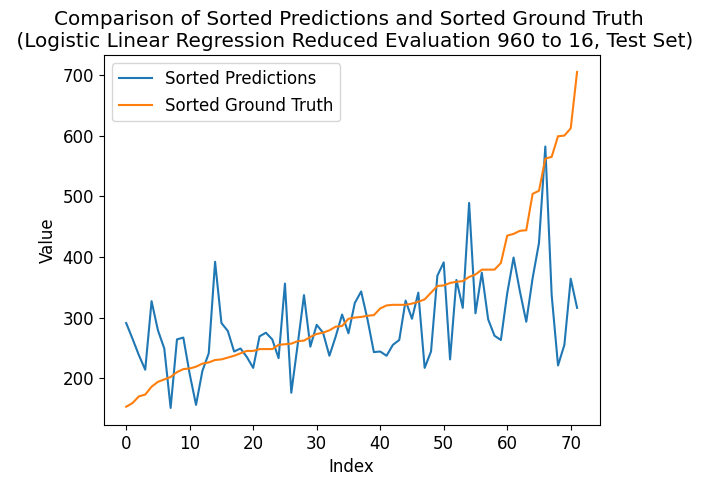

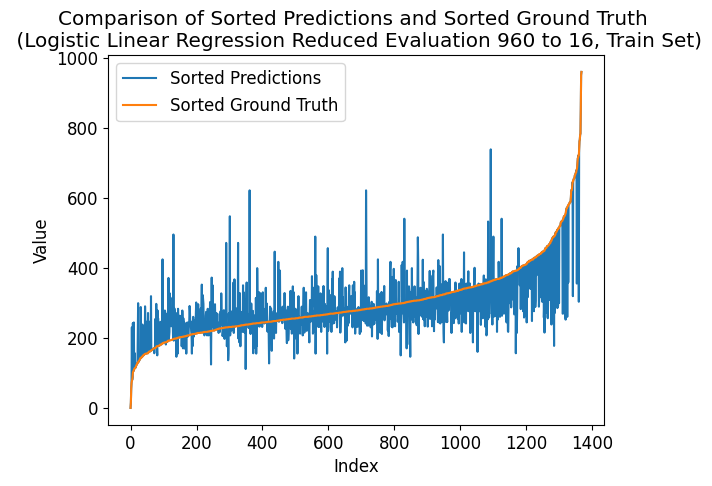

---- ---- ----
class_num = 976
Number of unique elements: 408
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 3.986111111111111
Correlation coefficient: 0.46251262770571977
Coefficient of determination (R-squared score, R2 score): -0.011008366358432387
train eval:
Mean squared error: 1.4042397660818713
Correlation coefficient: 0.7902669648816
Coefficient of determination (R-squared score, R2 score): 0.584812964807353


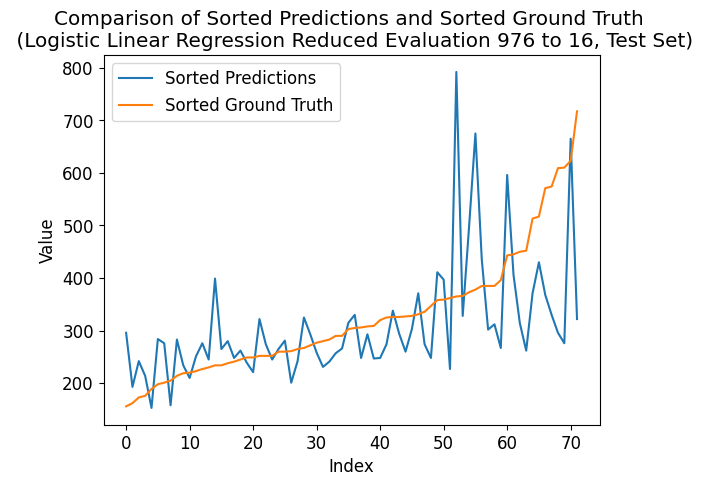

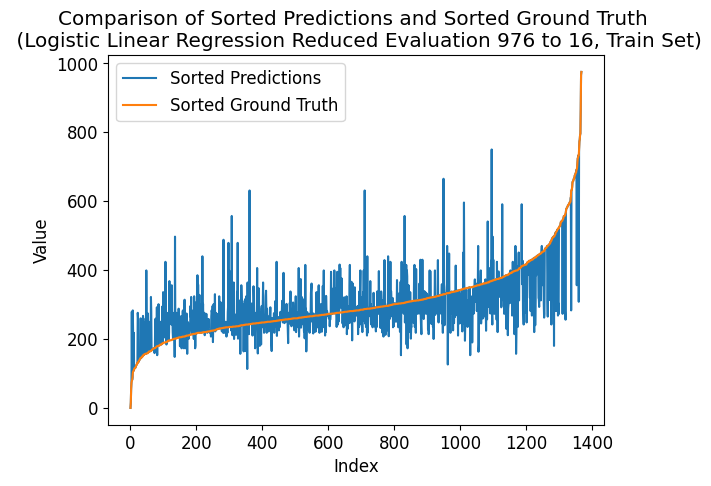

---- ---- ----
class_num = 992
Number of unique elements: 406
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 4.25
Correlation coefficient: 0.4169227166945107
Coefficient of determination (R-squared score, R2 score): -0.0779392338177014
train eval:
Mean squared error: 1.3969298245614035
Correlation coefficient: 0.7885553217191804
Coefficient of determination (R-squared score, R2 score): 0.5869742716016926


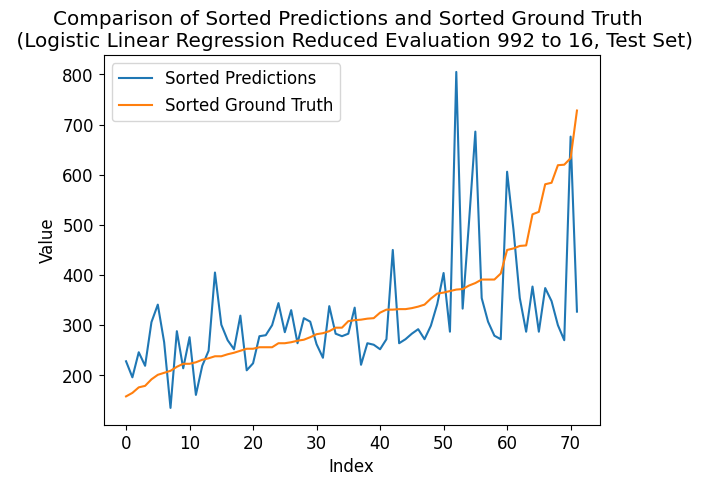

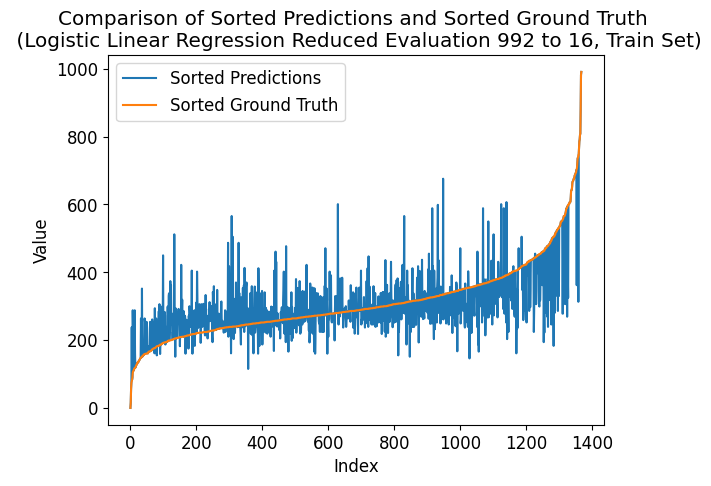

---- ---- ----
class_num = 1008
Number of unique elements: 414
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 4.055555555555555
Correlation coefficient: 0.4171084530480764
Coefficient of determination (R-squared score, R2 score): -0.028621752531924338
train eval:
Mean squared error: 1.3954678362573099
Correlation coefficient: 0.7909628141996667
Coefficient of determination (R-squared score, R2 score): 0.5874065329605606


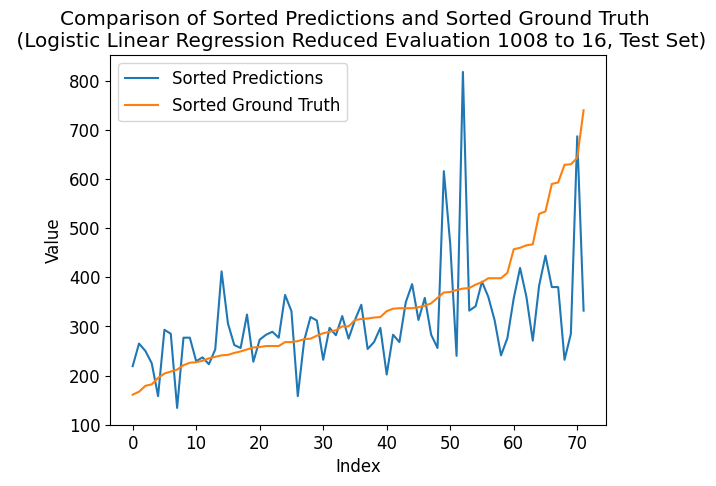

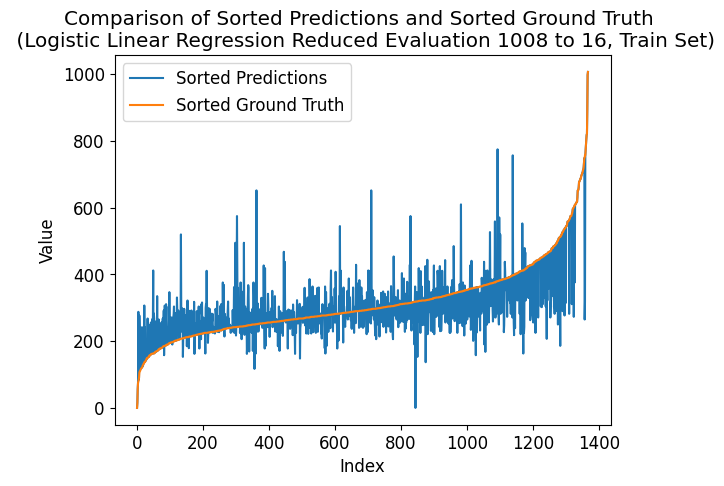

---- ---- ----
class_num = 1024
Number of unique elements: 421
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 4.097222222222222
Correlation coefficient: 0.369574849704913
Coefficient of determination (R-squared score, R2 score): -0.039189784236019376
train eval:
Mean squared error: 1.3216374269005848
Correlation coefficient: 0.7993317759207863
Coefficient of determination (R-squared score, R2 score): 0.609235731583391


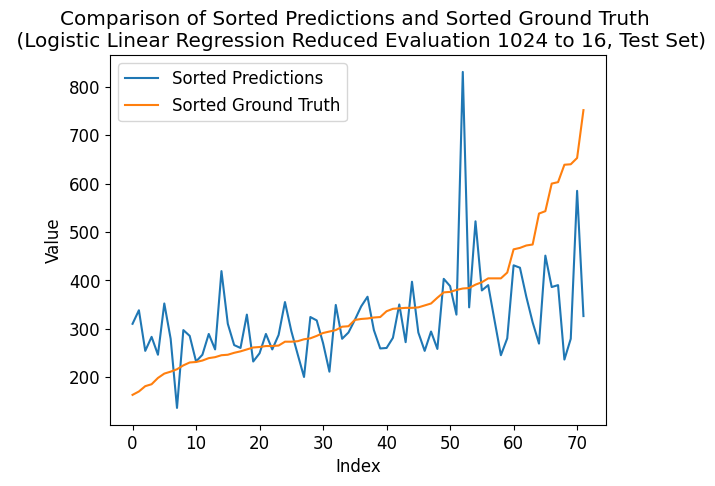

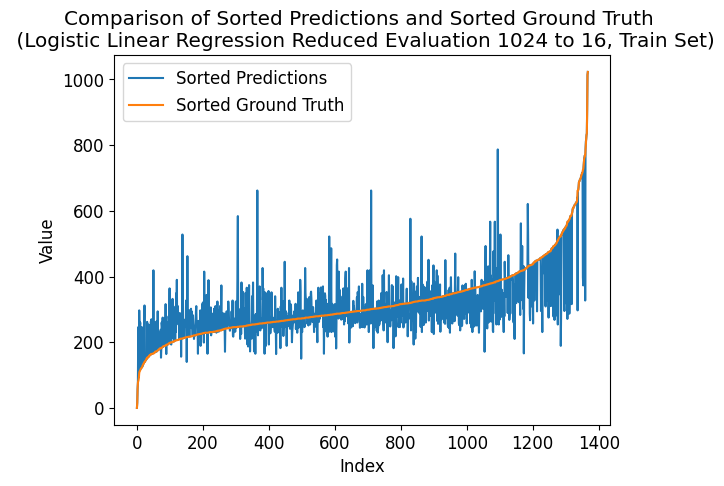

---- ---- ----
class_num = 1040
Number of unique elements: 429
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 4.222222222222222
Correlation coefficient: 0.38461444972865816
Coefficient of determination (R-squared score, R2 score): -0.07089387934830471
train eval:
Mean squared error: 1.4429824561403508
Correlation coefficient: 0.7833282616354201
Coefficient of determination (R-squared score, R2 score): 0.5733580387973528


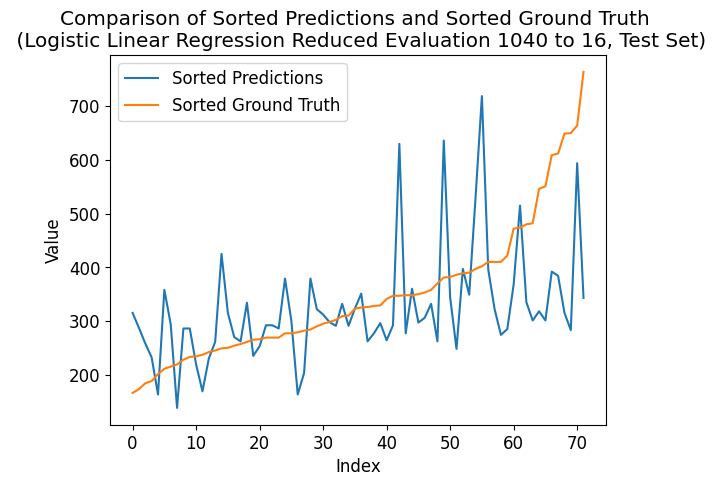

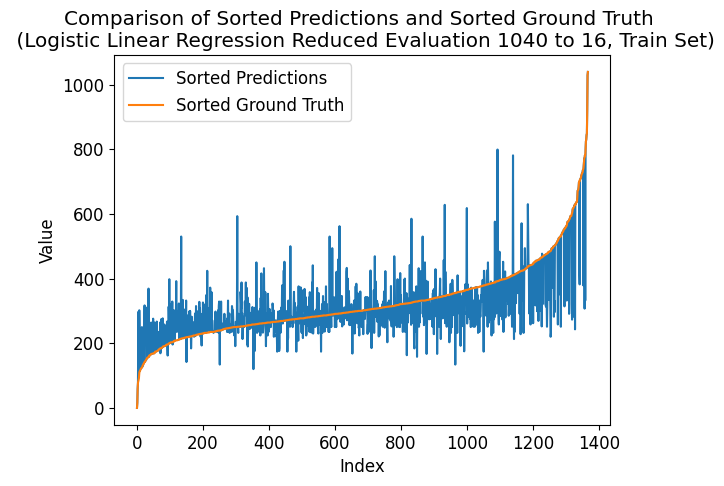

---- ---- ----
class_num = 1056
Number of unique elements: 428
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 3.4166666666666665
Correlation coefficient: 0.49316794072568415
Coefficient of determination (R-squared score, R2 score): 0.1334214002642008
train eval:
Mean squared error: 1.314327485380117
Correlation coefficient: 0.8030066187698501
Coefficient of determination (R-squared score, R2 score): 0.6113970383777307


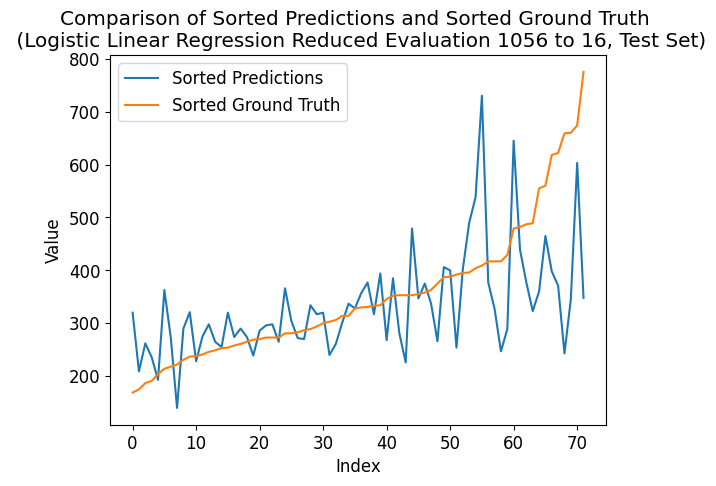

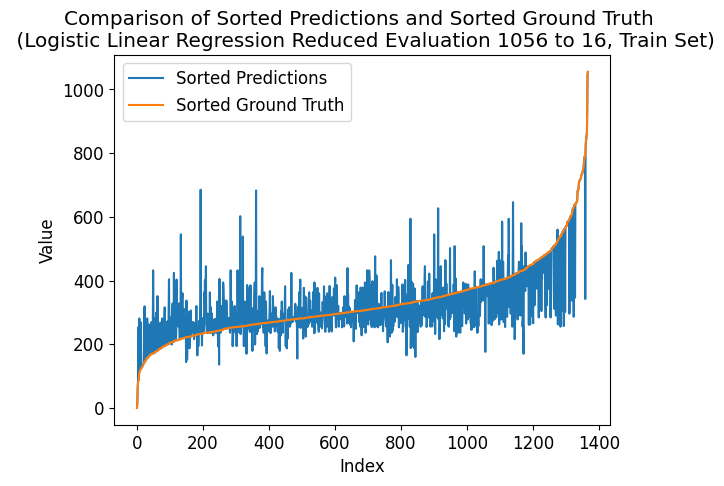

---- ---- ----
class_num = 1072
Number of unique elements: 435
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 3.4722222222222223
Correlation coefficient: 0.497773439480096
Coefficient of determination (R-squared score, R2 score): 0.1193306913254073
train eval:
Mean squared error: 1.2244152046783625
Correlation coefficient: 0.8166071499634825
Coefficient of determination (R-squared score, R2 score): 0.6379811119481085


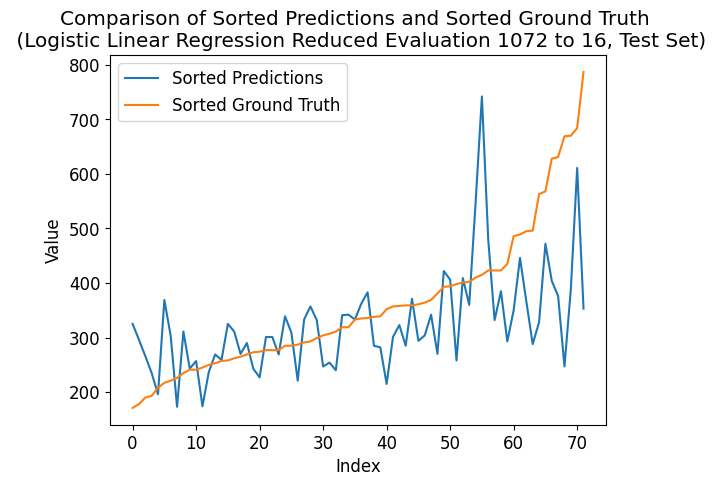

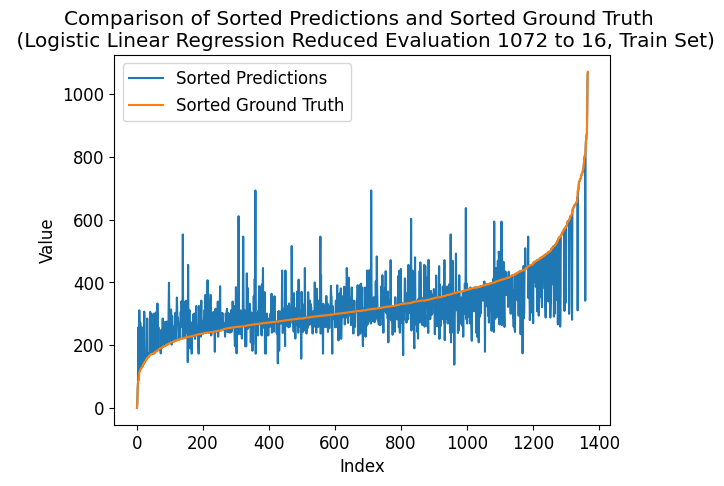

---- ---- ----
class_num = 1088
Number of unique elements: 437
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 3.6527777777777777
Correlation coefficient: 0.45987763081270244
Coefficient of determination (R-squared score, R2 score): 0.07353588727432847
train eval:
Mean squared error: 1.3019005847953216
Correlation coefficient: 0.8065959356445227
Coefficient of determination (R-squared score, R2 score): 0.6150712599281081


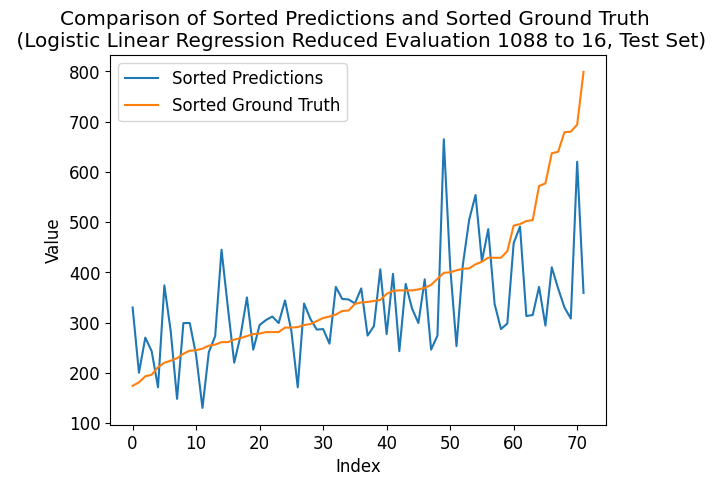

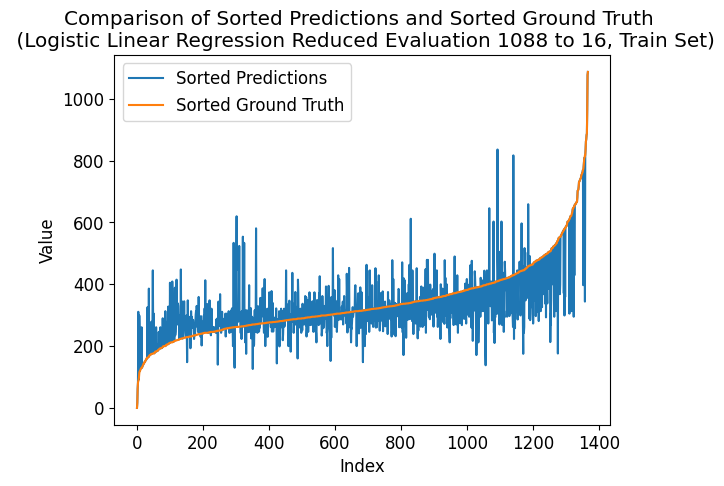

---- ---- ----
class_num = 1104
Number of unique elements: 435
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 4.125
Correlation coefficient: 0.3830549835135723
Coefficient of determination (R-squared score, R2 score): -0.04623513870541607
train eval:
Mean squared error: 1.280701754385965
Correlation coefficient: 0.8080829464036917
Coefficient of determination (R-squared score, R2 score): 0.6213390496316931


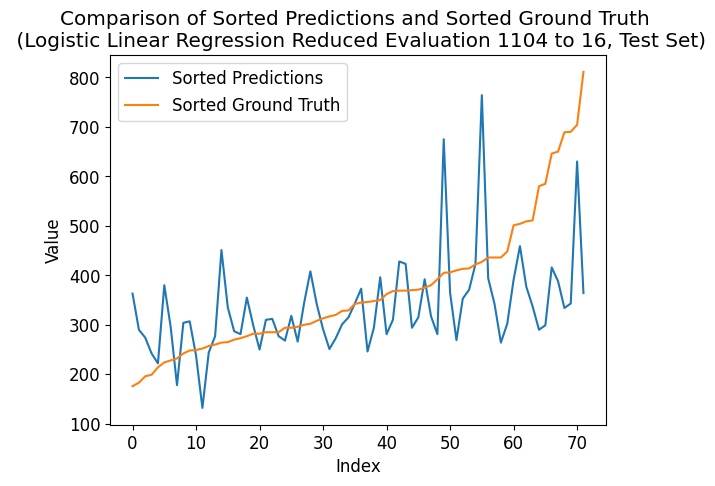

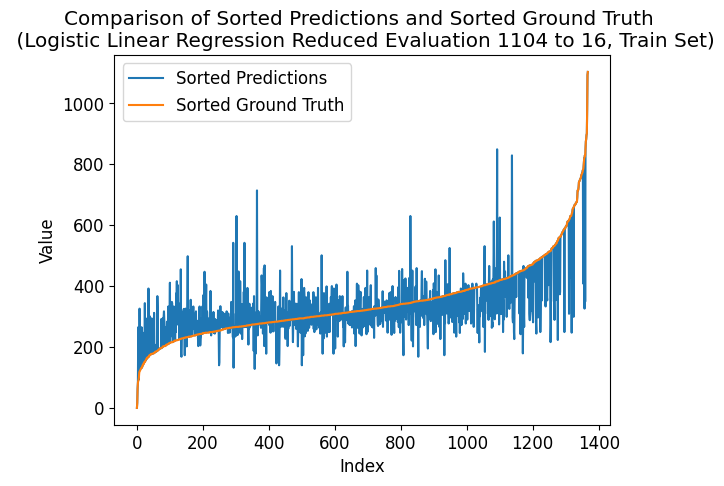

---- ---- ----
class_num = 1120
Number of unique elements: 443
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 4.625
Correlation coefficient: 0.36213763845889224
Coefficient of determination (R-squared score, R2 score): -0.1730515191545574
train eval:
Mean squared error: 1.2046783625730995
Correlation coefficient: 0.8191018992346507
Coefficient of determination (R-squared score, R2 score): 0.6438166402928254


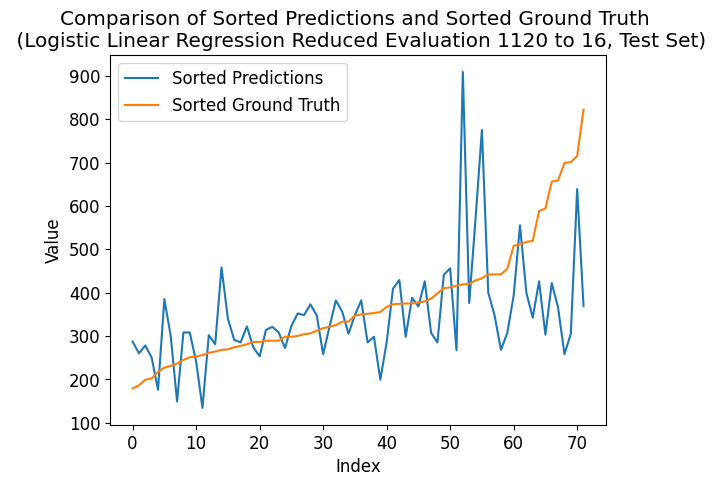

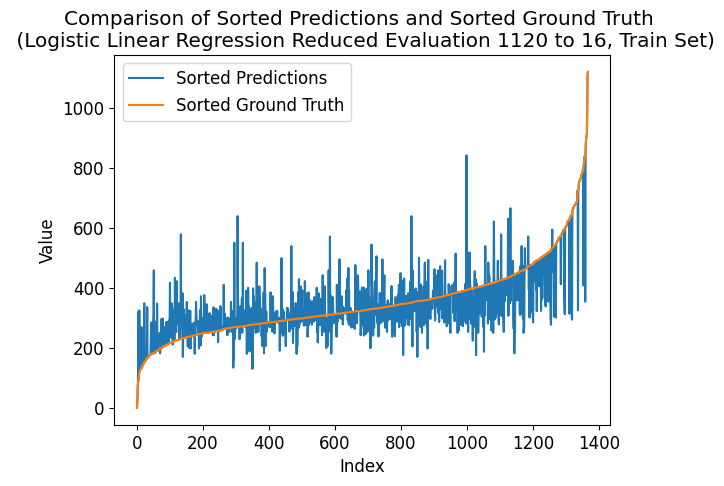

---- ---- ----
class_num = 1136
Number of unique elements: 446
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 3.763888888888889
Correlation coefficient: 0.452082055121772
Coefficient of determination (R-squared score, R2 score): 0.04535446939674148
train eval:
Mean squared error: 1.2273391812865497
Correlation coefficient: 0.8177558150890845
Coefficient of determination (R-squared score, R2 score): 0.6371165892303725


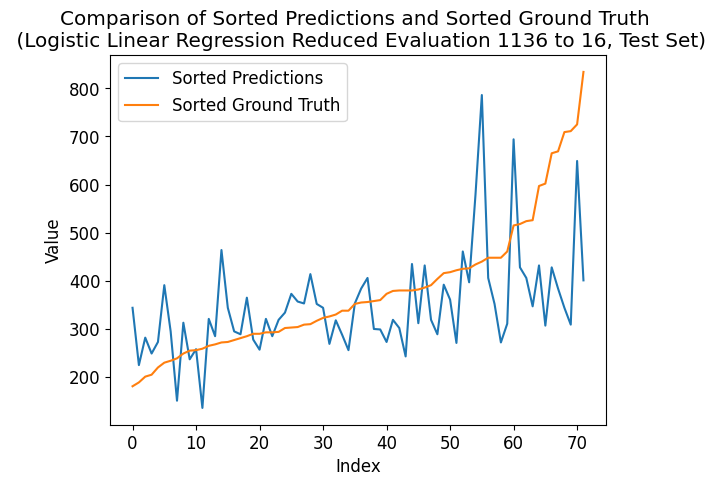

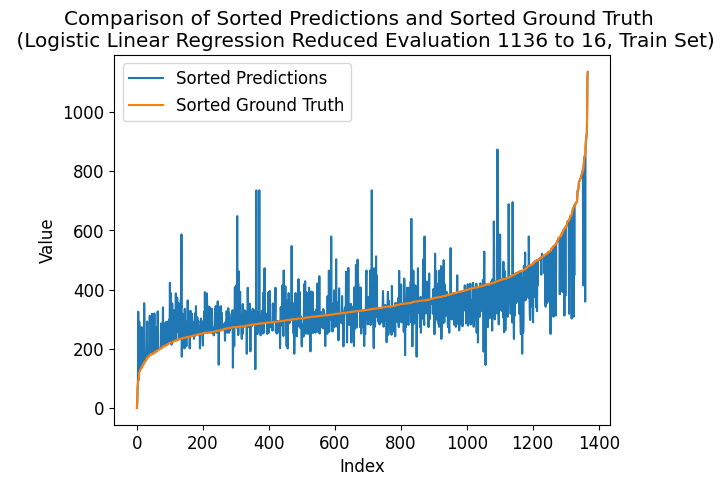

---- ---- ----
class_num = 1152
Number of unique elements: 453
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 3.3055555555555554
Correlation coefficient: 0.5030456830970099
Coefficient of determination (R-squared score, R2 score): 0.16160281814178779
train eval:
Mean squared error: 1.2543859649122806
Correlation coefficient: 0.8129471611031277
Coefficient of determination (R-squared score, R2 score): 0.6291197540913158


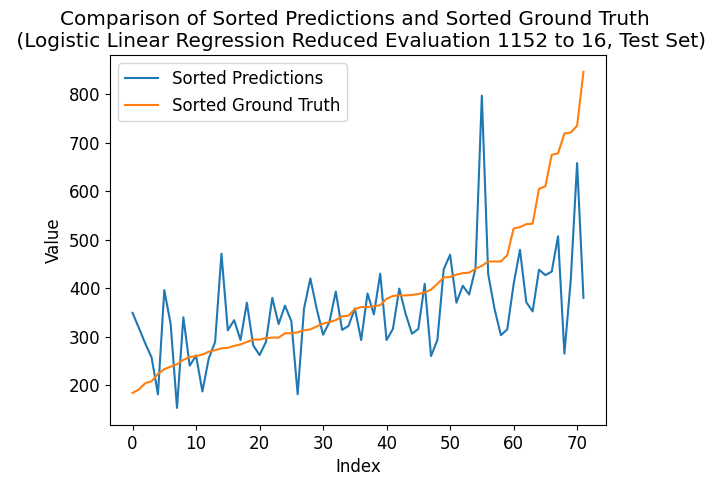

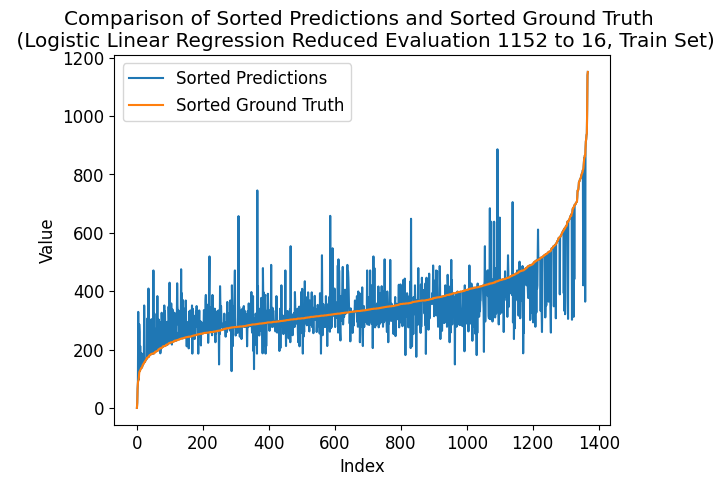

---- ---- ----
class_num = 1168
Number of unique elements: 463
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 3.763888888888889
Correlation coefficient: 0.41847194394248616
Coefficient of determination (R-squared score, R2 score): 0.04535446939674148
train eval:
Mean squared error: 1.1564327485380117
Correlation coefficient: 0.8292765652047343
Coefficient of determination (R-squared score, R2 score): 0.6580812651354672


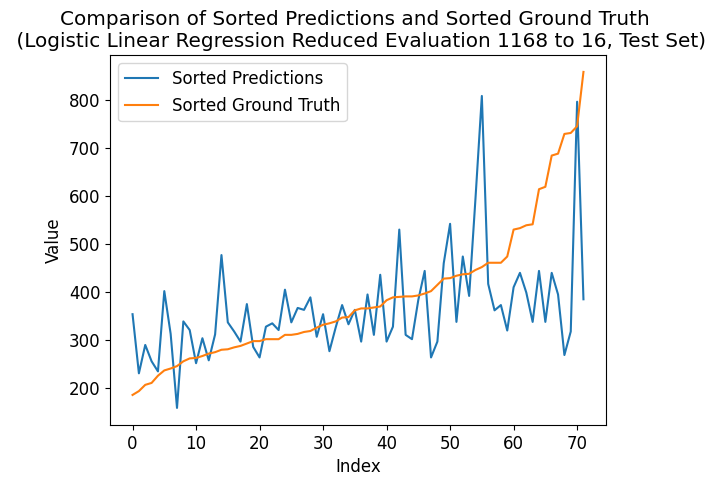

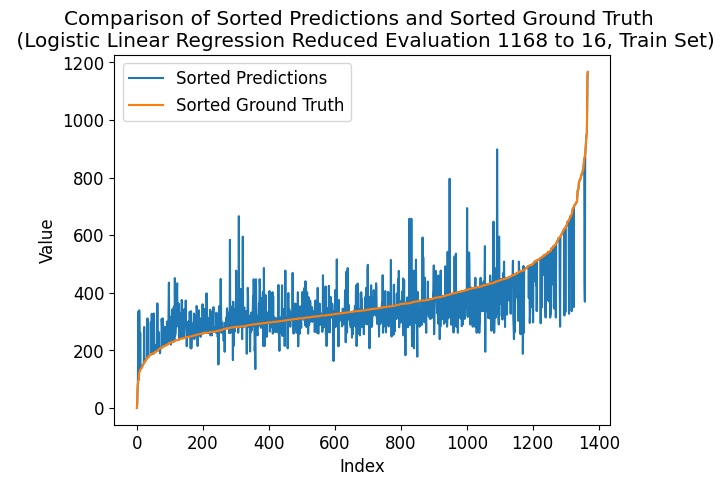

---- ---- ----
class_num = 1184
Number of unique elements: 457
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 3.5694444444444446
Correlation coefficient: 0.4536007210378372
Coefficient of determination (R-squared score, R2 score): 0.09467195068251877
train eval:
Mean squared error: 1.2682748538011697
Correlation coefficient: 0.8115310279797219
Coefficient of determination (R-squared score, R2 score): 0.6250132711820705


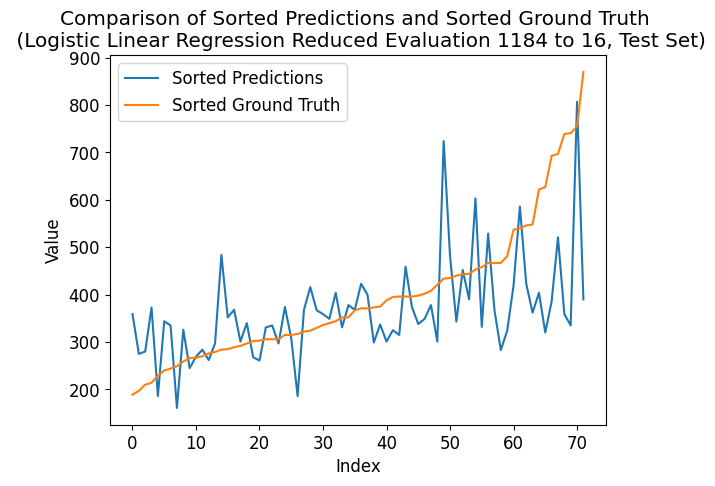

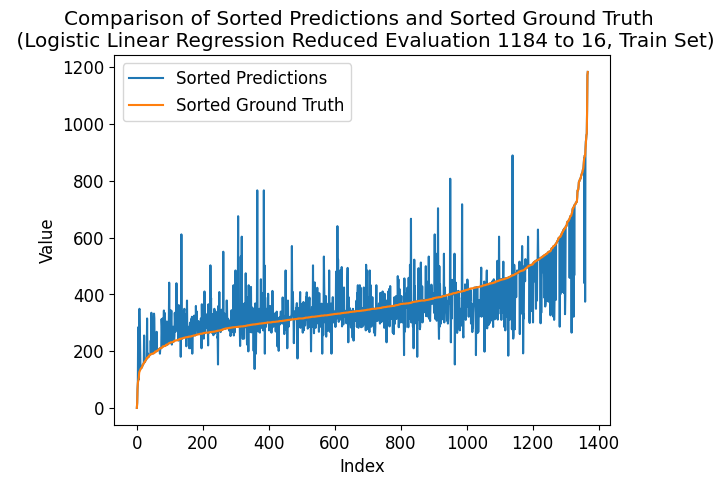

---- ---- ----
class_num = 1200
Number of unique elements: 464
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 3.8055555555555554
Correlation coefficient: 0.39485006534468375
Coefficient of determination (R-squared score, R2 score): 0.034786437692646444
train eval:
Mean squared error: 1.1966374269005848
Correlation coefficient: 0.8167581826335334
Coefficient of determination (R-squared score, R2 score): 0.6461940777665991


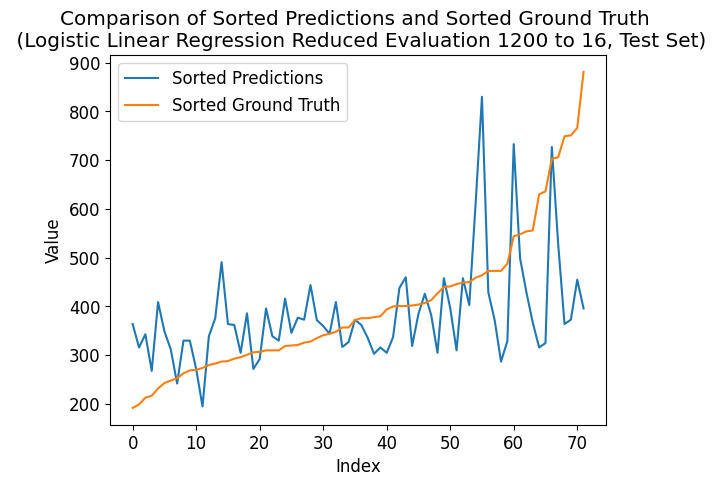

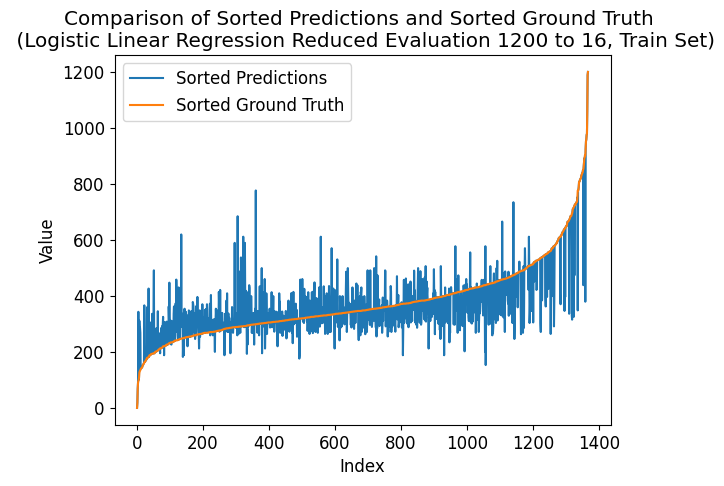

---- ---- ----
class_num = 1216
Number of unique elements: 476
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 3.9166666666666665
Correlation coefficient: 0.347297234354348
Coefficient of determination (R-squared score, R2 score): 0.006605019815059454
train eval:
Mean squared error: 1.0994152046783625
Correlation coefficient: 0.8346613117121789
Coefficient of determination (R-squared score, R2 score): 0.6749394581313164


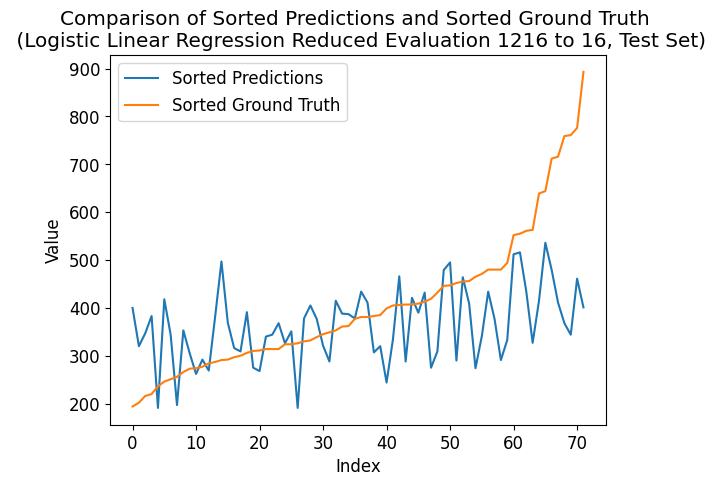

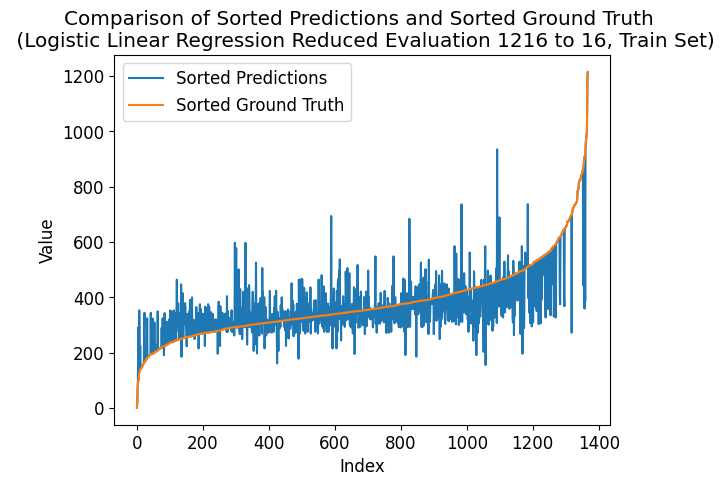

---- ---- ----
class_num = 1232
Number of unique elements: 480
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 3.4305555555555554
Correlation coefficient: 0.49179006421871096
Coefficient of determination (R-squared score, R2 score): 0.12989872302950245
train eval:
Mean squared error: 1.1980994152046784
Correlation coefficient: 0.8208287473137247
Coefficient of determination (R-squared score, R2 score): 0.6457618164077311


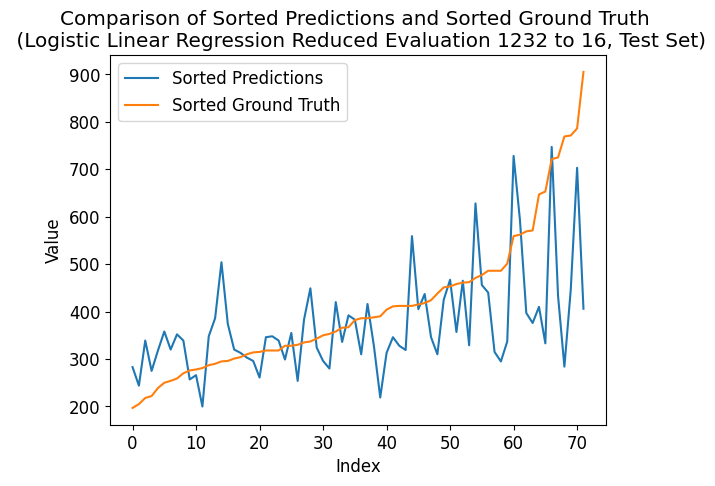

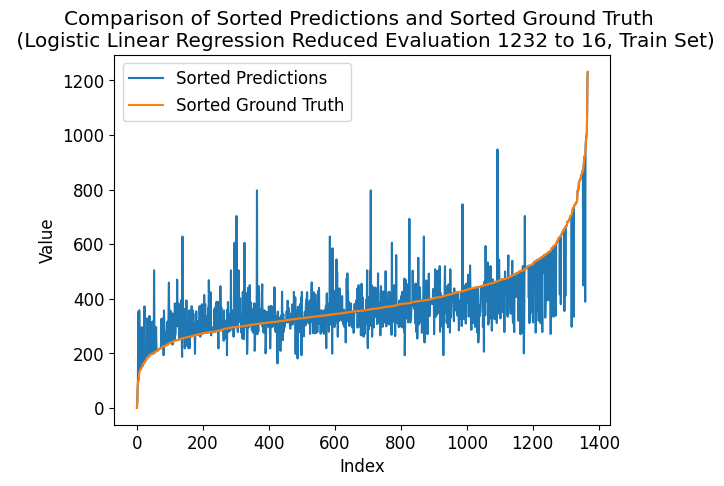

---- ---- ----
class_num = 1248
Number of unique elements: 474
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 3.1805555555555554
Correlation coefficient: 0.5440613383250746
Coefficient of determination (R-squared score, R2 score): 0.19330691325407312
train eval:
Mean squared error: 1.1703216374269005
Correlation coefficient: 0.8237467664827569
Coefficient of determination (R-squared score, R2 score): 0.6539747822262219


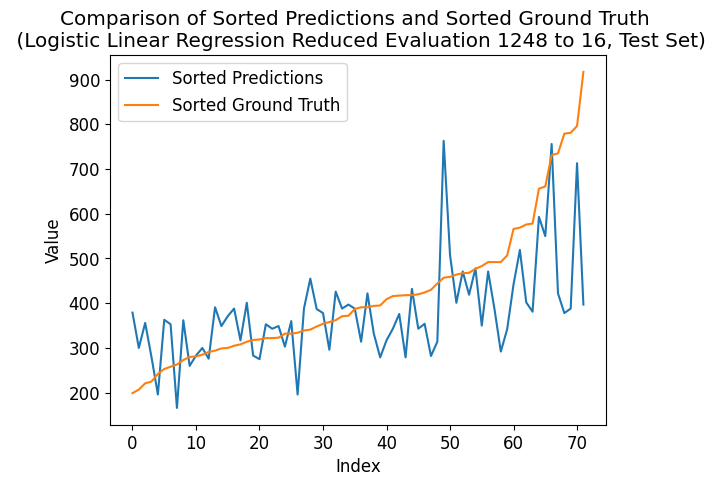

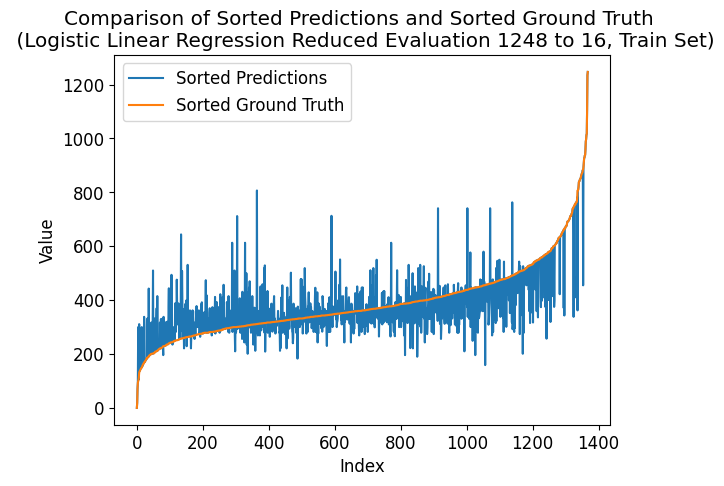

---- ---- ----
class_num = 1264
Number of unique elements: 487
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 3.625
Correlation coefficient: 0.44557698347128855
Coefficient of determination (R-squared score, R2 score): 0.08058124174372527
train eval:
Mean squared error: 1.0460526315789473
Correlation coefficient: 0.8425111589922274
Coefficient of determination (R-squared score, R2 score): 0.6907169977299958


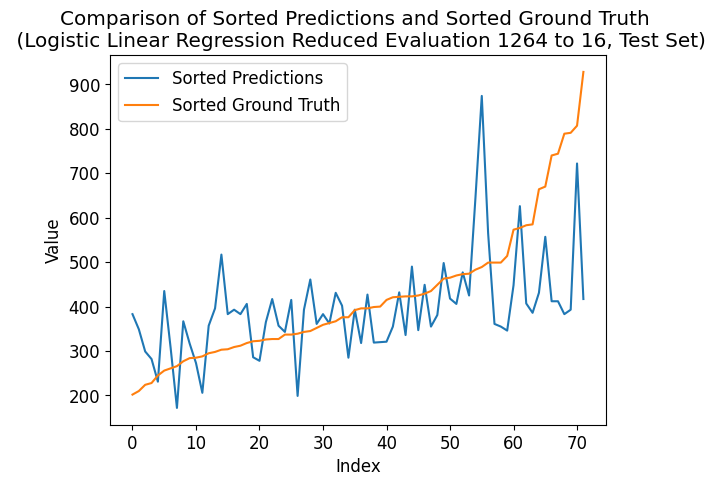

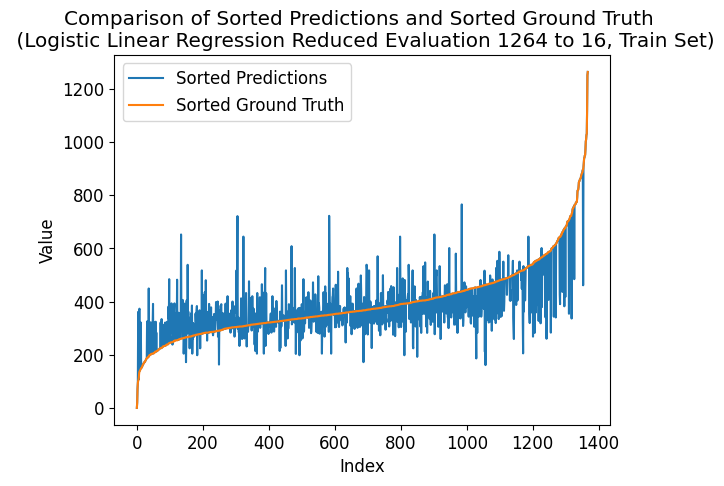

---- ---- ----
class_num = 1280
Number of unique elements: 488
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 3.736111111111111
Correlation coefficient: 0.4095466365789959
Coefficient of determination (R-squared score, R2 score): 0.052399823866138284
train eval:
Mean squared error: 1.1359649122807018
Correlation coefficient: 0.8329563015533834
Coefficient of determination (R-squared score, R2 score): 0.6641329241596181


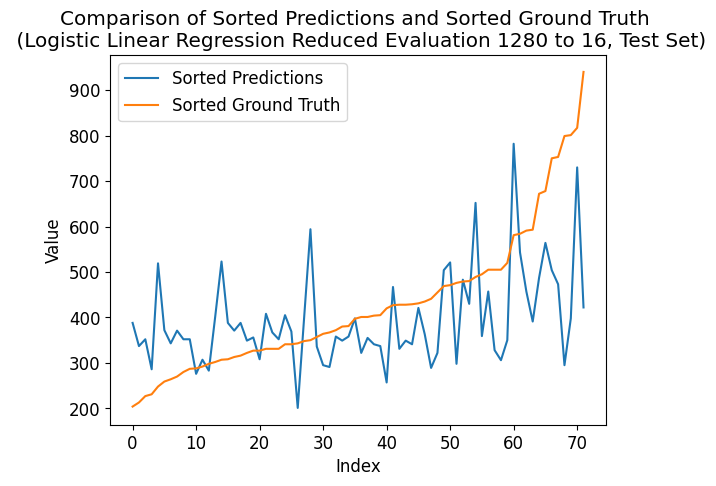

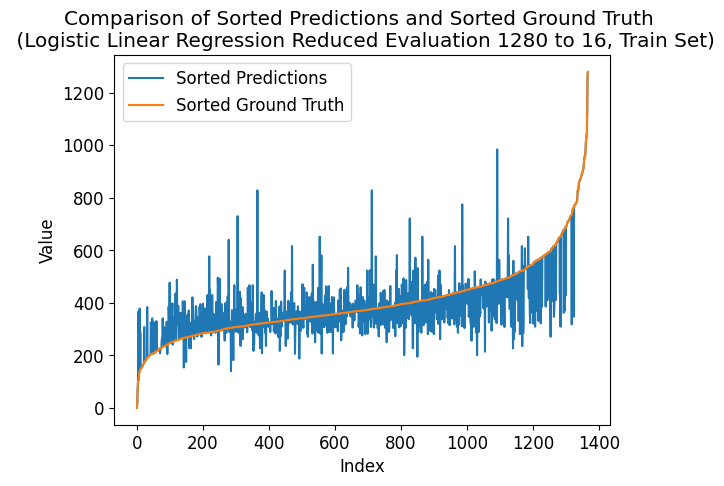

---- ---- ----
class_num = 1296
Number of unique elements: 492
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 3.7916666666666665
Correlation coefficient: 0.42597061673103304
Coefficient of determination (R-squared score, R2 score): 0.03830911492734479
train eval:
Mean squared error: 1.0738304093567252
Correlation coefficient: 0.8365987896759114
Coefficient of determination (R-squared score, R2 score): 0.6825040319115052


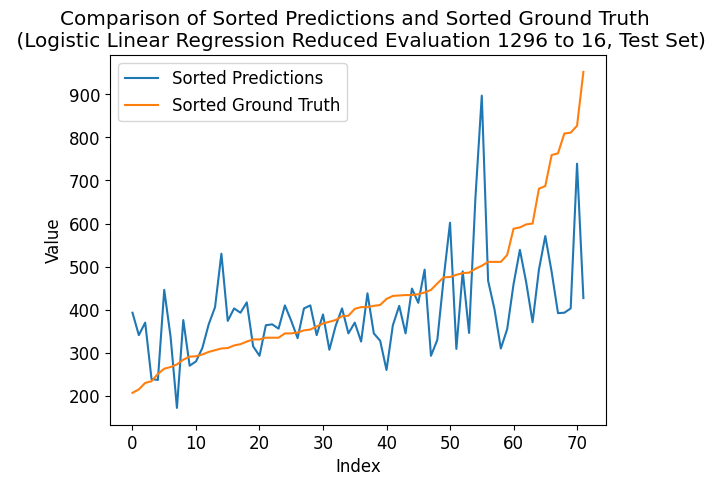

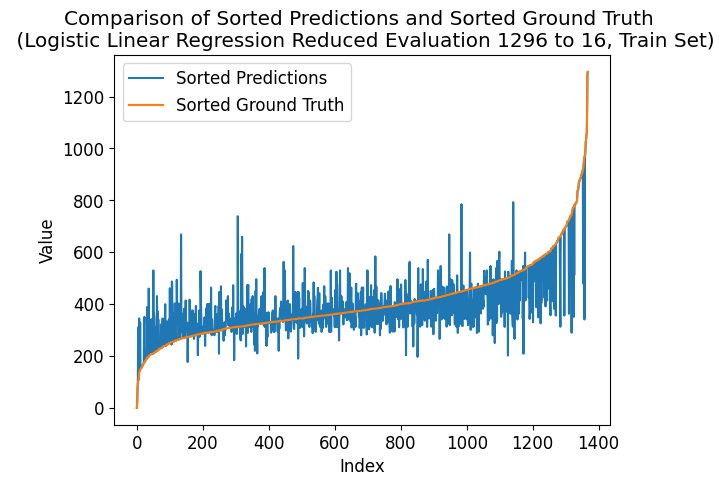

---- ---- ----
class_num = 1312
Number of unique elements: 499
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 3.4722222222222223
Correlation coefficient: 0.46263440199102385
Coefficient of determination (R-squared score, R2 score): 0.1193306913254073
train eval:
Mean squared error: 1.0285087719298245
Correlation coefficient: 0.8446545225524482
Coefficient of determination (R-squared score, R2 score): 0.695904134036411


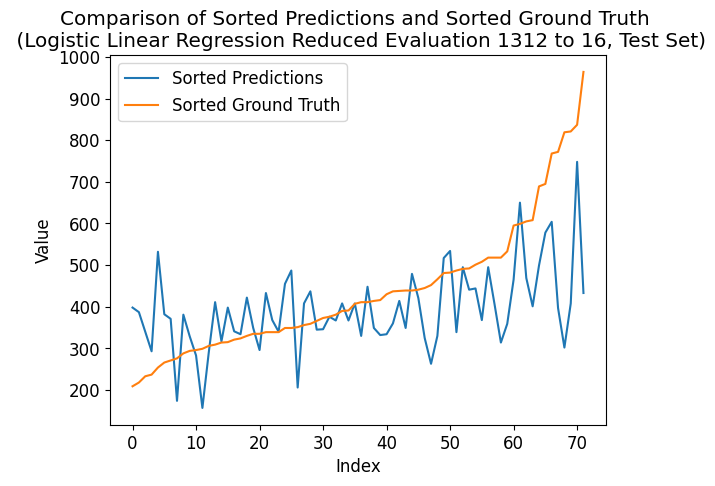

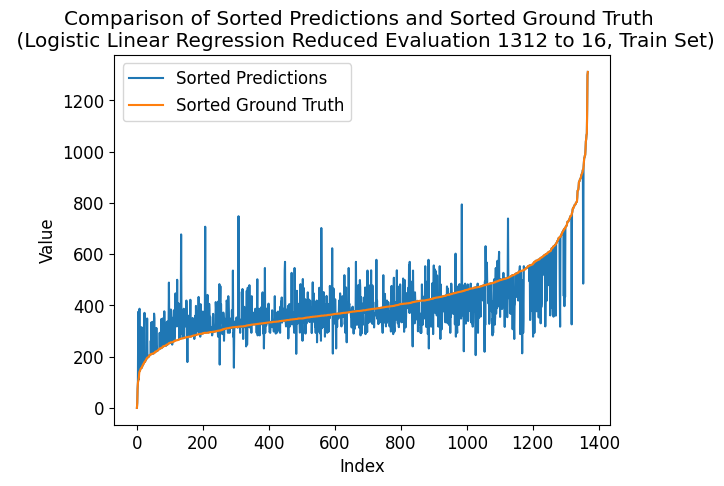

---- ---- ----
class_num = 1328
Number of unique elements: 497
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 4.180555555555555
Correlation coefficient: 0.3639564680255573
Coefficient of determination (R-squared score, R2 score): -0.060325847644209674
train eval:
Mean squared error: 1.0972222222222223
Correlation coefficient: 0.8354458647351714
Coefficient of determination (R-squared score, R2 score): 0.6755878501696183


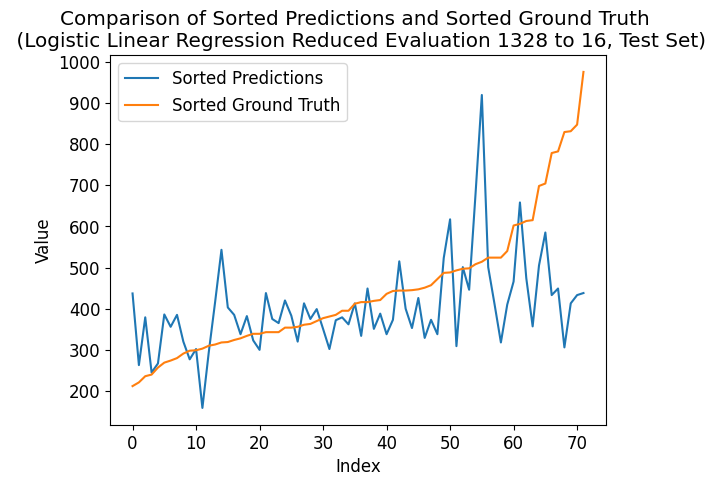

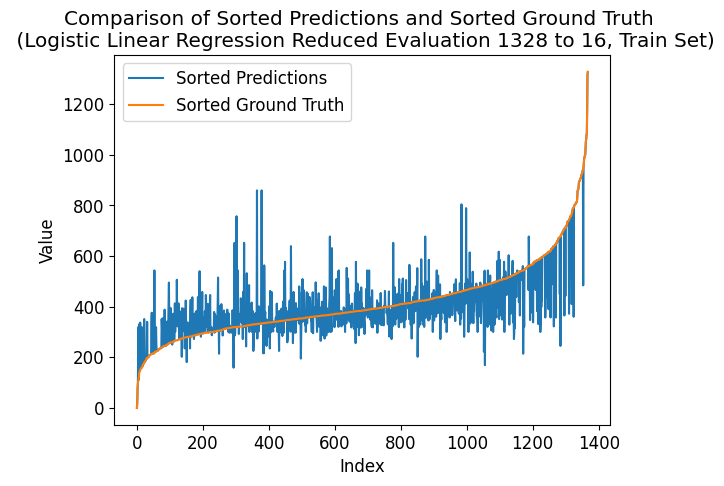

---- ---- ----
class_num = 1344
Number of unique elements: 501
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 3.5555555555555554
Correlation coefficient: 0.4278885631510579
Coefficient of determination (R-squared score, R2 score): 0.09819462791721711
train eval:
Mean squared error: 1.1535087719298245
Correlation coefficient: 0.8274173135311866
Coefficient of determination (R-squared score, R2 score): 0.658945787853203


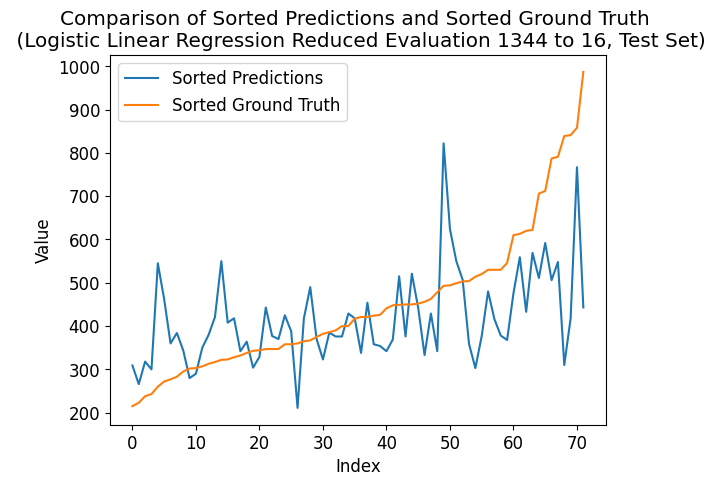

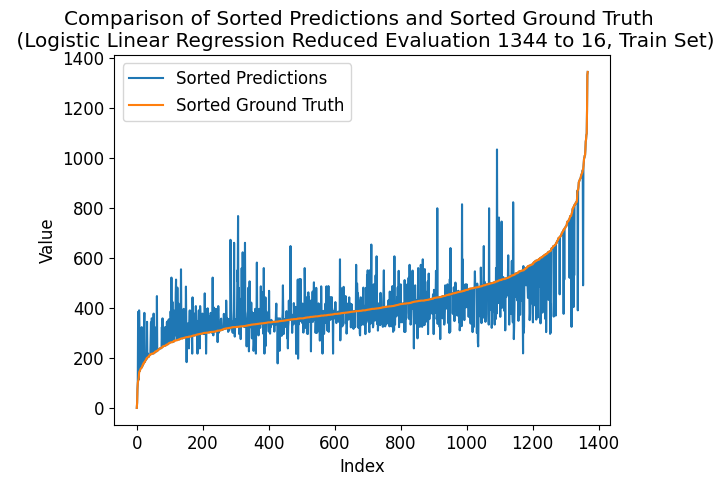

---- ---- ----
class_num = 1360
Number of unique elements: 503
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 3.4444444444444446
Correlation coefficient: 0.4750872969502953
Coefficient of determination (R-squared score, R2 score): 0.1263760457948041
train eval:
Mean squared error: 1.1454678362573099
Correlation coefficient: 0.8292980782943642
Coefficient of determination (R-squared score, R2 score): 0.6613232253269766


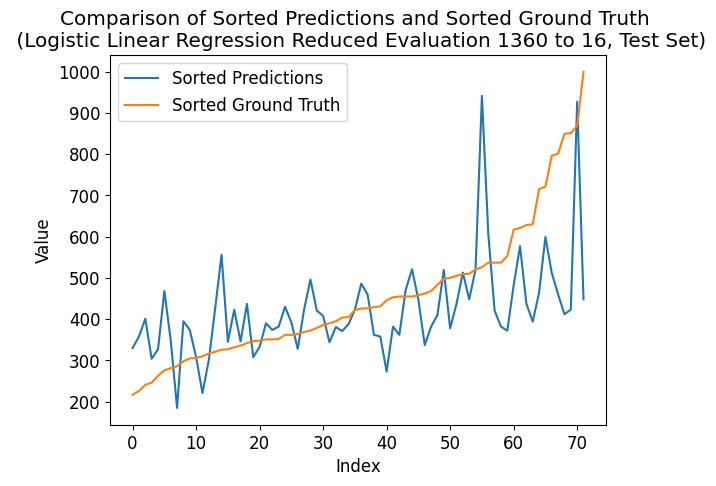

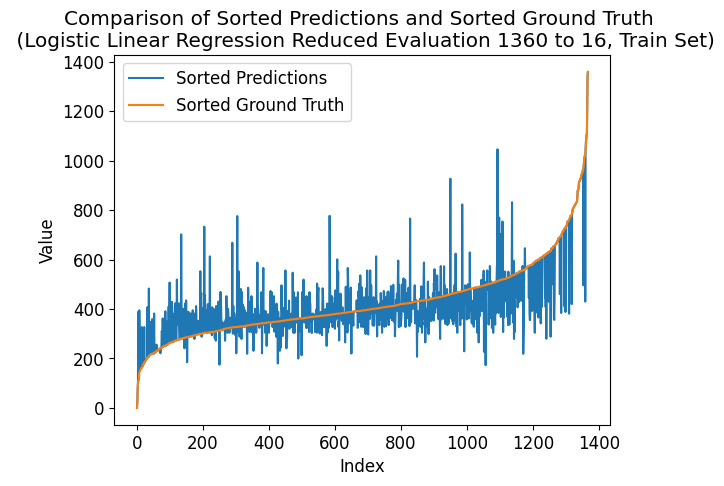

---- ---- ----
class_num = 1376
Number of unique elements: 511
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 3.986111111111111
Correlation coefficient: 0.344048389033826
Coefficient of determination (R-squared score, R2 score): -0.011008366358432387
train eval:
Mean squared error: 1.0635964912280702
Correlation coefficient: 0.839118031259084
Coefficient of determination (R-squared score, R2 score): 0.6855298614235807


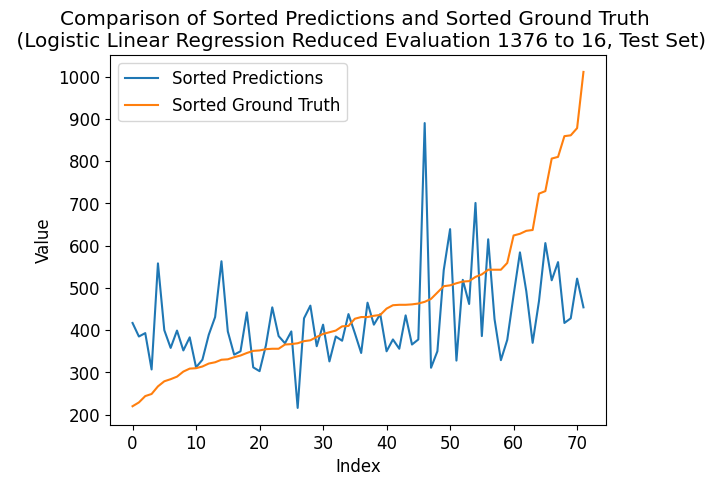

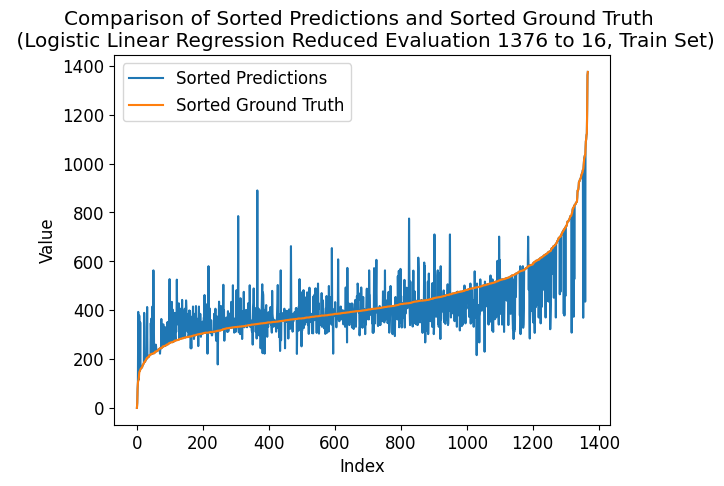

---- ---- ----
class_num = 1392
Number of unique elements: 519
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 4.027777777777778
Correlation coefficient: 0.3611800633782349
Coefficient of determination (R-squared score, R2 score): -0.021576398062527424
train eval:
Mean squared error: 1.0804093567251463
Correlation coefficient: 0.8372478144071908
Coefficient of determination (R-squared score, R2 score): 0.6805588557965996


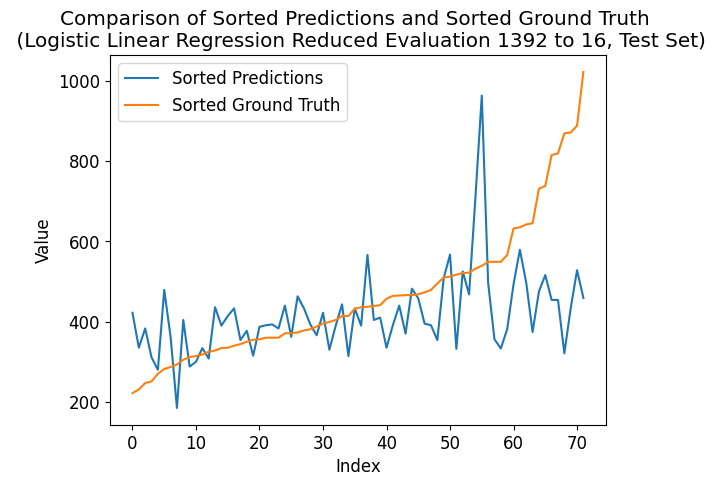

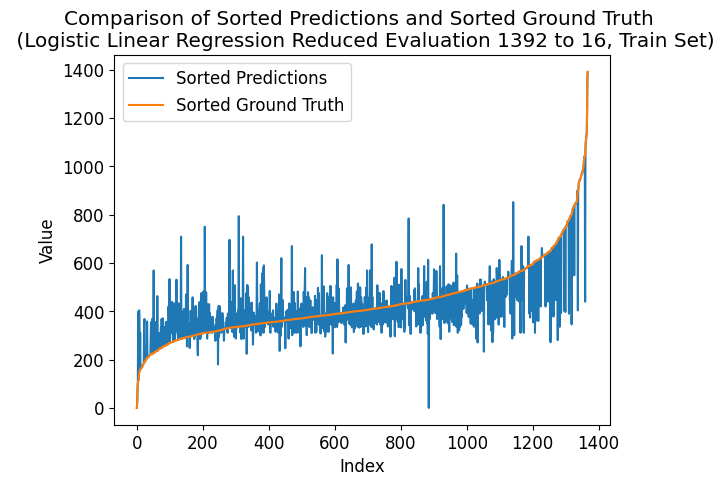

---- ---- ----
class_num = 1408
Number of unique elements: 510
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 4.444444444444445
Correlation coefficient: 0.32220575105907284
Coefficient of determination (R-squared score, R2 score): -0.1272567151034787
train eval:
Mean squared error: 1.1396198830409356
Correlation coefficient: 0.8293762709229742
Coefficient of determination (R-squared score, R2 score): 0.6630522707624483


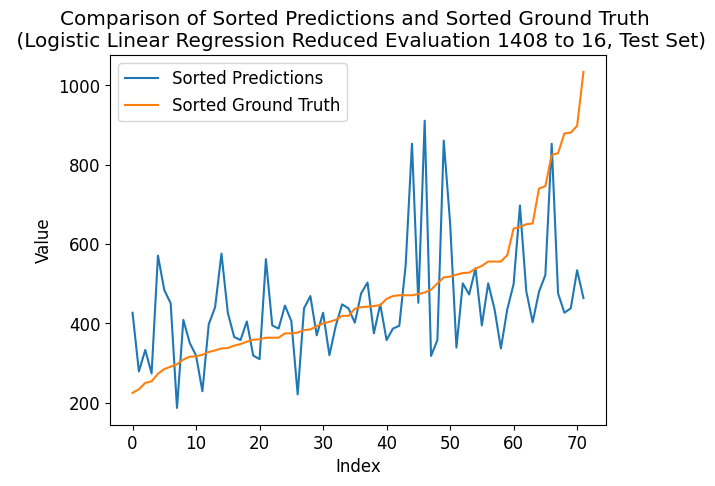

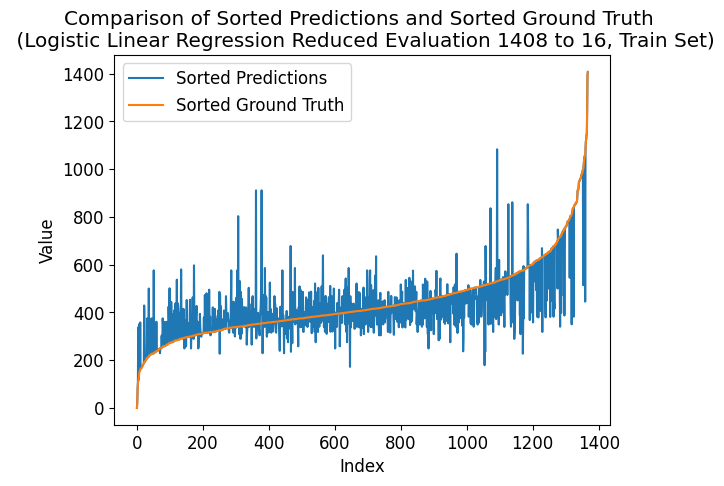

---- ---- ----
class_num = 1424
Number of unique elements: 523
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 3.8055555555555554
Correlation coefficient: 0.37666407530779566
Coefficient of determination (R-squared score, R2 score): 0.034786437692646444
train eval:
Mean squared error: 1.111842105263158
Correlation coefficient: 0.8326718022984398
Coefficient of determination (R-squared score, R2 score): 0.6712652365809391


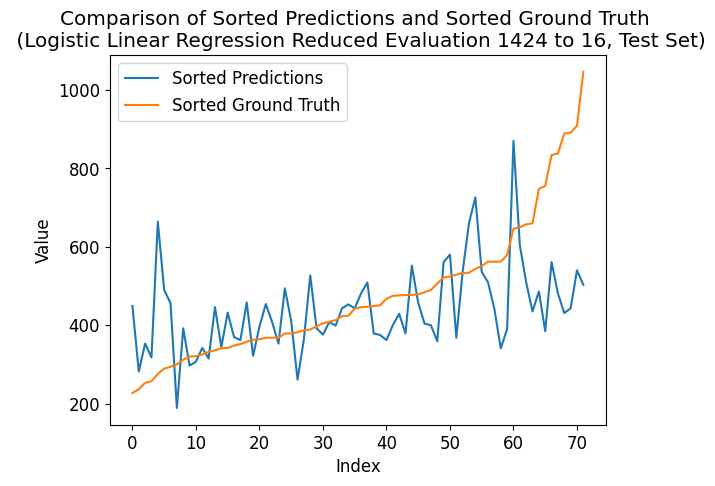

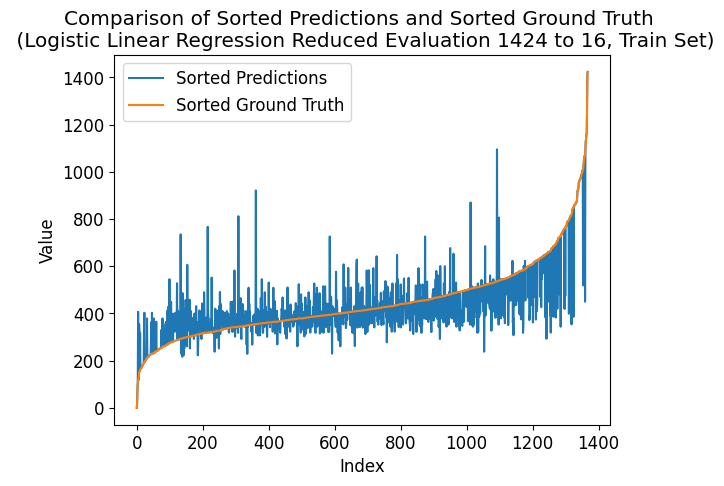

---- ---- ----
class_num = 1440
Number of unique elements: 519
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 3.8333333333333335
Correlation coefficient: 0.3990012392632226
Coefficient of determination (R-squared score, R2 score): 0.02774108322324964
train eval:
Mean squared error: 1.159356725146199
Correlation coefficient: 0.8268538540769912
Coefficient of determination (R-squared score, R2 score): 0.6572167424177313


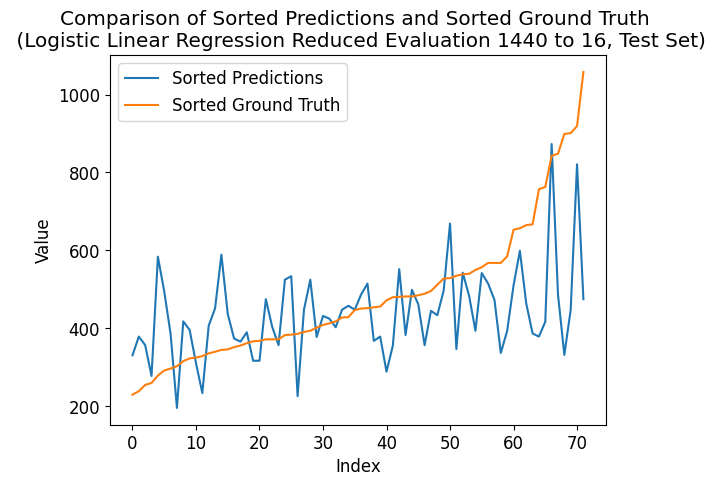

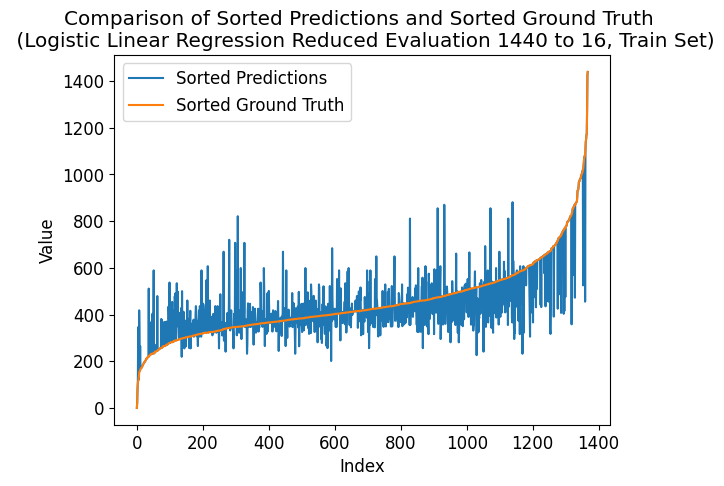

---- ---- ----
class_num = 1456
Number of unique elements: 530
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 3.486111111111111
Correlation coefficient: 0.46288158551816044
Coefficient of determination (R-squared score, R2 score): 0.11580801409070896
train eval:
Mean squared error: 1.1206140350877194
Correlation coefficient: 0.832788863279217
Coefficient of determination (R-squared score, R2 score): 0.6686716684277314


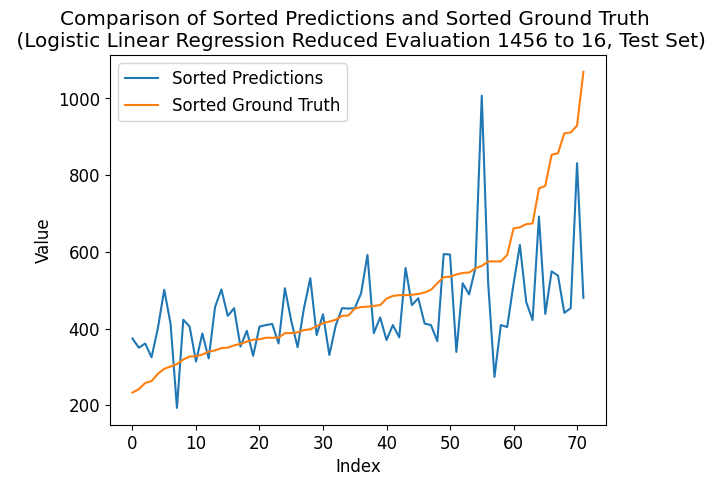

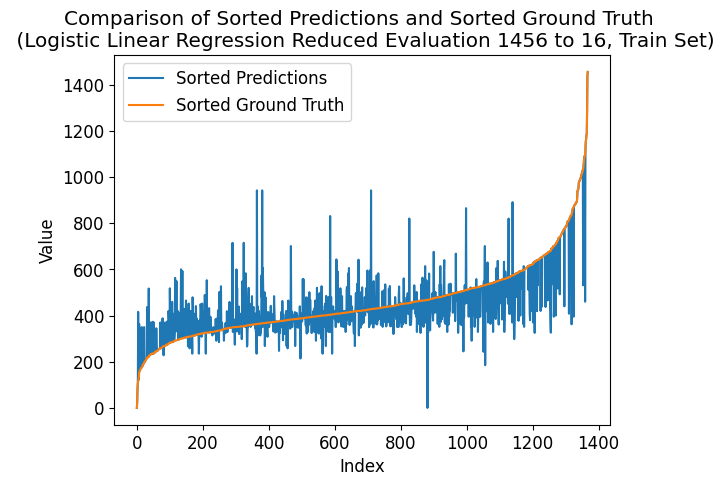

---- ---- ----
class_num = 1472
Number of unique elements: 525
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 4.333333333333333
Correlation coefficient: 0.35037505674205355
Coefficient of determination (R-squared score, R2 score): -0.0990752972258917
train eval:
Mean squared error: 1.1279239766081872
Correlation coefficient: 0.8316401718962996
Coefficient of determination (R-squared score, R2 score): 0.6665103616333918


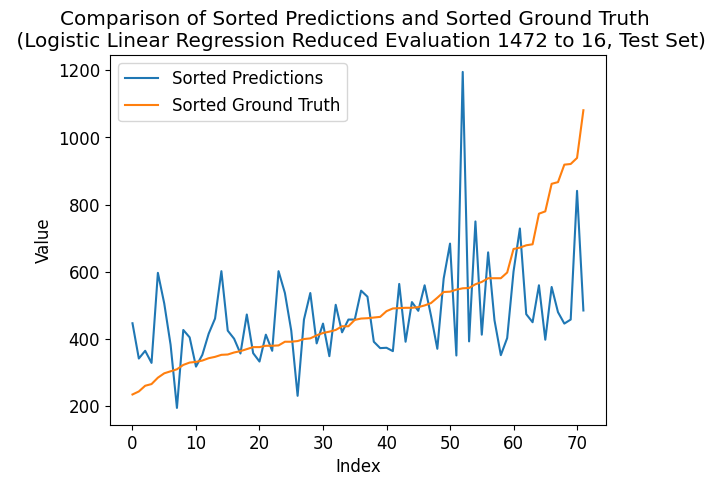

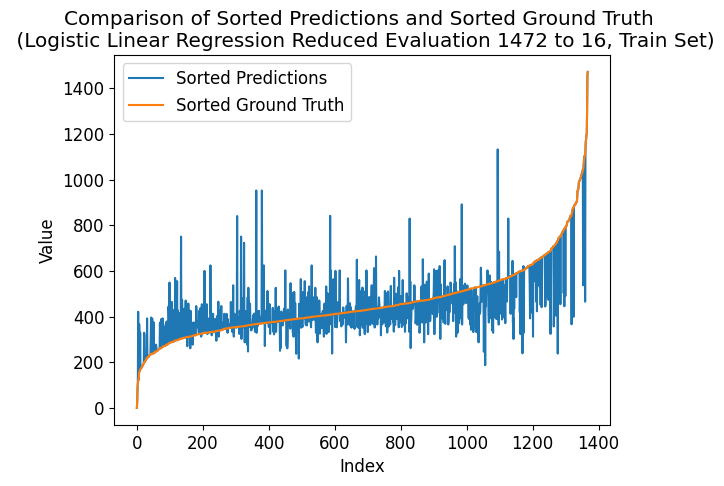

---- ---- ----
class_num = 1488
Number of unique elements: 532
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 3.9027777777777777
Correlation coefficient: 0.3973386098897478
Coefficient of determination (R-squared score, R2 score): 0.0101276970497578
train eval:
Mean squared error: 0.9941520467836257
Correlation coefficient: 0.8501895373823004
Coefficient of determination (R-squared score, R2 score): 0.7060622759698074


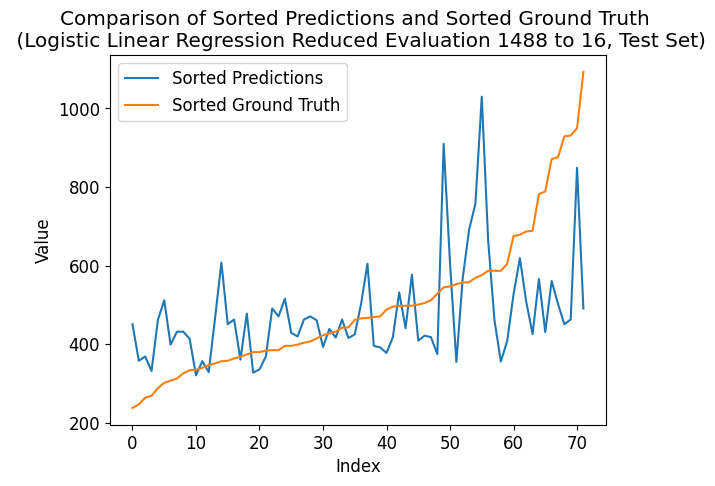

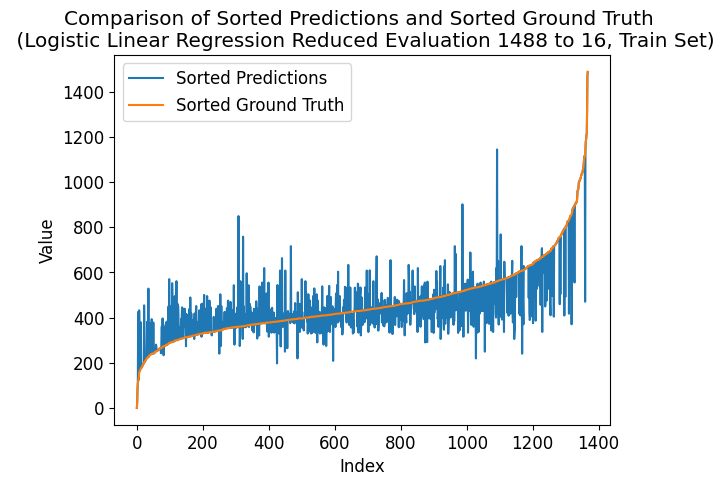

---- ---- ----
class_num = 1504
Number of unique elements: 534
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 3.7777777777777777
Correlation coefficient: 0.3976083689307804
Coefficient of determination (R-squared score, R2 score): 0.041831792162043135
train eval:
Mean squared error: 1.0730994152046784
Correlation coefficient: 0.8408354592901018
Coefficient of determination (R-squared score, R2 score): 0.6827201625909392


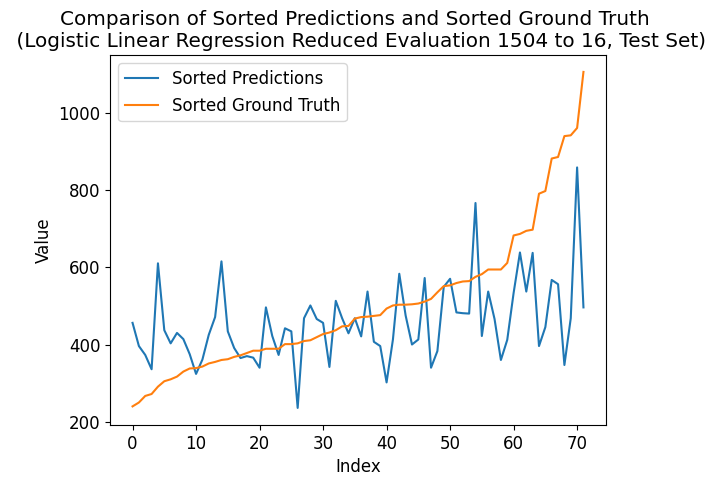

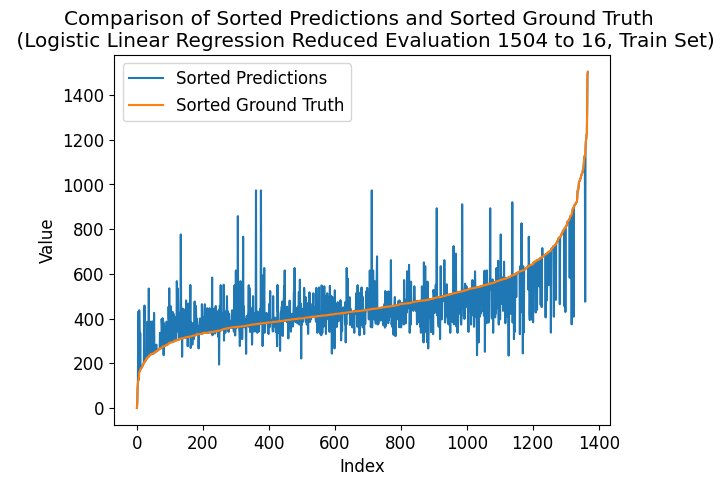

---- ---- ----
class_num = 1520
Number of unique elements: 538
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 3.736111111111111
Correlation coefficient: 0.4395767950620604
Coefficient of determination (R-squared score, R2 score): 0.052399823866138284
train eval:
Mean squared error: 0.9985380116959064
Correlation coefficient: 0.8490027388673501
Coefficient of determination (R-squared score, R2 score): 0.7047654918932036


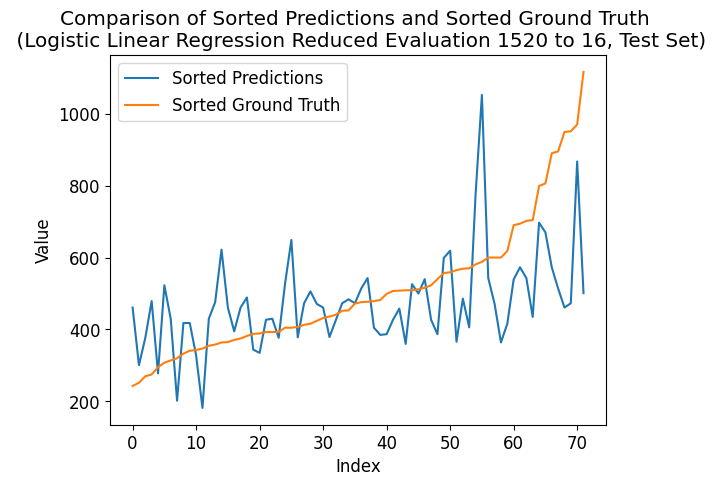

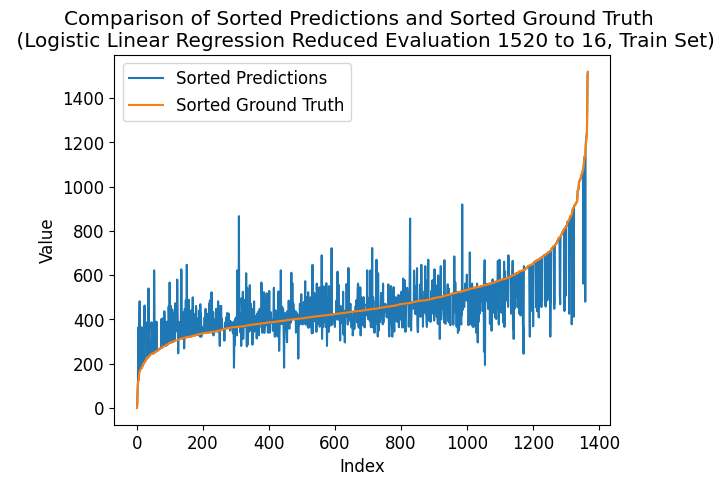

---- ---- ----
class_num = 1536
Number of unique elements: 543
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 4.347222222222222
Correlation coefficient: 0.3112322889339678
Coefficient of determination (R-squared score, R2 score): -0.10259797446059005
train eval:
Mean squared error: 0.9349415204678363
Correlation coefficient: 0.8588087876125522
Coefficient of determination (R-squared score, R2 score): 0.7235688610039586


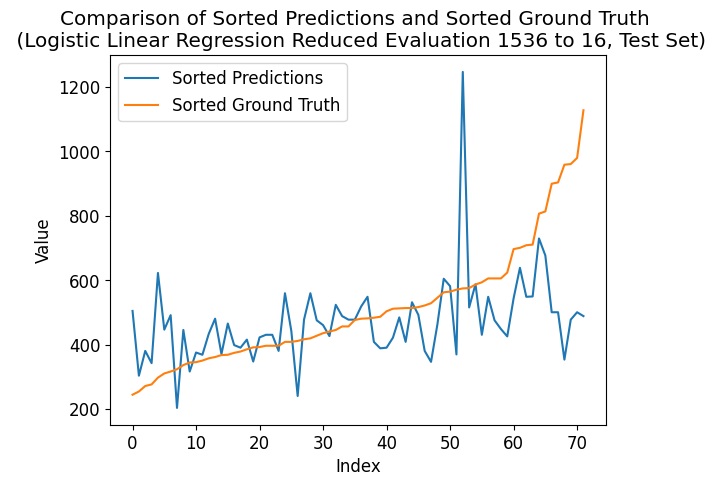

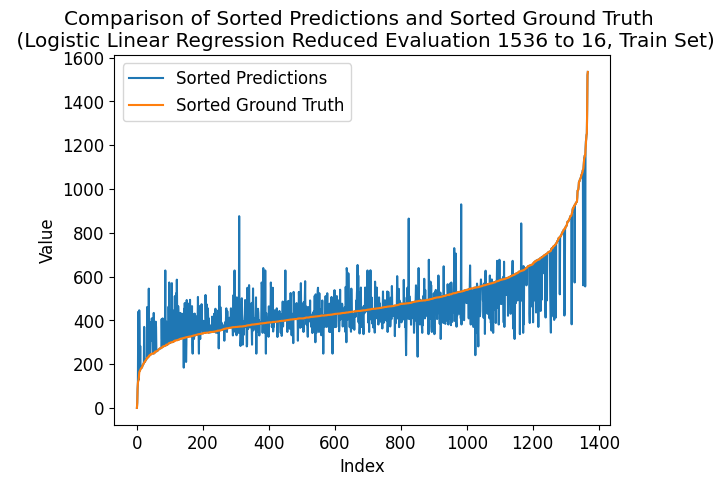

---- ---- ----
class_num = 1552
Number of unique elements: 552
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 4.916666666666667
Correlation coefficient: 0.3376522863225631
Coefficient of determination (R-squared score, R2 score): -0.24702774108322334
train eval:
Mean squared error: 1.182748538011696
Correlation coefficient: 0.8272127868310696
Coefficient of determination (R-squared score, R2 score): 0.6503005606758444


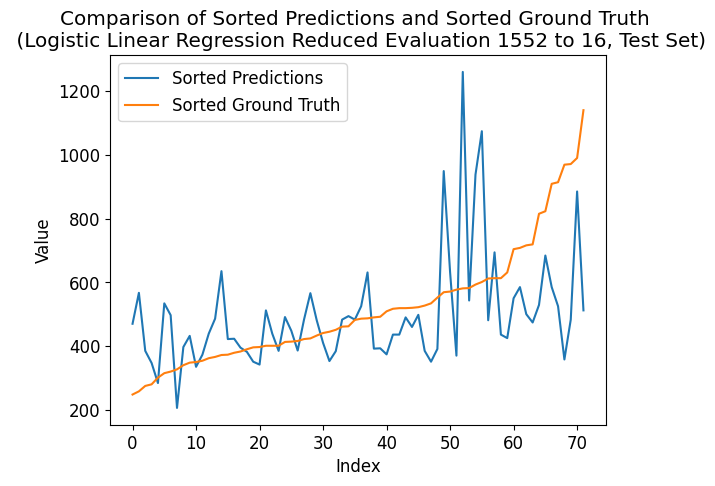

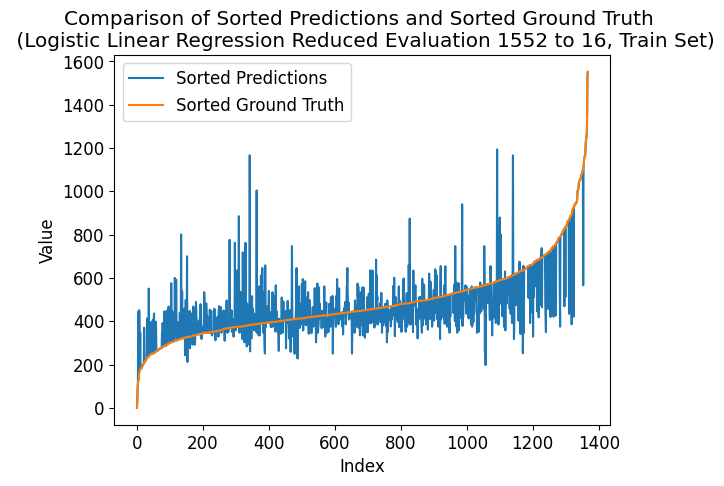

---- ---- ----
class_num = 1568
Number of unique elements: 546
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 3.8333333333333335
Correlation coefficient: 0.36276795113160476
Coefficient of determination (R-squared score, R2 score): 0.02774108322324964
train eval:
Mean squared error: 1.131578947368421
Correlation coefficient: 0.8309722430137153
Coefficient of determination (R-squared score, R2 score): 0.6654297082362219


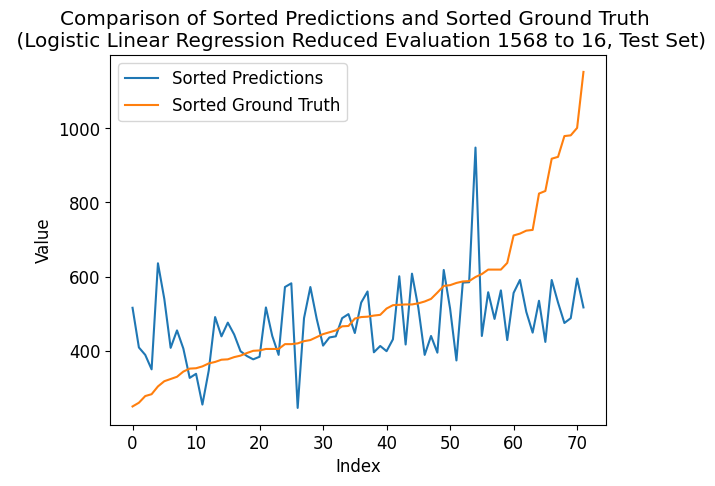

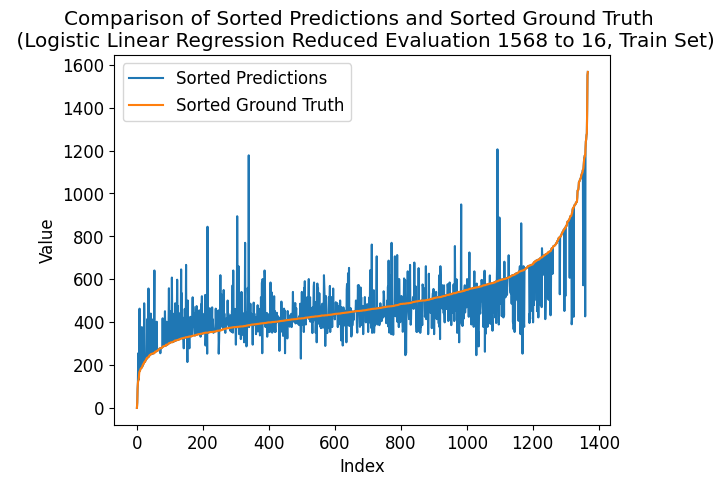

---- ---- ----
class_num = 1584
Number of unique elements: 553
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 3.75
Correlation coefficient: 0.4037425622438564
Coefficient of determination (R-squared score, R2 score): 0.04887714663143994
train eval:
Mean squared error: 1.0635964912280702
Correlation coefficient: 0.8402518880823773
Coefficient of determination (R-squared score, R2 score): 0.6855298614235807


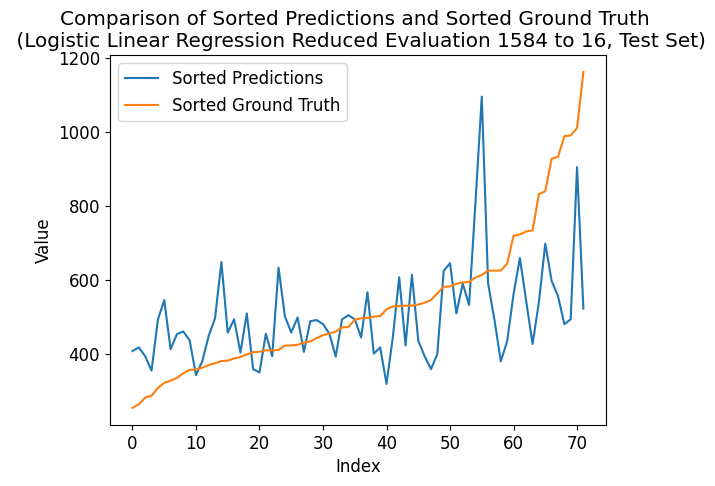

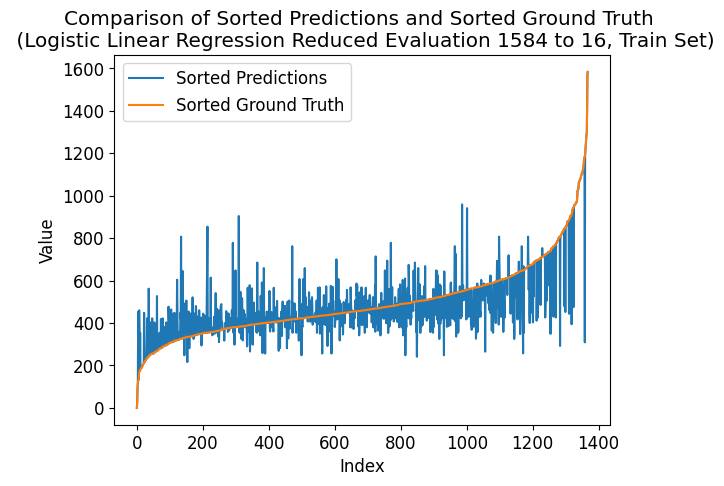

---- ---- ----
class_num = 1600
Number of unique elements: 554
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 3.8055555555555554
Correlation coefficient: 0.3784207614719348
Coefficient of determination (R-squared score, R2 score): 0.034786437692646444
train eval:
Mean squared error: 1.0730994152046784
Correlation coefficient: 0.8394382861035301
Coefficient of determination (R-squared score, R2 score): 0.6827201625909392


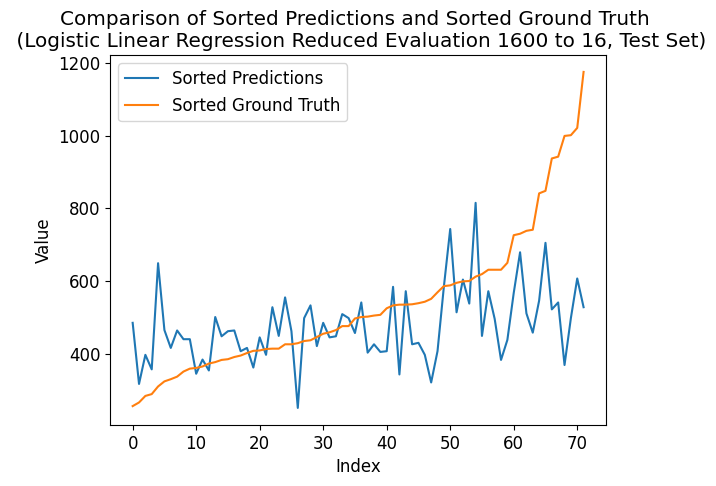

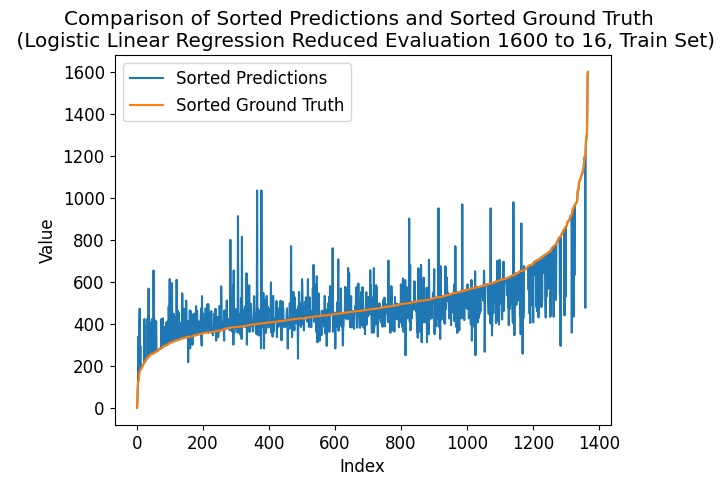

In [105]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
# class_num_array = np.arange(reduced_class_num * 5, reduced_class_num * 40 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



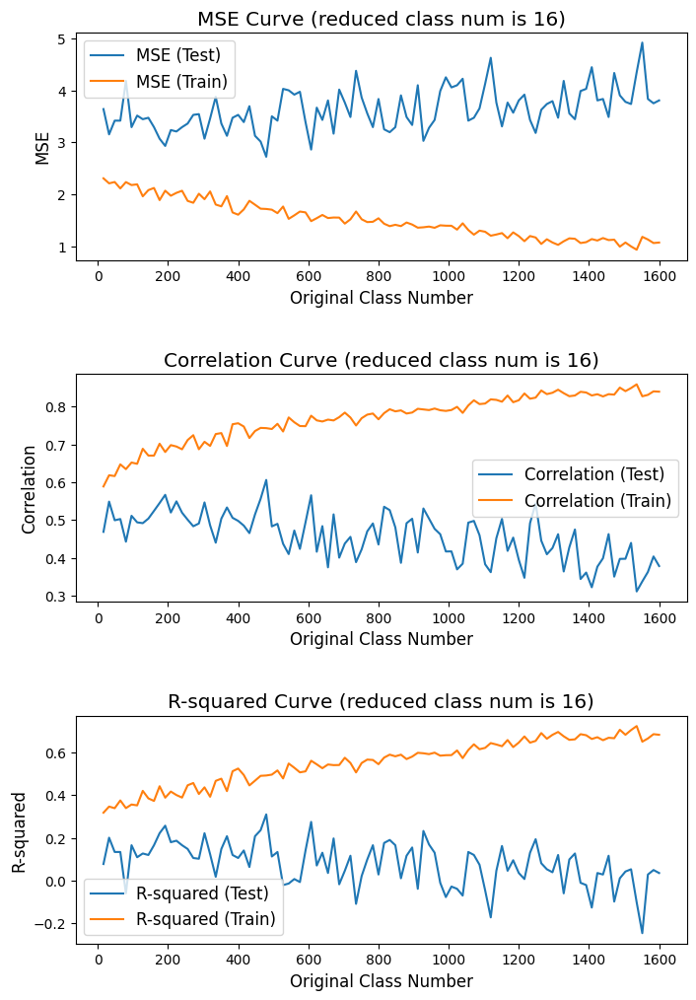

Max Index: 29
Max Original Class Num: 480


In [106]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)

#### Fit and predict (balanced weights)

balanced weights don't improve the fitting, but make it worse.

In [108]:
# independent data
x = group_satcked_green

class_num = 48

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
Unique elements: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 38 39 42 47]
Number of unique elements: 40


In [109]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, class_weight='balanced', multi_class='multinomial')
fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)
# Print the predicted class labels
print(y_pred, y_test)
print(y_pred.shape, y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(40,) (40, 23)
[ 5 27 22 22  9 29 11 25 22 29  5 23  5 10  6  8  8 29 22 10 26 36 11 26
 12 16 22 26 31 34 10  9 29  7 24  6 32 13 20 10  9 34  8 21 14  7 29 28
 19 11  9 20  8 14 10 23 20  3 28  3 12 10 14 11 19  3 13 20 20 12 20 24] [19 13 25 35 13 21 10 18 17 28 15 18  7 16 10  8 10 12 25 29 14 21 12 16
 11 16 13 14  9 18 15 13 18 12 11 10 30 16 14 12 12 12 30 12 12 13 17 28
 11 17  9 15 11 15 16 22 18 10 17  7 18 11 12  9 15 13  8 22 17 11 16 16]
(72,) (72,)


#### Evaluate (balanced weights)

Accuracy: 0.05555555555555555
Correlation coefficient: 0.4046314021861102


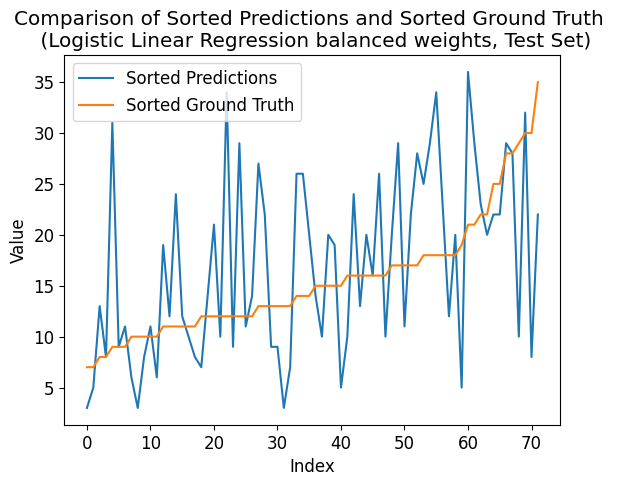

In [110]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_test, y_pred, 'Logistic Linear Regression balanced weights, Test Set')


Accuracy: 0.15862573099415206
Correlation coefficient: 0.5817856709899076


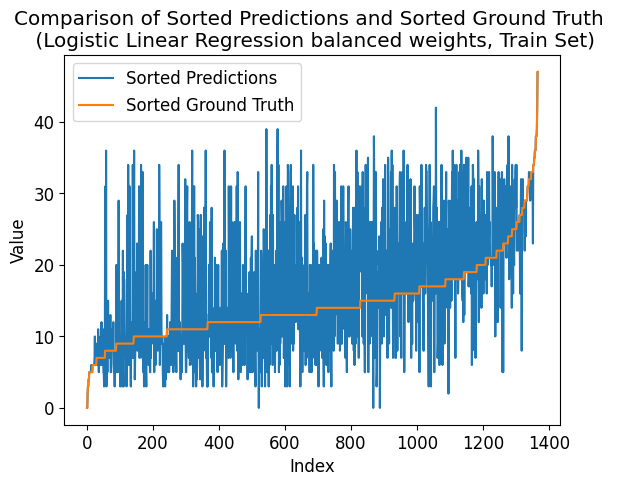

In [111]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_train, y_pred_, 'Logistic Linear Regression balanced weights, Train Set')


## Batch download files

In [113]:
# batch download the plotted figures
# uncomment the code below to download figures if needed

'''
import glob

folder_path = '.'
# file_prefix = 'Comparison (Logistic Linear Regression Reduced Evaluation'
file_prefix = 'Comparison'

# Use glob to find all files with the given prefix in the folder
matching_files = glob.glob(f"{folder_path}/{file_prefix}*")
# print(matching_files)
# # Print the matching file names
# for file_path in matching_files:
#     print(file_path)

import zipfile

zip_filename = 'files.zip'
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    # Add files to the zip file
    for file_path in matching_files:
        zipf.write(file_path)

from google.colab import files
files.download(zip_filename)
'''

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Delete generated files

Use the code cautiously.

In [112]:
# # Specify the path to the root folder
# root_folder = '/content'

# # Get a list of all files in the root folder
# files = os.listdir(root_folder)

# files_to_delete = [file for file in files if file.endswith(".png")]

# for file_ in files_to_delete:
#     print(file_)

# # Iterate over the files and delete them
# for file in files_to_delete:
#     file_path = os.path.join(root_folder, file)
#     if os.path.isfile(file_path):
#         os.remove(file_path)